# 주식분석

Last updated 202501

## 목차

* 6. 백테스트 backtesting.py
  7. 기계학습 백테스트
* 8. BackTrader
* 9. 주가보고서 작성: chatGPT

## 참고
- advances in financial machine learning
- see hello_finance.ipynb

# 6. 백테스트

백테스트는 과거 데이터에 대해 투자전략을 적용하고 그 성과를 평가한다는 의미이다.

비록 과거에 대해 테스트하지만, 어떤 투자 전략이 우수한 성과를 내는지 평가하고 이를 바탕으로 미래의 투자를 결정하는데 있어 필수적인 역할을 한다.

과거의 주가를 분석한다고 해서, 과연 미래를 내다볼 수 있을까?

'과거는 미래를 말해준다'는 가설이 유효하다면 백테스트는 유용하다.

백테스트의 주요 절차는 다음과 같다.

- 투자 전략을 수학적 또는 논리적 규칙으로 설계한다.
- 과거 데이터를 수집하고, 필요한 형식으로 변환한다.
- 투자 전략을 적용하여 거래를 시뮬레이션한다.
- 수익률 등 투자 성과를 분석한다.


## 6.1 투자 전략

투자 전략이란 투자자가 시장에서 수익을 극대화하거나 손실을 최소화하기 위한 방법으로 보자.

백테스팅은 도구일뿐이고 투자 전략이 핵심이고, 어떻게 설계할지가 중요하다.

투자 전략은 다양한 방법이 활용할 수 있다.
- 기술적분석투자: 과거 주가와 거래량을 분석하는데, 전통적으로 주관적인 해석이 많았다. 그보다는 수치화, 자동화하여 과학적 접근이 필요하다. 주로 챠트분석, 패턴인식이나 이동 평균, RSI, MACD 등 지표를 활용한다.
- 가치투자: PER, PBR 등 지표에 따라 내재 가치보다 저평가된 주식에 투자.
- 성장투자: EPS 성장률, 매출 성장률 등 높은 성장 잠재력을 가진 기업의 주식에 투자. 가치와 성장 투자는 종종 반대되는 접근으로, 절충이 필요하기도 하다.
- 배당투자: 안정적 배당금을 지급하는 기업의 주식에 투자
- 퀀트투자: 데이터를 기반으로 수학적 모델과 통계적 기법을 적용한 정량적 투자 방법으로 보통 자동화한다.
- 헤지 전략 (Hedge Strategy): 옵션, 선물, 공매도와 같이 포트폴리오의 위험을 최소화하기 위해 상반된 포지션을 동시에 취하는 전략, 헤지 전략은 독립적인 투자 전략이라기보다, 기존 포트폴리오의 리스크를 줄이는 보조적 성격이 강하다.

어떤 투자 전략이나 주가가 오를지 내릴지 예측할 수 있어야 하는데, 크게 두 접근 방식이 있다:
(1) 시계열 분석: 시계열 자체를 분석하면 여러 신호 장/단기 이평선 돌파, RSI, MACD, Stochastic Oscillator 같은 지표를 신호로 매매한다.
(2) 외생적 변수 분석: 시계열 밖 인과관계를 가지는 미시, 거시적 변수를 분석하거나 한다. 실적, 금리, 경제지표, 뉴스 등에 기반한 신호를 활용할 수 있다.

실제는 어떻게 할까? 단순 신호 매매보다 뿐 아니라, 포지션 규모(레버리지), 청산 조건(손절·익절), 리스크 관리(변동성·상관관계 고려)가 전략 성과에 더 큰 영향을 미친다.
- 단기 매매: 기술적 지표 중심 (MA, RSI, MACD)
- 장기/포트폴리오: 재무/거시경제 지표 결합

투자 전략이 매우 성공적이라고 하자. 그 알고리즘은 매우 높은 가치를 가지게 된다. 실로 많은 투자 기관이나 트레이더는 자신만의 전략을 비공개로 유지하며, 알고리즘이 외부로 유출되지 않도록 철저히 보호한다.

높은 수익률을 내는 전략이 알려지는 경우에도 사실 문제가 될 수 있다. 시장 참여자들이 모두 같은 전략을 사용하면, 시장에 미치는 영향으로 인해 전략의 효과가 감소할 수 있다.


## 6.2 라이브러리

백테스팅은 필수적이라고 볼 수 있는 만큼, 많은 라이브러리가 발표되어 왔다.

### 멀티종목, 실전형 Backtrader

독립적인 개발자에 의해 개발된 백테스팅 라이브러리로, 오픈 소스로 제공되며 커뮤니티에 의해 활발히 유지보수되고 있다.
전략을 클래스로 정의하고, 간단하게 백테스팅을 수행할 수 있고, Interactive Brokers(IB)나 Oanda와 같은 브로커를 통해 실시간 거래를 수행할 수 있다.

### 단일종목, 가볍고 빠른 backtesting.py

백테스팅을 간단하고, 가볍게 시작하려면 backtesting.py가 적합하다.

의존하는 외부 라이브러리가 상대적으로 적어, 설치와 사용이 간편하다.

backtesting.py는 기본적으로 Python 3.6 이상에서 작동하며, 최신 버전 3.7, 3.8, 3.9 등에서도 가능하다.

backtesting.py는 기본적으로 Bokeh를 사용하여 백테스팅 결과를 시각화한다 (반면에 Backtrader는 matplotlib을 사용한다)

### 윈도우에서 설치가 까다롭고, 개발이 멈춘듯 zipline

Zipline은 Quantopian에서 개발된 백테스팅 라이브러리로, 현재 오픈 소스로 공개되어 있고 더 이상 개발이 진행되지 않고 있는 것으로 보인다. 

주로 Quantopian 플랫폼에서 QuantConnect 등과 통합하여 사용 가능하다 (QantConnect: 클라우드 기반, 사용료 있다)

빠른 실행을 위해 데이터와 알고리즘이 벡터화되어 있어 큰 규모의 데이터를 효율적이다. 주로 백테스팅에 초점을 맞추고 있어, 실시간 트레이딩에는 적합하지 않다.
처음 설정할 때 다소 복잡할 수 있으며, 특히 Windows 환경에서의 설치가 까다로울 수 있고, 가능하다면 Linux나 macOS에서 사용을 권장한다.

zipline 설치 중에 "error: failed building wheel for h5py"라는 메시지는 h5py 라이브러리를 빌드(컴파일)하지 못했다는 뜻이다.
- h5py는 C 기반 라이브러리(HDF5)를 사용하는데, Python이 32비트 버전일 경우 빌드가 잘 안되거나 wheel(미리 컴파일된 패키지)이 제공되지 않아서 이런 문제가 발생한다. 
- 해결책은 64비트 Python 설치 + pip/setuptools/wheel 업그레이드(pip install --upgrade pip setuptools wheel)한다.

Quantopian의 종료 이후, 라이브러리 업데이트가 더디고, 최신 Python 버전과의 호환이 어려울 수 있으며 Python 3.6에서 잘 작동한다.

zipline-reloaded은 zipline을 이어받아 개발을 지속하고 있다. 그래도 import zipline으로 라이브러리를 사용한다.
python 3.7, 3.8, 3.9 64비트를 지원한다.

그 외:
- Quantiacs: Python과 MATLAB으로 전략을 코딩, 알고리즘 트레이딩 대회를 운영 
- Alphalens 알파 팩터 분석, Quantopian에서 사용하던 도구 중 하나이다.
- Quantlib: 금융 도구 및 파생상품 가격 계산 라이브러리로 백테스팅보다는 금융 공학, 옵션, 이자율 모델링 등에 중점을 둠.
- TradingView: 웹 기반 차트 및 기술적 분석 도구로, Pine Script를 사용하여 전략을 작성 가능.
- pycaret: 머신러닝 자동화 도구로 퀀트 전략 개발에 도움을 줌.
- bt (https://github.com/pmorissette/bt): 유연하고 강력한 포트폴리오 백테스팅 프레임워크
- PyAlgoTrade -> Basana (https://github.com/gbeced/basana): PyAlgoTrade는 개발이 멈추고 Basana가 뒤따르고 있다.
- VectorBT: 벡터화된 백테스팅 라이브러리, Pandas와 통합이 강점 (https://github.com/twopirllc/pandasta/blob/main/examples/VectorBT_Backtest_with_Pandas_TA.ipynb)


## 6.3 backtesting.py

여기서는 backtesting.py를 사용해서 백테스트를 수행해보자.

### 설치

먼저 backtesting.py를 배워보자. 설치하려면 pip install backtesting

### 주요 클래스 가운데 첫째 Strategy 클래스

백테스트를 하려면, 무엇보다 먼저 투자전략을 만들어야 한다 (Strategy 클래스를 통해 구현된다).

Strategy는 주가 시계열이 흘러가면서 어느 시점에 매수 또는 매도할지 관련하여 필요한 메소드와 속성을 가지고 있다.

#### 속성

주요 속성을 보자:
- data: Backtest()에 넘겨준 데이터가 여기에 전달된다.
    - (1) 윈도우 데이터 self.data: 원본에서 OHLCV 컬럼만 특별 취급 (따라서 사용자가 추가한 데이터에 접근할 수 없다), 슬라이딩 윈도우 방식으로 변환된 데이터 (numpy.ndarray). 윈도우 크기는 ```len(self.data) - 1```. next() 실행 시점까지의 데이터만 노출.
        - self.data.Close[-1] -> -1은 현재 종가
        - self.data.Close[-2] -> 직전 종가
    - (2) 원본 데이터프레임 self.data.df: 원본 전체 데이터셋 (pandas.DataFrame), 사용자가 제공한 기본적 OHLCV와 함께 사용자가 추가한 모든 컬럼을 포함하고 있다.
        - self.data.df.Close.iloc[-1] -> 전체 데이터의 마지막 종가 (테스트가 완료되는 맨 마지막 끝 시점)
        - 추가된 데이터를 사용하려면 self.data.df를 사용해야 한다 (예: 계산된 지표나 추가 컬럼 등). self.data.RSI[-1] 같은 식은 안 되고 self.data.df["RSI"].iloc[-1] 처럼 접근한다.

- position: 현재 포지션 상태를 나타낸다. (롱 포지션 또는 숏 포지션 여부 등)
예를 들어, self.position.is_long은 현재 롱 포지션(매수)인지 여부를 의미한다.

- trades: 현재 진행 중인 모든 트레이드의 목록이다.

- closed_trades: 이미 종료된 트레이드 목록이다.

- orders: 현재 활성화된 주문 목록이다.

- equity: 현재 투자금 전액 = 초기 투자금 + 포지션의 현재 가치로 계산된다.

#### 메소드

주요 메소드는 다음과 같다.
- init(): 초기화 작업을 수행한다.
필요한 데이터나 객체를 설정하고, 전략 시작 전에 한 번만 호출된다.
예를 들어, 기술적 지표 계산이나 필요한 데이터를 저장할 때 사용된다.

- I(): 전략에 추가할 지표를 생성한다.

- next(): 전략의 핵심 논리가 구현되는 메소드로, 데이터의 각 행(하루의 시가, 고가, 저가, 종가)에 대해 한 번씩 호출된다.
super().next()를 사용하면 부모 클래스의 next() 메소드를 호출할 수 있다.

- buy() & sell(): 매수 및 매도 주문을 생성하는 함수. 수량을 지정하지 않으면 1주 단위로 매매가 이루어진다. 매매 명령 후 자동으로 포지션이 갱신되고, 주문이 실행된다.

    - self.buy(): 현금 한도로 풀 매수가 기본 값. 포지션이 없을 때 이 명령을 실행하면, 사용자가 보유한 자금의 전체를 사용하여 매수한다.
    - self.sell(): 현재 보유분 풀 매도(청산)가 기본 값.


- close(): 사용자가 호출하며 자동으로 호출되지 않는다. 포지션 청산은 새로운 주문으로 취급되어, Order를 자동으로 생성한다. 
    - 롱 포지션이 있는 경우 -> sell 주문이 생성
    - 숏 포지션이 있는 경우 -> buy 주문이 생성
    - 주문이 체결되면 해당 포지션이 완전히 종료되고 self.position.size==0이 된다. 다시 중립 상태로 돌아가며, is_long와 is_short 모두 False가 된다. 이는 실제 거래에서 청산하는 주문과 동일하게 체결로 기록 된다 (trade execution).

#### 투자전략 클래스 템플릿

부모 전략을 상속받아 만드는데, 전략 클래스를 의미있는 코드는 없지만 다음과 같이 만든다.

```
class MyStrategy(bt.Strategy):
    params = (("ma1", 20), )
    def __init__(self):

    def log(self, txt):

    def notify_order(self, order):

    def notify_trade(self, trade):

    def next(self):

```

### MA 투자전략

이동평균전략을 실행해보자.

- 매수조건: 이동평균 상향돌파
- 매도조건: 이동평균 하향돌파

In [1]:
from backtesting import Backtest, Strategy
from backtesting.lib import crossover

from backtesting.test import SMA, GOOG
import os

class SmaCross(Strategy):
    n1 = 30 #20
    n2 = 200 #50

    def init(self):
        close = self.data.Close #데이터프레임 df['Close'].values
        self.ma1 = self.I(SMA, close, self.n1) # n1기간의 이동평균을 계산
        self.ma2 = self.I(SMA, close, self.n2)

    def next(self):
        #print(f"{len(self.data)} 일자:{self.data.index[-1]} 보유: {self.position.size} \t보유자금: {self.equity:.1f}")
        if crossover(self.ma1, self.ma2):
            print(f"[+매수] 일자:{self.data.index[-1]} 직전보유: {self.position.size} 종가: {self.data.Close[-1]}" \
                    f"\t보유자금: {self.equity:.1f}")
            self.buy() # 기본값 1, 전량

        elif crossover(self.ma2, self.ma1):
            print(f"[-매도] 일자:{self.data.index[-1]} 직전보유: {self.position.size} 종가: {self.data.Close[-1]}")
            self.sell()

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:50: UserWarning: Jupyter Notebook detected. Setting Bokeh output to notebook. This may not work in Jupyter clients without JavaScript support (e.g. PyCharm, Spyder IDE). Reset with `backtesting.set_bokeh_output(notebook=False)`.
  warnings.warn('Jupyter Notebook detected. '


Loading BokehJS ...

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\test\__init__.py:8: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  return pd.read_csv(join(dirname(__file__), filename),
C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\test\__init__.py:8: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  return pd.read_csv(join(dirname(__file__), filename),


경고 메시지: backtesting.py는 기본적으로 Bokeh 라이브러리를 이용해 차트를 그린다. 환경이 Jupyter Notebook인지 자동으로 감지하면, output_notebook() 모드로 설정해서, 노트북 셀 안에서 JavaScript 기반 차트를 표시하려고 한다는 의미이다.

- 코드 self.I(SMA, close, self.n1): SMA함수를 종가에 적용해서 n1기간의 이동평균을 지표화 (I() 함수)
- 코드 next() 함수의 인덱스 -1는 슬라이딩 윈도우의 현재 바를 의미한다 (슬라이딩 윈도우에서 -1이 현재 바로 해석되고, -2, -3은 직전, 그 이전의 바를 가리키게 된다). 매회 출력하면 다음과 같다.
```
    201 일자:2010-10-21 00:00:00 보유: 0 	보유자금: 1000000.0   # 인덱스는 이동평균 긴 것부터 시작한다는 의미
    202 일자:2010-10-22 00:00:00 보유: 0 	보유자금: 1000000.0
    203 일자:2010-10-25 00:00:00 보유: 0 	보유자금: 1000000.0
    ...생략...
``` 
    - 주의: backtesting.py에서는 self.data.Close[-1]이 현재, 그러나 곧 배우는 backtrader에서는 self.data.close[0]가 현재를 가리키므로 주의한다. backtrader에서는 배열처럼 생각하는 게 아니라 "현재 시점이 항상 기준"이라는 철학 때문에 0: 현재, -1: 한칸전, -2: 두칸전)

- 코드 self.data.df, self.data의 차이

    - self.data: Open, High, Low, Close, Volume과 같은 기본적인 OHLCV 데이터만 포함하고 있다 (numpy array)
    - self.data.df: 사용자가 제공한 기본적 OHLCV와 함께 사용자가 추가한 모든 컬럼을 포함하고 있다 (pandas DataFrame)

- 코드 print문의 self.equity는 현재 투자금 전액 (broker.cash는 제공되지 않는다), self.position.size는 보유하고 있는 주식의 수량 (order.size는 출력할 수 없다)
- 코드 cash=100000000: cash를 설정하지 않으면 Backtesting.py는 30,000 Backtrader는 100,000. cash의 기본 단위는 라이브러리에 의해 달러화(USD)로 고정된 것이 아니라, 사용자가 가정하는 통화에 맞추어 해석한다.
- 코드 exclusive_orders=True: 주문이 동시에 실행되지 않도록 하나의 주문이 완료된 후에야 다음 주문이 실행


### 두번째 백테스트 클래스: 메인함수 run()으로 결과 산출, plot()으로 시각화

이 클래스는 데이터를 입력받고 그 위에 투자전략을 전략을 테스트 또는 시뮬레이션하는데, 메인함수에 해당하는 run()을 통해 실행된다.

주요 멤버변수는 다음과 같다.
- data: 백테스트에 사용되는 과거 데이터를 보통 Pandas DataFrame 또는 Numpy Array 형태로 저장한다. 일시 (인덱스), Open, High, Low, Close, Volume(선택적) 컬럼을 가진다. 다른 컬럼을 추가할 수 있다. DataFrame 형태의 가격 데이터 (OHLC 필수)
- strategy: 백테스트에 사용할 전략 클래스
- cash: 초기 자본을 설정, 예를 들어, 1백만 원으로 전략을 테스트하고 싶다면 이 값을 설정한다.
- commission: 거래마다 차감할 수수료 비율 (기본값: 0)
- trade_on_close: 당일 종가로 거래할지 여부
- hedging=False: 헤징전략을 사용할지 여부
- exclusive_orders=False  하나의 주문이 완료된 후에야 다음 주문이 실행할지 여부, 동시에 여러 주문이 발생하지 않도록 제어

주요 멤버함수는 다음과 같다.
- run(): 백테스트를 실행하는 시작 함수이다. 전략을 데이터에 적용하고, 결과를 산출한다.
- optimize() 전략의 파라미터를 최적화
- plot(): 백테스트 결과를 그래프나 차트 형태로 결과를 보여준다.

run()하기 위해서는 이렇게 Backtest(data, strategy, *, cash, commission, margin, trade_on_close=False, hedging=False, exclusive_orders=False)에 필요한 데이터를 넘겨야 한다. 그 데이터를 기반으로 다음 절차를 수행한다.
- 데이터 준비: 과거 데이터를 로드하고 (data 필드: pd.DataFrame의 과거 데이터), 백테스트에 사용할 수 있도록 준비한다. 또한 초기 투자금 (cash 변수), 거래 수수료 (commision 변수), 마진 (필요 시, margin 변수) 도 설정한다.
- 전략 실행: 준비된 데이터에 전략을 적용하여 (만들어 놓은 Strategy 클래스), 매수/매도 신호를 생성한다. 이 과정에서 포지션 관리, 리스크 관리 등의 규칙이 적용된다.
- 결과 저장: 백테스트가 끝나면, 성과 지표를 stats 속성에 저장.
- 결과 시각화: 필요에 따라 plot() 메서드를 사용하여 결과를 시각화할 수 있다. 이를 통해 매매 시점, 포트폴리오 가치 변화 등을 확인할 수 있다.

In [2]:
import yfinance as yf

#sse2020_2024 = yf.download("005930.KS", start="2020-01-01", end="2024-07-20")
#df = sse2020_2024.copy() # 깊은 복사

import pandas as pd
import os
#ohlcv = pd.read_csv(os.path.join('data','my.csv'), index_col=0, parse_dates=True)
#sse2010_2024df=pd.read_csv(os.path.join('data','sse2010_2024.csv'), index_col=0, parse_dates=True)
sseTicker = yf.Ticker("005930.KS")
sse2010_2024 = sseTicker.history(start="2010-01-01", end="2024-12-31")
sse2010_2024df = sse2010_2024.copy() # 깊은 복사
sse2010_2024df.head

<bound method NDFrame.head of                                    Open          High           Low  \
Date                                                                  
2010-01-04 00:00:00+09:00  11889.527895  11978.366211  11845.108738   
2010-01-05 00:00:00+09:00  12230.071230  12274.490375  12067.201032   
2010-01-06 00:00:00+09:00  12274.493300  12452.169922  12230.074144   
2010-01-07 00:00:00+09:00  12452.170604  12452.170604  12037.591797   
2010-01-08 00:00:00+09:00  12141.237558  12156.043945  11933.948136   
...                                 ...           ...           ...   
2024-12-23 00:00:00+09:00  52403.666574  52992.471817  52305.532367   
2024-12-24 00:00:00+09:00  52698.072230  53483.145931  52599.938017   
2024-12-26 00:00:00+09:00  53483.145406  53581.279618  52501.803288   
2024-12-27 00:00:00+09:00  52859.791739  53452.611834  52563.381692   
2024-12-30 00:00:00+09:00  52662.182250  53353.805657  52464.575562   

                                  Close    Vol

In [3]:
#bt = Backtest(GOOG, SmaCross, commission=.002, exclusive_orders=True)
bt = Backtest(sse2010_2024df, SmaCross, commission=.002, cash=1000000, exclusive_orders=True)
stats = bt.run() # stats: 백테스트 결과를 저장 (수익률, 최대 낙폭, 거래 횟수 등 다양한 성과 지표가 포함된다).
print(stats)

[+매수] 일자:2010-12-01 00:00:00+09:00 직전보유: 0 종가: 12217.9814453125	보유자금: 1000000.0
[-매도] 일자:2011-06-24 00:00:00+09:00 직전보유: 80 종가: 12762.8134765625
[+매수] 일자:2011-11-01 00:00:00+09:00 직전보유: -81 종가: 14838.947265625	보유자금: 849795.1
[-매도] 일자:2013-06-27 00:00:00+09:00 직전보유: 59 종가: 20284.14453125
[+매수] 일자:2013-10-29 00:00:00+09:00 직전보유: -59 종가: 22571.60546875	보유자금: 1093604.1
[-매도] 일자:2014-01-09 00:00:00+09:00 직전보유: 48 종가: 19505.806640625
[+매수] 일자:2014-04-28 00:00:00+09:00 직전보유: -48 종가: 21234.556640625	보유자금: 867538.0
[-매도] 일자:2014-07-09 00:00:00+09:00 직전보유: 40 종가: 20018.216796875
[+매수] 일자:2015-01-02 00:00:00+09:00 직전보유: -40 종가: 20652.791015625	보유자금: 788853.8
[-매도] 일자:2015-06-26 00:00:00+09:00 직전보유: 37 종가: 19845.3125
[+매수] 일자:2015-11-18 00:00:00+09:00 직전보유: -37 종가: 19907.4765625	보유자금: 737308.8
[-매도] 일자:2016-01-08 00:00:00+09:00 직전보유: 36 종가: 18490.115234375
[+매수] 일자:2016-03-23 00:00:00+09:00 직전보유: -36 종가: 20195.443359375	보유자금: 594871.5
[-매도] 일자:2018-02-19 00:00:00+09:00 직전보유: 29 종가: 39520.58203125


- 코드 Backtest(sse2010_2024df...): Backtest 클래스는 첫 번째 인자로 DataFrame을 받아야 한다. 따라서 파일 경로를 직접 전달하는 대신, 파일을 읽어 DataFrame으로 전달해야 한다.

- 로그 설명:
    - 이동평균값에서 NaN이 없어지는 동안은 position이 없다
    - 이동평균전략이 적용되면서 position.size == 0으로 유지된다. 투자금(투자금+주식가치) 변화도 당연히 없다.
    - buy() 매수하면 position.size==매수량 (+ 양수값을 가진다). 종가기준으로 주문체결되고, 투자금도 계산된다.
    - sell() 매도하면 position.size==매도량 (- 음수값을 가진다). 종가기준으로 주문체결되고, 투자금도 계산된다.

- 출력 설명: 전략의 수익률 Return [%] 66.74% (15년 동안), 보유전략 Buy & Hold Return [%]  338.81%에 비해 매우 열등
    - 전략이 전체 시작 ~ 끝 기간 동안 시장에 노출된 시간을 백분율로 나타낸 값. 93.8%라는 값은 백테스트 기간 중 거의 대부분의 시간 동안 포지션을 유지했음을 의미한다.
    - Equity Final: 백테스팅이 끝난 시점에서 계좌의 총 자산, 죽 전략이 적용되어 최종적으로 얻게 된 금액을 의미한다.
    - Return [%] 백테스팅 기간 동안의 총 수익률, 초기 자본 대비 최종 자본의 증가율(%)로 계산된다.    
    - Buy & Hold Return [%]: 338.81% 
    동일한 기간 동안 단순히 자산을 매수 후 보유했을 때 얻을 수 있었던 수익률이다. 이 지표와 전략의 수익률을 비교하여 전략의 성과를 평가할 수 있다.
    - Return (Ann.) [%]: 연평균 3.54%
    연평균 수익률로, 전략이 연간으로 얼마나 수익을 올렸는지 보여준다.
    - Volatility (Ann.) [%]: 26.06% (변동성 큼)
    연간 변동성 지표이다. 전략의 수익률이 연간 얼마나 변동했는지를 보여주는 지표로, 리스크를 평가하는 데 사용된다.
    - Sharpe Ratio: 0.136 (매우 낮음) 초과수익률/분산으로 계산하고 분산(위험) 대비 초과수익률을 말하는 것으로, 일반적으로 >1 이상 기대한다 (2이상 우수).
    - Sortino Ratio: 0.204 (손실 리스크 대비 보상도 낮음) 초과수익률/하락분의 분산, Sharpe Ratio와 비슷하지만, 하락분에 대한 위험만 감안한다 (2이상 우수).
    - Calmar Ratio: 0.059 (드로다운 대비 성과가 형편없음) 연평균수익률(CAGR)/최대낙폭(드로우다운)으로 계산되고, 높을수록 좋다 (3이상이면 우)

    - 드로다운 (손실) 
        - **Max. Drawdown \[%]** → -59.36% (최대 반토막 이상 손실 경험)
        - **Avg. Drawdown \[%]** → -10.50%
        - **Max. Drawdown Duration** → 2919일 (약 8년간 회복 못 함)
- 왜 Buy & Hold보다 성과가 낮을까?
    - **장기 우상향 자산**이라서 단순히 들고 있었던 쪽이 훨씬 유리. SMA 크로스 같은 추세 추종 전략은 “중간 조정” 구간에서 오히려 손실을 반복.
    - 매매 횟수도 적고(26회) 승률도 30%밖에 안 되니, 좋은 장기 상승장에서 수익을 갉아먹음.
    - **드로다운 문제**: Buy & Hold보다 드로다운이 낮을 줄 기대하지만, 실제로는 -59%까지 당해서 리스크 관리에도 실패.

backtesting.py는 기본적으로 결과를 Bokeh를 사용하여 시각화한다. 

주의: Bokeh 버전 문제: python 3.9는 bokeh 2.4.3이나 3.2.1에서 잘 그려진다 (python 3.12, bokeh 3.5에서).
- 기본적으로 backtesting.py를 설치하면, backtesting 0.3.3과 Bokeh 최근 버전 (3.4.3)이 함께 설치된다. 호환성 문제가 발생할 수 있고, Bokeh 2.4.3이 안정적인 선택이다. 3.2.1도 잘 된다. 단 주피터 커널을 샷다운 하지 않으면 이전 버전을 로딩하므로 재설치 효과가 없다 (그냥 주피터 노트북을 닫고 다시 열면). 설치하면서 matplotlib의 버전을 재설치할 수 있으니 주의하자.
- 특정 버전을 설치하려면 pip install bokeh==2.4.3

In [4]:
bt.plot()

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:455: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df2 = (df.assign(_width=1).set_index('datetime')


GridPlot(id='p1309', ...)

- 코드 bt.plot(): 기본으로 사용하는 Bokeh의 챠트를 그린다.

- 주의 BokehDeprecationWarning: Passing lists of formats for DatetimeTickFormatter scales was deprecated in Bokeh 3.0.

Bokeh의 버전 3.0에서 발생하는 경고로, 이전 버전에서는 DatetimeTickFormatter에서 여러 포맷을 리스트로 전달할 수 있었지만, Bokeh 3.0부터는 각 스케일에 대해 단일 문자열 포맷만 설정하도록 변경되었다. DatetimeTickFormatter 설정을 변경하면, 경고 없이 최신 Bokeh에서도 올바르게 동작한다.

```
from bokeh.plotting import figure
from bokeh.models import DatetimeTickFormatter

# 샘플 데이터 생성
dates = pd.date_range(start="2023-01-01", periods=100)
values = range(100)

p = figure(x_axis_type="datetime", width=800, height=350) # Bokeh figure 생성
p.xaxis.formatter = DatetimeTickFormatter(
    days="%Y-%m-%d",  # 단일 포맷 문자열로 설정
    months="%Y-%m",
    years="%Y",
)
```

해결: 이 경고가 backtesting.py 라이브러리의 내부 코드에서 발생하게 되는 경우, 사용자 측에서 수정하기 어렵다. 버전을 낮추면 해결될 수 있다 pip install bokeh==2.4.3

- 챠트를 보면 거래건수는 25건으로 색과 삼각형 방향이 구분되고 있다.
  - 녹색: 이익 트레이드
  - 빨간색: 손실 트레이드
  - 위쪽 방향 삼각형: 매수
  - 아래쪽 방향 삼각형: 매도

앞 결과를 저장한 stats를 활용하여 matplotlib 챠트를 작성해보자.

import matplotlib.pyplot as plt 한 후, plt로 챠트를 그린다.

In [5]:
stats

Start                     2010-01-04 00:00...
End                       2024-12-30 00:00...
Duration                   5474 days 00:00:00
Exposure Time [%]                   93.773687
Equity Final [$]               1667422.825929
Equity Peak [$]                1833383.776973
Return [%]                          66.742283
Buy & Hold Return [%]              338.819268
Return (Ann.) [%]                    3.549422
Volatility (Ann.) [%]                26.06318
Sharpe Ratio                         0.136185
Sortino Ratio                         0.20471
Calmar Ratio                         0.059794
Max. Drawdown [%]                  -59.360357
Avg. Drawdown [%]                  -10.501316
Max. Drawdown Duration     2919 days 00:00:00
Avg. Drawdown Duration      222 days 00:00:00
# Trades                                   26
Win Rate [%]                        30.769231
Best Trade [%]                      93.927553
Worst Trade [%]                    -14.820387
Avg. Trade [%]                    

matplotlib을 사용할 수도 있지만, 분석결과를 식별하여 챠트를 그려야 한다.
stats['_equity_curve']['Equity'] 결과를 활용하여 챠트를 작성해보자.

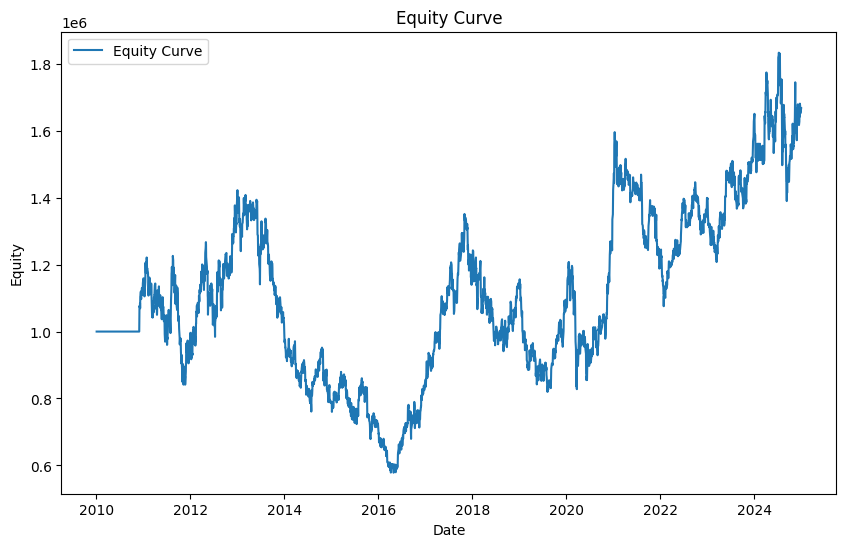

In [6]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(stats['_equity_curve'].index, stats['_equity_curve']['Equity'], label='Equity Curve')
plt.title('Equity Curve')
plt.xlabel('Date')
plt.ylabel('Equity')
plt.legend()
#plt.plot()

### 투자전략의 실행

백테스팅 라이브러리에서의 투자 전략이 실행되면서, 어떤 객체가 생성되고 다음 어느 객체로 넘어가는 등의 흐름이 있다.

- (1) 신호 감지, 매수/매도 조건 판단
- (2) 포지션 상태 확인 ```if not self.position:```
- (3) 주문 발생: buy/sell 호출
- (4) 주문 체결: 가격을 정해 자동체결, 포지션 size 갱신, 잔고 조정
- (5) 거래 완료: 현금, 손익, 수수료 계산, next() 반복 순차적으로 진행된다.

백테스팅 라이브러리에서는 **주문/체결/포지션 관리/손익계산, 수수료 등** 대부분 자동 처리되고, 개발자는 전략 로직(신호 + 진입/청산 조건)만 작성하면 된다.

| 단계     | 백테스트 라이브러리 역할             | 개발자 역할             |
| ------ | ------------------------- | ------------------ |
| 신호 생성  | -                        | 지표 계산, 조건 작성       |
| 주문 발생  | 자동     | 호출 (`buy()`, `sell()`)                 |
| 체결     | 자동                   | 필요시 매수/매도 가격 지정 가능 |
| 포지션 관리 | 자동 (`position.size` 업데이트) | 전략에서 포지션 여부 확인     |
| 거래 완료  | 손익, 현금, 수수료 반영            | -                 |

<<1단계>>: 신호 감지

- 주식 가격이나 지표를 바탕으로 매수 또는 매도 신호를 탐지

```
if 매수신호의 발생:
    self.buy()
elif 매도신호의 발생:
    self.sell()
```

<<2단계>>: 포지션이 없는지 확인 (if not self.position:)하고 그에 따라 매수/매도

단일 포지션 전략(포지션이 없을 때만 진입, 포지션이 있을 때는 청산/전환만)으로 전제하고 절차를 살펴보자 (멀티 포지션 전략: 추가 매수, 추가 매도 허용).

```
if not self.position:  # 포지션 없음 (size == 0) -> 보유자산이 없고 현금상태 -> 새 주문 가능
    if 매수신호:
        self.buy(size=10)  # [10주 매수] -> 롱 포지션 진입
    elif 매도신호:
        self.sell(size=10) # [10주 공매도] -> 숏 포지션 진입 (size < 0)

else:  # 포지션 있음 (size != 0)
    if self.position.size > 0:  # 롱 포지션 보유 (양수는 롱, 음수는 숏, 0은 포지션 없슴)
        if 부분청산신호:
            self.sell(size=min(5, self.position.size))  # 롱 포지션 일부(최대 5주) 매도 청산
        elif 완전청산신호:
            self.close()  # 전체 포지션 청산
    elif self.position.size < 0:  # 숏 포지션 보유
        if 부분청산신호:
            self.buy(size=min(5, abs(self.position.size)))  # 숏 포지션 일부(최대 5주) 매수 청산
        elif 완전청산신호:
            self.close()  # 전체 포지션 청산

```


<<3단계>>: 주문 발생

- self.buy() / self.sell() / self.close() 로 주문을 요청한다. 이 시점에서는 아직 주문 체결 전 상태이다.

- 주문이 체결되면 notify_order() 메소드가 자동으로 호출되어 주문 상태를 추적한다.

- 아래같이 주문하면 Order 객체 생성, 주문상태를 추적하려면 주문객체를 저장해 두어야 한다.

```
self.order = self.buy()  # 매수 주문을 내고, 그 주문 객체를 self.order 변수에 저장(선택적)해서 나중에 상태를 확인할 수 있다
```

<<4단계>>: 주문 체결, 포지션 객체 업데이트 (체결 결과 반영)

주문이 실제 체결되면, 포지션 자동 갱신, Trade 객체 생성하고, 매수 가격, 매수한 자산의 양, 매도 후 얻은 수익 등의 정보를 기록한다.

자동 청산 없음 → 새로운 주문은 기존 포지션에 누적됨


- (1) 주문
    * `self.buy(size=10)` / `self.sell(size=10)` 은 단순히 주문 요청(order) 이다.
    * 즉시 체결될 수도 있고, 시장가·지정가 등 조건에 따라 체결이 안 될 수도 있다.

- (2) 체결(Fill)
    * 주문이 실제로 체결되면 **Trade 객체**가 생성되고, 체결된 수량, 체결 가격, 수수료, 손익 정보 등이 기록된다. ```trade = self.trades # 현재 트레이드 목록```
    * 이때 `self.position` 객체도 자동으로 갱신된다.

- (3) 포지션(Position) 객체 업데이트

    * self.position.size 값은 순 보유량을 나타낸다:

        * 양수 → 롱 (매수 포지션)
        * 음수 → 숏 (매도 포지션) (공매도 상태, 백테스트에서도 공매도가 가능하다)
        * 0 → 포지션 없음 (청산 상태)

    - self.position.size 갱신 규칙

        * **롱 포지션 상태 (`size > 0`)**

            * 일부 매도: `position.size` 감소
            * 전량 매도: `position.size == 0` → 포지션 종료
            * 보유 수량보다 초과 매도: `position.size` 음수 → 숏 포지션 전환

        * **숏 포지션 상태 (`size < 0`)**

            * 일부 매수: `position.size` 증가 (절댓값 감소)
            * 전량 매수: `position.size == 0` → 포지션 종료
            * 보유 수량보다 초과 매수: `position.size` 양수 → 롱 포지션 전환

    - self.position.size 업데이트 예시

        * 포지션 없음 (`size = 0`) 상태에서:    
            * `buy(10)` → `size = 10` (롱) (self.position.is_long=True, self.position.is_short=False "롱(long)" 포지션으로 설정)
            * `sell(10)` → `size = -10` (숏, 즉 공매도 진입)
            
        * 롱 10개 보유 (`size = 10`) 상태에서, 매도:       
            * `sell(5)` → `size = 5` (롱 일부 청산)
            * `sell(10)` → `size = 0` (롱 완전 청산)
            * `sell(15)` → `size = -5` (롱 청산 + 숏 전환)
        
        * 숏 10개 보유 (`size = -10`) 상태에서, 매수:    
            * `buy(5)` → `size = -5` (숏 일부 청산)
            * `buy(10)` → `size = 0` (숏 완전 청산)
            * `buy(15)` → `size = 5` (숏 청산 + 롱 전환)

    - 공매도(Short): 주식을 빌려서 매도해서 포지션을 시작하고(그래서 순자산이 음수 가능), 이를 매수로 청산하는 방식이다.
        * **매수 → 롱 포지션 진입** → 나중에 매도해서 청산 (롱포지션 청산이라고 하며, 공매도라고 하지는 않는다.).
        * **매도 → 숏 포지션 진입** (보유 주식이 없어도 가능) → 나중에 매수해서 청산 (숏 청산).
        * 포지션이 없는데도 불구하고 매도하면 -> 공매도이다.


<<5단계>>: 거래 완료

체결 후 손익 결과는 엔진이 자동으로 처리하므로, 전략 로직에서는 따로 계산할 필요가 없다.


체결 후 엔진이 자동으로:

- 현금 잔고(cash) 증감

- 수수료 반영

- 평가 손익(PnL) 업데이트


사용자는 필요할 때:

- self.broker.getvalue() → 총자산

- self.broker.getcash() → 현금잔고

- self.position → 포지션 상태를 참고할 수 있다.


이후 다음 bar에서 next()가 다시 실행되며 절차가 반복된다.

### Position 클래스: next함수에서 갱신

Position 클래스는 현재 보유 수량(size), 평균 진입 가격(price) 등을 제공하며, 앞서 Strategy 클래스에서 설명한 self.position에 저장되어 포지션 상태를 읽는 용도로만 사용된다고 이해하자.

주식 포지션은 크게 두 가지로 나눌 수 있다. 어떤 포지션을 택할 것인지, 쉽게 생각하면 상승을 예상하면 롱 포지션으로, 반대로 하락을 예상하면 쇼트 포지션으로 가면 된다.

- Long position 투자자가 주식을 매수하고 이를 보유하는 상태를 의미.
- Short position 투자자가 주식을 빌려서 매도한 상태를 의미한다. 나중에 주가가 하락하면 더 낮은 가격으로 다시 사들여 이익을 얻는 전략.

주요 속성과 메서드
- size: 현재 보유하고 있는 포지션의 수량. 가치(self.position.size * self.dataclose[0])를 계산할 수 있다.
    - self.position.size == 0 또는 if not self.position 현재 보유하고 있는 포지션이 없다, 즉 0이다.
    - self.position.size: 보유하고 있는 주식의 수량을 의미한다.
- price: 포지션을 열었을 때의 평균 진입 가격이고, 수익률 계산에 사용된다.
- pl: 현재 포지션의 실현되지 않은 손익, 즉 포지션을 청산하지 않은 상태에서의 이익 또는 손실이다.
- is_long: 현재 포지션이 롱 포지션인 경우 True를 반환한다.
- is_short: 현재 포지션이 숏 포지션인 경우 True를 반환한다.
- pl_pct: 포지션의 퍼센트 수익률
- close(): backtesting.py에서는 close()함수를 제공하지만, 읽는 용도로 주로 사용되니까 명시적 호출은 필요한 경우에만 하자. backtrader에서는 buy(), sell(), close()와 같은 주문 함수에 따라 포지션이 갱신된다.

### Order 클래스: notify_order 함수에서 관리

Strategy.sell() 매수, Strategy.buy() 매도하면 Order가 자동으로 생성되고 (notify_trade() 함수 호출), 주문이 체결되기 전까지는 대기 상태이다. 주문이 체결되면 Order가 Trade로 전환되며, 포지션이 생성되거나 변경된다.

주요 속성과 메서드
- status: 주문의 현재 상태로 다음과 같이 구분된다.
    - Created: 주문이 생성되었으나 아직 제출되지 않은 상태.
    - Submitted: 주문이 거래소에 제출된 상태.
    - Accepted: 주문이 거래소에서 수락된 상태.
    - Completed: 주문이 완전히 체결된 상태.
    - Canceled: 주문이 취소된 상태.
    - Expired: 주문이 만료된 상태.

- is_long: 주문의 크기(size)가 양수이면 True, 매수 주문임을 의미한다.
- is_short: 주문의 크기(size)가 음수이면 True, 매도 주문임을 의미한다.
- size: 주문의 수량이고, 두 가지 경우로 구분된다:
    - 0 ~ 1 사이: 투자비율을 의미, 예를 들면 0.8은 80% 투자를 뜻한다.
    - 1: size를 설정하지 않는 경우의 기본 값, 최대 개수 100% 투자를 의미
    - 1 이상: 1이상인 경우 주문개수를 의미한다.
- price: 주문이 생성된 가격
- isbuy(), issell() 매수 주문인지, 매도 주문인지 확인
- sl (Stop-Loss 가격): 손실을 제한하기 위해 설정하는 가격이다. 이 가격에 도달하면 자동으로 매도 또는 매수 주문이 실행된다. 예를 들어, A 주식을 100달러에 매수한 후 스탑 로스 가격을 90달러로 설정하면, 주가가 90달러로 떨어졌을 때 자동으로 매도 주문이 실행되어 손실을 최소화할 수 있다.

Order 객체의 흐름
- 주문 생성: Strategy.buy() 또는 Strategy.sell() 메서드를 호출하여 주문이 자동 생성된다. 이때 Order 객체가 만들어진다.

- 주문 대기: 생성된 주문은 초기 상태로 대기하며, 거래소에서 수락될 때까지 Submitted 또는 Accepted 상태에 있다.

- 주문 체결: 주문이 거래소에서 체결되면 Completed 상태가 되며, 이 시점에서 포지션이 생성되거나 변경된다. 체결된 주문은 자동으로 Trade 객체로 전환되어 기록된다.

- 주문 취소/만료: 주문이 취소되거나, 유효 기간이 지나 만료되면 Canceled 또는 Expired 상태가 된다. 이 경우, 주문은 체결되지 않았으므로 포지션에 영향을 미치지 않는다.

### Trade 클래스: notify_trade 함수에서 관리

Order가 체결되면, 그 결과로 Trade 객체가 생성된다 (notify_trade() 함수 호출)
Trade는 실제로 체결된 거래이고, 포지션에 변화가 발생할 때 기록된다.
예를 들어, 매수 주문이 체결되면 포지션이 증가하고, 이때 Trade 객체가 생성된다.
Trade는 매수와 매도의 체결된 결과로, 손익 계산 및 거래 내역에 기록된다.

주요 속성과 메서드
- size: 거래된 자산의 수량, 예를 들어, 100주를 매수하거나 매도했다면 size는 100이 된다 (0~1은 투자비율)
- price: 거래가 체결된 가격
- value: 거래의 총 가치, 예를 들어, 100주를 주당 5000원에 매수했다면 value는 500,000원이다.
- commission: 거래 시 발생한 수수료, 브로커에게 지불하는 비용이다.
- pnl (Profit and Loss): 거래로 인해 발생한 손익, 거래가 종료된 후에만 계산되며, 수수료를 포함한 순수익을 보여준다.
- is_long: True이면 롱 포지션(매수 후 보유)을 나타내며, False이면 숏 포지션(매도 후 보유)을 의미한다.
- isclosed, isopen: 거래가 종료되었는지 여부(True/False), 거래 open -> 포지션 size 증가, 거래 close -> 포지션 0
- duration: 포지션이 유지된 기간, 포지션이 열린 후부터 청산될 때까지의 시간을 측정한다.

Trade 객체의 흐름
- 주문 체결: Order가 체결되면, 그 결과로 Trade 객체가 생성된다. 이 객체는 새로운 포지션을 열거나 기존 포지션을 확장한다.
- 포지션 관리: Trade 객체는 포지션의 상태를 추적한다. 롱 포지션인지 숏 포지션인지, 얼마나 많은 자산이 거래되었는지, 포지션이 열린 기간은 얼마나 되는지를 관리한다.
- 거래 종료: 포지션이 청산되면 Trade 객체는 손익(pnl)을 계산하고, 거래의 총 결과를 기록한다. 이 시점에서 is_closed 속성은 True로 변경된다.
- 성과 평가: 여러 Trade 객체가 생성되고 종료됨에 따라 개별 거래의 결과를 집계해서 전체 전략의 성과를 평가한다.

### backtesting.py과 backtrader 간 Position, Order, Trade의 차이

Position, Order, Trade를 어떻게 통제하는지 서로 차이가 있다.

- Position
    - backtrader는 self.position을 통해 통제한다.
    - 반면 backtesting.py는 온전한 클래스가 있어 이를 통해 통제한다.
    - 따라서 close()가 차이가 있다.
        - Backtrader에서는 Strategy 클래스의 self.close(), 현재 포지션을 종료하기 위한 매도 또는 매수 주문을 생성한다. 직접 포지션 객체에서 close()를 호출하는 방식은 지원되지 않는다. Backtrader의 Position 객체는 상태만 나타낸다 (현재 포지션이 있는지, 몇 주를 보유 중인지 등), 주문(Order)이 포지션을 변경하는 유일한 수단이다. 즉, 포지션을 직접 조작하는 대신 주문(buy(), sell(), close())을 통해 관리한다.
            - (backtrader는 self.close() -> 주문생성 -> 주문체결 -> 포지션 종료)
        - 반면 Backtesting.py에서는 포지션의 self.position.close() 함수를 통해 포지션을 직접 종료할 수 있다. self.close() 메서드는 존재하지 않거나 오류를 발생시킨다.

- Order, Trade:
    - Backtrader는 notify_order, notify_trade 함수를 통해서 보다 세밀한 통제가 가능하다. order.size, borker.cash, broker.equity 등 직접 설정이 가능하다. size>1은 개수이지만, 0~1은 투자비율로 해석되며 addsizer를 통해 설정한다.
    - 반면 backtesting.py는 객체지향 원칙에 따라 은익해서 개발자가 호출할 필요 없어 복잡성을 덜었다. 대신 Position 클래스를 통해 Order나 Trade를 개발자 노력없이 자동으로 관리하고 있다 (order.size, broker.cash 등을 직접 사용할 수 없다. broker.equity 대신 그냥 self.equity라고 해야 한다). size는 0~1 투자비율, 1이상은 개수를 의미한다 (비율일 경우 addsizer 같은 설정이 필요 없고, 직접 비율을 적어주면 된다)
    - 특히, size=1의 의미가 서로 다르다.
        - backtesting.py size=1: 자산의 100%를 투자, 잔고의 전부를 사용한다. 0 ~ 1은 비율만큼 투자하게 된다.
        - backtrader size=1: 1개의 주식을 의미한다. 전량 매매를 원하면 현재 잔고를 고려하여 size를 직접 계산해서 지정해야 한다.


### MA 투자전략 최적화

I() 함수에 Pandas에서 생성한 이동평균 지표를 사용해보자.

지표를 조합하여 어떤 성과를 산출하는지 분석하려면, 상당한 반복이 필요하다.
다행히도 최적화 함수가 제공되고 있다.

In [7]:
from backtesting import Backtest, Strategy
from backtesting.lib import crossover
import pandas_ta as ta
 
class SmaCross(Strategy):
    n1 = 30 #20
    n2 = 200 #50
    def init(self):
        # numpy.array 대신 pandas.Series를 반환하기 때문에 --> 오류
        #self.sma10 = self.I(ta.sma, self.data.Close, self.n1)
        #self.sma20 = self.I(ta.sma, self.data.Close, self.n2)
        # pandas_ta에서 계산한 이동평균을 numpy 배열로 변환 --> 오류
        #self.sma10 = self.I(lambda x: ta.sma(x, self.n1).to_numpy(), self.data.Close)
        #self.sma20 = self.I(lambda x: ta.sma(x, self.n2).to_numpy(), self.data.Close)
        # 이동 평균 계산을 직접 수행하여 numpy 배열로 변환
        self.sma10 = self.I(lambda x: pd.Series(x).rolling(self.n1).mean().to_numpy(), self.data.Close)
        self.sma20 = self.I(lambda x: pd.Series(x).rolling(self.n2).mean().to_numpy(), self.data.Close)

    def next(self):
        #if crossover(self.data.sma10, self.data.sma20):
        if crossover(self.sma10, self.sma20):
            self.buy()
        #elif crossover(self.data.sma20, self.data.sma10):
        elif crossover(self.sma20, self.sma10):
            self.sell()

#cash는 정수 소수 모두 가능하고 컴마없이 적는다. commission은 퍼센트를 적지 않는다. .015는 1.5% 
bt = Backtest(sse2010_2024df, SmaCross, cash=1000000, commission=.015, exclusive_orders=True)
 
#output = bt.run()
output = bt.optimize(n1=range(5,60,5),
                     n2=range(50,200,5),
                     maximize='Return [%]', 
                     #maximize='Equity Final [$]',
                     constraint=lambda param: param.n1 < param.n2)
print(output)
bt.plot(filename=f'scripts/tearsheet.html', plot_drawdown=True, open_browser=False)


C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\backtesting.py:1488: UserWarning: Searching for best of 327 configurations.
  output = _optimize_grid()


  0%|          | 0/9 [00:00<?, ?it/s]

Start                     2010-01-04 00:00...
End                       2024-12-30 00:00...
Duration                   5474 days 00:00:00
Exposure Time [%]                   97.022198
Equity Final [$]               2155324.282442
Equity Peak [$]                2243961.312693
Return [%]                         115.532428
Buy & Hold Return [%]              338.819268
Return (Ann.) [%]                    5.378451
Volatility (Ann.) [%]               27.078836
Sharpe Ratio                         0.198622
Sortino Ratio                        0.302583
Calmar Ratio                          0.10673
Max. Drawdown [%]                  -50.392845
Avg. Drawdown [%]                   -8.870334
Max. Drawdown Duration     1434 days 00:00:00
Avg. Drawdown Duration      123 days 00:00:00
# Trades                                   35
Win Rate [%]                        42.857143
Best Trade [%]                     100.833089
Worst Trade [%]                    -14.300713
Avg. Trade [%]                    

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:455: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df2 = (df.assign(_width=1).set_index('datetime')


GridPlot(id='p1690', ...)

In [8]:
print("최적화된 매개변수 조합:", output._strategy)

최적화된 매개변수 조합: SmaCross(n1=35,n2=85)


### RSI 투자전략

- 매수조건: RSI가 적정구간 이하 (과매도)
- 매도조건: RSI가 적정구간 이상 (과매수)

In [9]:
import datetime
import pandas_ta as ta
import pandas as pd

from backtesting import Backtest
from backtesting import Strategy
from backtesting.lib import crossover

class RsiOscillator(Strategy):

    upper_bound = 70 # 70이상이면 과매수
    lower_bound = 30 # 30이하이면 과매도
    rsi_window = 14 # 이전 14개 데이터항목을 기준으로 계산한다.

    def init(self):
        self.rsi = self.I(ta.rsi, pd.Series(self.data.Close), self.rsi_window)

    def next(self):
        if crossover(self.rsi, self.upper_bound):
            self.position.close() #self.close() -> Error
        elif crossover(self.lower_bound, self.rsi):
            self.buy()

bt = Backtest(sse2010_2024df, RsiOscillator, cash=1000000, commission=.002)
stats = bt.run()
statsOpt = bt.optimize(
        upper_bound = range(50,85,5),
        lower_bound = range(15,45,5),
        rsi_window = range(10,30,2),
        maximize='Equity Final [$]')
bt.plot()

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\backtesting.py:1488: UserWarning: Searching for best of 420 configurations.
  output = _optimize_grid()


  0%|          | 0/9 [00:00<?, ?it/s]

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:455: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df2 = (df.assign(_width=1).set_index('datetime')


GridPlot(id='p2054', ...)

대단한 성과를 보이고 있다. 수익률이 805%, 최종 9배 정도의 투자금이 되고 있다.

In [10]:
statsOpt

Start                     2010-01-04 00:00...
End                       2024-12-30 00:00...
Duration                   5474 days 00:00:00
Exposure Time [%]                   77.964266
Equity Final [$]               7110318.975128
Equity Peak [$]               10546775.677176
Return [%]                         611.031898
Buy & Hold Return [%]              338.819268
Return (Ann.) [%]                   14.318046
Volatility (Ann.) [%]               27.488415
Sharpe Ratio                         0.520876
Sortino Ratio                        0.910362
Calmar Ratio                         0.383755
Max. Drawdown [%]                   -37.31036
Avg. Drawdown [%]                    -5.23309
Max. Drawdown Duration     1177 days 00:00:00
Avg. Drawdown Duration       53 days 00:00:00
# Trades                                    9
Win Rate [%]                        77.777778
Best Trade [%]                     104.590066
Worst Trade [%]                    -28.095046
Avg. Trade [%]                    

In [11]:
print("최적화된 매개변수 조합:", statsOpt._strategy)

최적화된 매개변수 조합: RsiOscillator(upper_bound=75,lower_bound=35,rsi_window=20)


- 코드 self.position.close(): 현재 포지션이 존재할 경우 해당 포지션을 직접 종료 (backtrader는 self.close() -> 주문생성 -> 주문체결 -> 포지션 종료). 현재의 포지션이 매수(Long) 상태라면, self.sell()과 같은 의미이다 (완전매도의 경우 그렇다. position.close 청산이 안되면 수익률 계산에 영향을 미친다.)
    - self.sell(): 매도 주문이 실행되면 기존의 매수 포지션이 종료되지만, 새로운 매도 포지션이 생성된다는 차이가 있다.

### 복합조건: MA, RSI (일간, 주간), sl, tp

MA, RSI의 복수지표를 활용해서 투자전략을 설계해보자.

매수 조건:
- 포지션이 없고 (not self.position)
- 일간 RSI(self.daily_rsi), 주간 RSI(self.weekly_rsi)의 적정범위 비교
- 단기 이동평균선(ma10)이 장기 이동평균선(ma20, ma50, ma100)보다 큰지 비교

청산 조건:
- 손절매, 이익실현 기준이면 포지션을 청산 (self.position.close() -> position.size==0) (buy() 함수에도 설정할 수 있다)

손절매하면 추세를 추적하지 않고 중단하는 것을 말한다 (Trailing Stop). 기준은 종가에서 얼마나 하락했는지 비율에 따라 설정하는데, 여기서는 8%로 설정한다. 가격 변동에 민감하게 반응하기 때문에 손절매가 잦아지고 수익이 제한될 수 있다.
- 100,000원에 매수하고 5%의 sl을 설정하면, 95,000원(100,000원의 95%) 이하로 떨어지면 자동으로 매도 주문이 실행된다.
- 주가가 110,000원으로 상승하면, 104,500원(110,000원의 95%)으로 조정된다.
- 계속 주가가 120,000원으로 상승할 경우, 114,000원으로 상향한다. 이 가격 이하로 떨어지면, 트레일링 스톱이 발동되어 자동으로 매도 주문이 실행되고 그 시점에 이익이 확정된다. 

sl, tp 로그를 출력하려면 notify_order()에서 추문을 추적해서 출력해야 한다.

resample_apply 함수가 시간 기반으로 리샘플링하려면 반드시 DatetimeIndex가 필요하니, 확인하자.

없으면 Date컬럼을 인덱스로 만들어주어야 한다.
```
sse2010_2024df['Date'] = pd.to_datetime(sse2010_2024df['Date'])
#sse2010_2024df.set_index('Date', inplace=True)
```

In [12]:
sse2010_2024df.index

DatetimeIndex(['2010-01-04 00:00:00+09:00', '2010-01-05 00:00:00+09:00',
               '2010-01-06 00:00:00+09:00', '2010-01-07 00:00:00+09:00',
               '2010-01-08 00:00:00+09:00', '2010-01-11 00:00:00+09:00',
               '2010-01-12 00:00:00+09:00', '2010-01-13 00:00:00+09:00',
               '2010-01-14 00:00:00+09:00', '2010-01-15 00:00:00+09:00',
               ...
               '2024-12-16 00:00:00+09:00', '2024-12-17 00:00:00+09:00',
               '2024-12-18 00:00:00+09:00', '2024-12-19 00:00:00+09:00',
               '2024-12-20 00:00:00+09:00', '2024-12-23 00:00:00+09:00',
               '2024-12-24 00:00:00+09:00', '2024-12-26 00:00:00+09:00',
               '2024-12-27 00:00:00+09:00', '2024-12-30 00:00:00+09:00'],
              dtype='datetime64[ns, Asia/Seoul]', length=3694, freq=None)

In [15]:
import pandas as pd
import pandas_ta as ta
from backtesting import Strategy, Backtest
from backtesting.lib import resample_apply

def SMA(array, n):
    return pd.Series(array).rolling(n).mean()

class RsiSma(Strategy):
    d_rsi_win = 14  # 일간 RSI 윈도우
    w_rsi_win = 14  # 주간 RSI 윈도우
    rsi_high=70
    rsi_low=30
    #level = 70  # RSI 레벨
    sl = 0.8  # 손절매 비율
    tp = 1.5  # 이익실현 비율

    def init(self):
        self.ma10 = self.I(SMA, self.data.Close, 10)
        #self.ma20 = self.I(SMA, self.data.Close, 20)
        self.ma50 = self.I(SMA, self.data.Close, 50)
        self.ma100 = self.I(SMA, self.data.Close, 100)
        #self.daily_rsi = self.I(ta.rsi, self.data.Close, self.d_rsi_win) # ERROR
        self.daily_rsi = self.I(ta.rsi, pd.Series(self.data.Close), self.d_rsi_win)
        #self.weekly_rsi = resample_apply('W-FRI', self.daily_rsi, self.data.Close, self.w_rsi_win) # ERROR
        #self.weekly_rsi = resample_apply('W-FRI', ta.rsi, pd.Series(self.data.Close), self.w_rsi_win) # ERROR date 인식 못함
        self.weekly_rsi = resample_apply('W-FRI', ta.rsi, self.data.Close, self.w_rsi_win)

    def next(self):
        _close = self.data.Close[-1]
        #print(f"[{len(self.data)}] {self.data.index[-1]} RSId: {self.daily_rsi[-1]:.1f}"
        #      f" RSIw: {self.weekly_rsi[-1]:.1f} MA10: {self.ma10[-1]} MA50: {self.ma50[-1]}")
 
        if not self.position:
            if self.weekly_rsi > self.rsi_low and self.ma10[-1] > self.ma50[-1]:
                print(f"[+매수] 일자:{self.data.index[-1]} 직전보유: {self.position.size} 가격: {_close} 보유자금: {self.equity:.1f}")
                self.buy(sl=self.sl * _close, tp=self.tp * _close)
                #self.buy() #sl,tp 없이 매수
        else:
            if self.daily_rsi > self.rsi_high or self.ma10[-1] < self.ma50[-1]:
                print(f"[-청산] 일자:{self.data.index[-1]} 직전보유: {self.position.size} 가격: {_close} 보유자금: {self.equity:.1f}")
                self.position.close()

    def _next(self):
        _close = self.data.Close[-1]

        if (not self.position and
            self.daily_rsi[-1] > self.rsi_low and
            self.weekly_rsi[-1] > self.rsi_low and
            #self.weekly_rsi[-1] > self.daily_rsi[-1] and
            #self.ma10[-1] > self.ma20[-1] > self.ma50[-1] > self.ma100[-1] and
            self.ma10[-1] > self.ma50[-1] and
            _close > self.ma10[-1]):
            print(f"[+매수] 일자:{self.data.index[-1]} 직전보유: {self.position.size} 가격: {_close} 보유자금: {self.equity:.1f}")
            self.buy() # sl,tp를 넣으면 elif의 청산조건과 중복될 수 있다.
        # 가격이 이동평균10 손절매 기준 미만이면 청산
        #elif _close < self.sl*self.ma50[-1]: # buy(청산)과 청산로직이 중복되면 주의
        elif self.position and _close < self.sl * self.ma50[-1]:
            print(f"[-청산] 일자:{self.data.index[-1]} 직전보유: {self.position.size} 가격: {_close} 보유자금: {self.equity:.1f}")
            self.position.close()

backtest = Backtest(sse2010_2024df, RsiSma, cash=1000000, commission=.002)
stats= backtest.run()
print(stats)

[+매수] 일자:2010-06-23 00:00:00+09:00 직전보유: 0 가격: 11919.1376953125 보유자금: 1000000.0
[-청산] 일자:2010-07-05 00:00:00+09:00 직전보유: 83 가격: 11428.2802734375 보유자금: 953585.9
[+매수] 일자:2010-07-15 00:00:00+09:00 직전보유: 0 가격: 12217.9814453125 보유자금: 947402.8
[-청산] 일자:2010-08-13 00:00:00+09:00 직전보유: 77 가격: 11636.880859375 보유자금: 905374.7
[+매수] 일자:2010-11-12 00:00:00+09:00 직전보유: 0 가격: 11592.1826171875 보유자금: 896196.3
[-청산] 일자:2010-12-03 00:00:00+09:00 직전보유: 76 가격: 13320.5791015625 보유자금: 1016715.3
[+매수] 일자:2010-12-06 00:00:00+09:00 직전보유: 0 가격: 13260.9814453125 보유자금: 1012185.9
[-청산] 일자:2010-12-07 00:00:00+09:00 직전보유: 76 가격: 13424.880859375 보유자금: 1026030.6
[+매수] 일자:2010-12-08 00:00:00+09:00 직전보유: 0 가격: 13231.177734375 보유자금: 1028295.1
[-청산] 일자:2010-12-09 00:00:00+09:00 직전보유: 77 가격: 13663.2783203125 보유자금: 1062977.9
[+매수] 일자:2010-12-10 00:00:00+09:00 직전보유: 0 가격: 13693.0751953125 보유자금: 1060683.1
[-청산] 일자:2010-12-13 00:00:00+09:00 직전보유: 77 가격: 13856.9794921875 보유자금: 1071194.7
[+매수] 일자:2010-12-14 00:00:00+09:00 직전보유: 

rsi, sl, tp의 최적화를 해보자.

In [ ]:
statsOpt = backtest.optimize(d_rsi_win=range(10, 35, 5),
                  w_rsi_win=range(10, 35, 5),
                  #level=range(30, 80, 10), #포함하니까 실행시간이 오래 걸림
                  sl=[0.85, 0.9, 0.95],  # 손절매 비율
                  tp=[1.1, 1.2, 1.25, 1.3])  # 이익실현 비율
#backtest.plot()

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\backtesting.py:1488: UserWarning: Searching for best of 1500 configurations.
  output = _optimize_grid()


  0%|          | 0/9 [00:00<?, ?it/s]

[+매수] 일자:2010-06-23 00:00:00+09:00 직전보유: 0 가격: 11919.1376953125 보유자금: 1000000.0
[-청산] 일자:2010-07-05 00:00:00+09:00 직전보유: 83 가격: 11428.2802734375 보유자금: 953585.9
[+매수] 일자:2010-07-15 00:00:00+09:00 직전보유: 0 가격: 12217.9814453125 보유자금: 947402.8
[-청산] 일자:2010-08-13 00:00:00+09:00 직전보유: 77 가격: 11636.880859375 보유자금: 905374.7
[+매수] 일자:2010-11-12 00:00:00+09:00 직전보유: 0 가격: 11592.1826171875 보유자금: 896196.3
[-청산] 일자:2010-11-22 00:00:00+09:00 직전보유: 76 가격: 12635.1806640625 보유자금: 964625.0
[+매수] 일자:2010-11-23 00:00:00+09:00 직전보유: 0 가격: 12515.982421875 보유자금: 966889.9
[-청산] 일자:2010-11-24 00:00:00+09:00 직전보유: 78 가격: 12679.8779296875 보유자금: 994024.9
[+매수] 일자:2010-11-25 00:00:00+09:00 직전보유: 0 가격: 12590.478515625 보유자금: 996349.4
[-청산] 일자:2010-12-03 00:00:00+09:00 직전보유: 78 가격: 13320.5791015625 보유자금: 1047839.4
[+매수] 일자:2010-12-06 00:00:00+09:00 직전보유: 0 가격: 13260.9814453125 보유자금: 1043190.8
[-청산] 일자:2010-12-07 00:00:00+09:00 직전보유: 78 가격: 13424.880859375 보유자금: 1057399.8
[+매수] 일자:2010-12-08 00:00:00+09:00 직전보유: 0 가격:

최적화 조합을 확인해보자.

In [ ]:
statsOpt._strategy

- 코드 오류 self.daily_rsi = self.I(ta.rsi, self.data.Close, self.d_rsi_win): pandas_ta의 함수는 보통 pandas.Series 또는 pandas.DataFrame을 인자로 받기 때문에, 이 함수들을 self.I()와 함께 사용하려면 데이터를 numpy 배열로 변환하거나 함수 호출 방식을 수정해야 한다.

- 코드 resample_apply(): resample_apply는 pandas의 resample() 기능을 이용하여, 주어진 데이터를 특정 주기(예: 주간, 월간)로 리샘플링한 후, 이를 다시 함수(ta.rsi)에 적용하는 함수이다.
    - 일간을 주간으로: resample_apply('W-FRI', self.daily_rsi, self.data.Close, self.w_rsi_win)
    - 분간격을 시간격으로 resample_apply('1H', ta.rsi, self.data.Close, self.rsi_window)

- 주의: I() 함수에서는 pd.Series(self.data.Close) 시리즈를, 반면 여기서는 그냥 self.data.Close를 넘겨준다.
    - resample_apply는 pandas.Series나 pandas.DataFrame 같은 데이터 형식의 입력을 사용한다. self.data.Close가 pandas.Series 타입으로 전달되고, 리샘플링 후에도 pandas 형태로 유지되기 때문에 ta.rsi와 같은 pandas 기반 함수에 문제없이 적용될 수 있다.
    - 반면에, self.I()는 backtesting.py에서 성능 최적화를 위해 설계된 함수로, 주로 numpy 배열 형태의 데이터를 사용한다. 따라서 self.I()에서는 pandas_ta 같은 외부 라이브러리와의 직접적인 호환이 어렵고, 데이터 형식을 맞춰줘야 한다.
- 코드 next
    - 매회 출력을 보면, 101번째부터 한 줄씩 처리되고 있다. 주간 RSI 지표는 주일 동안 동일한 값이다.

    ```
    [101] 2010-05-28 00:00:00 RSId: 45.1 RSIw: 44.0 MA10: 15428.0 MA50: 16348.4
    [102] 2010-05-31 00:00:00 RSId: 44.6 RSIw: 44.0 MA10: 15360.0 MA50: 16340.0
    [103] 2010-06-01 00:00:00 RSId: 42.3 RSIw: 44.0 MA10: 15328.0 MA50: 16325.6
    ...생략...
    ```

- 코드 self.buy(sl=.92 * _close, tp=1.1 * _close)
    - tp는 Take Profit 이익실현, 목표 수익에 도달하면 자동으로 청산하여 수익을 확정한다. 현재 매수가 10% 상승하면 이익실현. 보통 보통 손절매 비율보다 크게 설정되며, 1:2 또는 1:3 이상의 손익비 (10% 손절매라면 2~30% 이익실현)
    - sl은 Stop Loss 손절매 가격, 현재 매수가의 8% 아래에서는 청산. 

- 코드 if self.position: 포지션은 자동으로 갱신되므로 이 코드는 반드시 필요하지 않지만, 보통 이렇게 작성한다.

(1) 포지션이 없는데 매수하거나 포지션이 있는데 매도하는 경우를 피하기 위해
(2) buy once, sell once 원칙을 지키기 위해서, 즉 포지션이 있는데 또 매수한다면 과매수, 포지션이 없는데 매도한다면 오류.

- 코드 self.position.close() 현재 열린 포지션을 명시적으로 청산. 사실 self.buy() 또는 self.sell() 후 주문이 전량 체결되면 해당 포지션이 자동으로 청산된다.
- 코드 optimize() 함수에는 rsi, sl, tp 모두 포함하고 있다.

# 7. 기계학습 백테스트

기계학습(Machine Learning)을 활용한 백테스팅은 모델이 데이터로부터 학습한 신호에 기반해 투자결정을 내리고 그 성과를 평가하는 작업이다. 기계학습모델이 투자전략을 대신하게 되고, 진행 절차는 백테스트하는 과정과 다를 바 없다.

이를 위해 필요한 데이터를 준비하고, 적절한 모델을 선택하여, 백테스트에 적용한다.

단계 1. 속성 및 레이블 준비

1. 속성 및 레이블 준비

우선 기계학습 모델을 훈련하기 위해서는 입력데이터(x)와 목표값(y)을 추출하거나 생성해야 한다.

목표값 (y): 기계학습 모델이 맞추어야 할 과녁 또는 학습하려는 목표를 말한다. 이중 또는 다중의 분류값을 가지면 레이블 또는 클래스라고 부른다. 또는 실제 주가를 학습할 수도 있다.

- 이진 분류(Binary classification): 상승(1) / 하락(0) 예측
- 다중 분류(Multi-class classification): 상승(1), 유지(0), 하락(-1)
- 실제 주가: 바로 다음 t+1을 예측하거나 더 긴 기간의 주가를 예측할 수 있다.

입력 속성 (x): 모델이 최적으로 학습하도록 다양한 속성(feature)을 조합한다. 속성 후보들을 보면:
- 기본 지표: PER, PBR, EPS 등 주가와 재무상태를 반영하는 지표
- 기술 지표: 이동평균(MA), 상대강도지수(RSI), MACD 등 주가 패턴, 거래량 비율, 변동성, 이전 수익률(예: t-1 수익률) 포함
- 시간 지표: 월별(1 ~ 12), 요일 (0:월 ~ 4:금 등 계절성과 주기 반영, 시계열 래그 (Close(t-1), Close(t-2)...)
- 경제 지표: 금리, 환율, 원유 등 거시경제지표 등 KOSPI, S&P500과 같은 시장지수
- 정서 지표: 뉴스나 SNS 토론방에서의 긍정, 부정 감성 분석 모델로 텍스트 데이터를 정량화
- 챠트 패턴: 캔들차트나 주가 패턴 이미지 분석 (딥러닝 활용)

단계 2. 모델 훈련

기계학습모델이 언제 매수, 매도할지 결정할 수 있도록 훈련한다. 모델은 데이터의 특성과 문제 유형에 따라 다르게 선택할 수 있다.
몇 가지 예를 들면:
- 랜덤 포레스트(Random Forest): 다수의 결정 트리들을 학습하는 앙상블 방법
- XGBoost (eXtreme Gradient Boosting): 경사 하강법(gradient descent)을 활용한 앙상블 방법
- SVM (Support Vector Machine): 서로 다른 분류가 되는 경계선의 폭이 최대가 되도록 하는 방법
- 인공 신경망(ANN): 인간의 신경 회로를 모방하여, 입력데이터와 출력값의 관계를 학습하는 방법

데이터는 훈련(Train)과 검증(Test) 세트로 나누어 교차검증(Cross-Validation) 기법을 활용해 성능을 평가한다.

단계 3. 백테스트

훈련된 기계학습 모델을 통해 나온 신호에 따라 매수/매도 전략을 수행한다. 일반적인 백테스팅 과정과 유사하지만, 모델이 매매 신호를 자동으로 생성한다.
수익률, 샤프 비율 등의 성과지표를 통해 모델의 성능을 평가한다.

## 7.1 기계학습 RandomForest

RandomForestClassifier는 여러 의사트리모델을 합성한다는 의미에서 숲이라고 명명했고, 모델입력변수를 무작위로 선별하고 이를 기반으로 각 각의 트리모델을 생성하고 합성하여 이진 또는 다중의 분류를 한다. 단일 모델만을 사용하지 않고, 정확성을 높이기 위해 여러 모델을 합쳐서 Ensemble 방법이다.

우선 라이브러리를 설치해야겠다. scikit-learn는 완전한 명칭을 말하고, sklearn는 import하는 명칭일뿐 모두 같은 라이브러리이고 차이가 없다.

In [ ]:
!pip install scikit-learn

### 학습

- 속성: 이동평균 지표 2개를 속성으로 추출
- 레이블: 상승여부 2진 분류
- 훈련 및 테스트 데이터 분할 7:3
- 기계학습모델: RandomForest

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

_ohlcv = {
        'Open': [100, 101, 102, 103, 104, 105, 104, 103, 102, 101, 100, 99, 98, 97, 96, 97, 98],
    'High': [101, 102, 103, 104, 105, 106, 105, 104, 103, 102, 101, 100, 99, 98, 97, 98, 99],
    'Low': [99, 100, 101, 102, 103, 104, 103, 102, 101, 100, 99, 98, 97, 96, 95, 96, 97],
    'Close': [100, 101, 102, 103, 104, 105, 104, 103, 102, 101, 100, 99, 98, 97, 96, 97, 98],
    'Volume': [1000, 1200, 1300, 1100, 1400, 1500, 1200, 1300, 1400, 1100, 1200, 1300, 1400, 1500, 1200, 1300, 1400],
    'SMA_10': [99, 99.5, 100, 100.5, 101, 101.5, 101.2, 100.9, 100.6, 100.3, 100, 99.7, 99.4, 99.1, 98.8, 98.9, 99],
    'SMA_20': [98, 98.5, 99, 99.5, 100, 100.5, 100.3, 100.1, 99.9, 99.7, 99.5, 99.3, 99.1, 98.9, 98.7, 98.8, 98.9],
}

start, end, periods, freq 4개의 인자 중 3개를 입력해야 한다.

In [2]:
_myDf = pd.DataFrame(_ohlcv, index=pd.date_range('2024-10-01', periods=17))

현재 종가가 다음 종가보다 올랐는지 떨어졌는지 (Close - Close-1) 식별한다.

다음 종가가 상승하면 1, 아니면 0으로 이분화 한다. 

In [3]:
_myDf['Close-1'] = _myDf['Close'].shift(-1)
_myDf['Target'] = (_myDf['Close'].shift(-1) > _myDf['Close']).astype(int) # 상승 1, 아니면 0으로 이분화

Target이 올바르게 분류되었는지 살펴보자.

맨 마지막줄 NaN 출력은 shift(-1)로 인해 한 줄씩 위로 이동한 까닭이다.

In [4]:
_myDf

,Open,High,Low,Close,Volume,SMA_10,SMA_20,Close-1,Target
2024-10-01,100,101,99,100,1000,99.0,98.0,101.0,1
2024-10-02,101,102,100,101,1200,99.5,98.5,102.0,1
2024-10-03,102,103,101,102,1300,100.0,99.0,103.0,1
2024-10-04,103,104,102,103,1100,100.5,99.5,104.0,1
2024-10-05,104,105,103,104,1400,101.0,100.0,105.0,1
2024-10-06,105,106,104,105,1500,101.5,100.5,104.0,0
2024-10-07,104,105,103,104,1200,101.2,100.3,103.0,0
2024-10-08,103,104,102,103,1300,100.9,100.1,102.0,0
2024-10-09,102,103,101,102,1400,100.6,99.9,101.0,0
2024-10-10,101,102,100,101,1100,100.3,99.7,100.0,0


X는 입력변수들이고, y는 이진 분류 값이다.

In [5]:
features = ['SMA_10', 'SMA_20']
X = _myDf[features].iloc[:-1]  # [:-1] --> 마지막 줄 제외, features만 선별 (Close 제외)
y = _myDf['Target'].iloc[:-1]  # [:-1] --> 마지막 줄 제외

X가 2개의 컬럼으로 구성되고, 마지막 줄은 제외되고 있다.

In [6]:
X

,SMA_10,SMA_20
2024-10-01,99.0,98.0
2024-10-02,99.5,98.5
2024-10-03,100.0,99.0
2024-10-04,100.5,99.5
2024-10-05,101.0,100.0
2024-10-06,101.5,100.5
2024-10-07,101.2,100.3
2024-10-08,100.9,100.1
2024-10-09,100.6,99.9
2024-10-10,100.3,99.7


훈련 70%, 테스트 30%로 분할하고 있다. random_state의 seed를 설정하는데, 이렇게 하면 데이터 분할이 (훈련인지 테스트인지) 재현될 수 있다.
즉, 항상 동일한 훈련/테스트 세트를 얻기 때문에 비교 분석이 가능해 진다.

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

포함할 트리의 갯수=100, 무작위 seed=42 (seed 고정해서 무작위라도 재현성 보장)

랜덤 포레스트는 앙상블 알고리즘으로 여러 개의 의사결정 나무(Decision Tree)를 랜덤하게 생성한다.
각 트리가 무작위 샘플링과 무작위 특성 선택을 사용하므로, random_state를 설정하지 않으면 트리 구성과 모델의 성능이 매번 달라질 수 있다.

In [8]:
model = RandomForestClassifier(n_estimators=100, random_state=42)

fit() 함수는 

model.fit(X_train, y_train) 함수는 기계학습 모델을 데이터에 학습시키는 과정을 수행한다. 주어진 입력 데이터(X)와 정답 데이터(y)를 사용해 모델의 매개변수(가중치 등)를 조정하여 최적의 예측을 할 수 있도록 만드는 역할을 한다. 모델의 훈련이 목적이라서 반환은 없다.

    - X_train: 2D 배열 (n_samples, n_features)로 구성한다.  numpy 배열, pandas 데이터프레임, 또는 list이다. n_features는 y축의 컬럼들, n_samples는 x축의 행 (레코드 또는 샘플)에 해당한다.
    - y_train: 목표 값 (즉 예측)이다. 복수의 값이므로 numpy 배열, pandas Series, 또는 list이다.


In [9]:
model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

fit()으로 학습이 끝나면 모델이 최적화되는데, predict()는 테스트 데이터를 넘겨받아 훈련모델을 적용하여 예측 값을 생성한다.

y_pred = model.predict(X_test)

    - X_test: X_train과 같은 형식
    - y_pred: y_train과 같은 형식

In [10]:
y_pred = model.predict(X_test) # 테스트데이터에 모델 적용

In [11]:
X_test['Prediction'] = y_pred # X_test에 예측 컬럼을 추가
print(f"테스트본: {X_test}")
print(f"원본: {_myDf}")

테스트본:             SMA_10  SMA_20  Prediction
2024-10-01    99.0    98.0           1
2024-10-02    99.5    98.5           1
2024-10-06   101.5   100.5           0
2024-10-15    98.8    98.7           1
2024-10-14    99.1    98.9           1
원본:             Open  High  Low  Close  Volume  SMA_10  SMA_20  Close-1  Target
2024-10-01   100   101   99    100    1000    99.0    98.0    101.0       1
2024-10-02   101   102  100    101    1200    99.5    98.5    102.0       1
2024-10-03   102   103  101    102    1300   100.0    99.0    103.0       1
2024-10-04   103   104  102    103    1100   100.5    99.5    104.0       1
2024-10-05   104   105  103    104    1400   101.0   100.0    105.0       1
2024-10-06   105   106  104    105    1500   101.5   100.5    104.0       0
2024-10-07   104   105  103    104    1200   101.2   100.3    103.0       0
2024-10-08   103   104  102    103    1300   100.9   100.1    102.0       0
2024-10-09   102   103  101    102    1400   100.6    99.9    101.0     

In [12]:
print(f"y_predAll: {y_pred.shape} _myDf: {_myDf.shape}")

y_predAll: (5,) _myDf: (17, 9)


predict(X)를 사용하면, 반환되는 예측 값의 순서는 입력된 X의 순서와 정확히 일치한다.

In [13]:
model.predict(X)

array([1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1])

원본 데이터의 features를 넣어도 당연히 결과는 같다. 단 마지막 행 NaN도 처리되고 있다.

In [14]:
model.predict(_myDf[features])

array([1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1])

테스트본의 Prediction과 원본의 Target을 비교하여 서로 일치하는지 확인해보자.

In [15]:
y_predAll = model.predict(_myDf[features]) #y_predAll = model.predict(X)

# 원본에 추가할 수도 있다. 나중에 백테스트데이터로 쓰기 위해 복사본을 만들자.
_myDfCopy = _myDf.copy()
_myDfCopy.loc[_myDfCopy.index, 'Prediction'] = y_predAll # 원본하고 합침

print(f"합본:\n {_myDfCopy}")

합본:
             Open  High  Low  Close  Volume  SMA_10  SMA_20  Close-1  Target  \
2024-10-01   100   101   99    100    1000    99.0    98.0    101.0       1   
2024-10-02   101   102  100    101    1200    99.5    98.5    102.0       1   
2024-10-03   102   103  101    102    1300   100.0    99.0    103.0       1   
2024-10-04   103   104  102    103    1100   100.5    99.5    104.0       1   
2024-10-05   104   105  103    104    1400   101.0   100.0    105.0       1   
2024-10-06   105   106  104    105    1500   101.5   100.5    104.0       0   
2024-10-07   104   105  103    104    1200   101.2   100.3    103.0       0   
2024-10-08   103   104  102    103    1300   100.9   100.1    102.0       0   
2024-10-09   102   103  101    102    1400   100.6    99.9    101.0       0   
2024-10-10   101   102  100    101    1100   100.3    99.7    100.0       0   
2024-10-11   100   101   99    100    1200   100.0    99.5     99.0       0   
2024-10-12    99   100   98     99    1300    9

정확성 = 맞은 갯수/전체 간단하게 계산된다.

이진분류이므로 50% 정확성은 어떠한 성능이라고 볼 수 없다. 여기서는 80%는 우수한 결과라고 봐야 한다.

In [16]:
print(f"Test Accuracy: {accuracy_score(y_test, y_pred)}")

Test Accuracy: 0.8


### 모델 저장

모델은 메모리에 있고, 나중에 불러 쓰려면 저장장치에 저장하야겠다. 이 때를 joblib과 pickle 등 Python의 직렬화 라이브러리를 사용하면 편리하다.

joblib을 사용해서 모델을 직렬화(Serialization) 및 역직렬화(Deserialization)해보자. Google Drive 등의 클라우드에 저장하면 Google Colab에서의 작업도 가능하다.

from google.colab import drive
drive.mount('/content/drive')

joblib.dump(clf, '/content/drive/My Drive/knn_model.pkl') # 경로 설정 후 저장

In [17]:
import joblib
joblib.dump(model, 'knn_model.pkl')

['knn_model.pkl']

## 7.2 기계학습 백테스트

기계학습한 후, 그 결과에 따라 주가가 상승(1), 횡보(0), 하락할지(-1) 일종의 신호로 구분하여 매매를 하게 된다.

기계학습한 모델을 실행하는 시점에 따라 (1) 과거데이터에 대해 일시에 하거나 (데이터프레임에 바로 적용하고 컬럼으로 저장), (2) 투자전략 코드에서 나중에 할 수 있다. 이를 구분해서 전략 코드를 작성해보자.

### 데이터프레임에 저장된 예측

앞서 기계학습을 실행하여 신호를 생성, 저장해 놓았고 이를 읽는 전략 코드를 작성한다.


In [18]:
from backtesting import Backtest, Strategy
from backtesting.lib import crossover
import pandas as pd

class MLStrategy(Strategy):
    def init(self):
        self.pred = self.data.df['Prediction'].values # numpy array가 빠르니까.
    
    def next(self):
        idx = len(self.data) - 1 # 슬라이딩 윈도우 갈아
        _pred = self.pred[idx]
        _close = self.data.Close[-1]
        # Buy if model predicts price will go up
        print(f"[--] 예측: {_pred} {self.pred[-1]} 일자: {self.data.index[-1]} 직전보유: {self.position.size} 종가: {_close} 보유자금: {self.equity:.1f}")
        #if self.pred[-1] == 1 not self.position:
        if _pred == 1 and not self.position:
                print(f"[+매수] 예측: {_pred} 일자:{self.data.index[-1]} 직전보유: {self.position.size} 종가: {_close} 보유자금: {self.equity:.1f}")
                self.buy()
        #elif self.pred[-1] == 0 and self.position:
        elif _pred == 0 and self.position:
                print(f"[-청산] 예측: {_pred} 일자:{self.data.index[-1]} 직전보유: {self.position.size} 종가: {_close} 보유자금: {self.equity:.1f}")
                #self.sell() #position
                self.position.close()

_myDfBacktest = _myDfCopy
#bt = Backtest(_myDfBacktest, MLStrategy, cash=10000, commission=.002) # increase cash
bt = Backtest(_myDfBacktest, MLStrategy, cash=10000) # increase cash
stats = bt.run()
print(stats)
bt.plot()

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:50: UserWarning: Jupyter Notebook detected. Setting Bokeh output to notebook. This may not work in Jupyter clients without JavaScript support (e.g. PyCharm, Spyder IDE). Reset with `backtesting.set_bokeh_output(notebook=False)`.
  warnings.warn('Jupyter Notebook detected. '


Loading BokehJS ...

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:455: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df2 = (df.assign(_width=1).set_index('datetime')


[--] 예측: 1.0 1.0 일자: 2024-10-02 00:00:00 직전보유: 0 종가: 101 보유자금: 10000.0
[+매수] 예측: 1.0 일자:2024-10-02 00:00:00 직전보유: 0 종가: 101 보유자금: 10000.0
[--] 예측: 1.0 1.0 일자: 2024-10-03 00:00:00 직전보유: 98 종가: 102 보유자금: 10000.0
[--] 예측: 1.0 1.0 일자: 2024-10-04 00:00:00 직전보유: 98 종가: 103 보유자금: 10098.0
[--] 예측: 1.0 1.0 일자: 2024-10-05 00:00:00 직전보유: 98 종가: 104 보유자금: 10196.0
[--] 예측: 0.0 1.0 일자: 2024-10-06 00:00:00 직전보유: 98 종가: 105 보유자금: 10294.0
[-청산] 예측: 0.0 일자:2024-10-06 00:00:00 직전보유: 98 종가: 105 보유자금: 10294.0
[--] 예측: 0.0 1.0 일자: 2024-10-07 00:00:00 직전보유: 0 종가: 104 보유자금: 10196.0
[--] 예측: 0.0 1.0 일자: 2024-10-08 00:00:00 직전보유: 0 종가: 103 보유자금: 10196.0
[--] 예측: 0.0 1.0 일자: 2024-10-09 00:00:00 직전보유: 0 종가: 102 보유자금: 10196.0
[--] 예측: 0.0 1.0 일자: 2024-10-10 00:00:00 직전보유: 0 종가: 101 보유자금: 10196.0
[--] 예측: 0.0 1.0 일자: 2024-10-11 00:00:00 직전보유: 0 종가: 100 보유자금: 10196.0
[--] 예측: 0.0 1.0 일자: 2024-10-12 00:00:00 직전보유: 0 종가: 99 보유자금: 10196.0
[--] 예측: 0.0 1.0 일자: 2024-10-13 00:00:00 직전보유: 0 종가: 98 보유자금: 10196.0
[--] 예측: 1.

GridPlot(id='p1289', ...)

- 코드 self.pred[idx] vs self.pred[-1]

    - self.data는 슬라이딩 윈도우 방식이므로 [-1]을 사용해 가장 최신 값을 가져온다.
    - self.pred는 고정된 배열이기 때문에 매 시점에 맞게 인덱스를 수동으로 계산해야 한다. self.prec[-1]하면 항상 고정된 마지막 값을 읽는다.

- 참고:

    - OHLCV(‘Open’, ‘High’, ‘Low’, ‘Close’, ‘Volume’) 데이터는 Backtesting.py에서 슬라이딩 윈도우 방식으로 제공
    
    - 사용자 정의 컬럼(예: Prediction)은 고정데이터셋이기 때문에 명시적으로 인덱스 접근이 필요하다.

    - 이 차이점이 헷갈릴 수 있지만, 핵심 OHLCV 데이터는 특별하게 관리하기 때문이다. OHLCV 이외의 컬럼은 슬라이딩 윈도우의 영향을 받지 않으므로, 항상 DataFrame의 고유 인덱스나 배열로 접근해야 한다.

- self.position.close() vs self.sell(): 아래는 self.sell()을 적용한 로그이다. 1주씩 매도하고 있어서 position.close()의 전량매도와 다르다.

    position.close()
        현재 보유한 포지션(롱/숏 구분 없이)을 완전히 청산(close)
    
    sell()
        롱 포지션 중이라면 (장기보유): sell은 그냥 매도, 청산
        숏 포지션 중이라면 (꽁매도): sell은 공매도 추가 -> 숏 포지션 늘리기
        포지션 없으면 (매수도 매도도 없는 현금 상태): 새로운 숏 포지션 진입

```
[--] 예측: 1.0 1.0 일자: 2024-10-02 00:00:00 직전보유: 0 종가: 101 보유자금: 10000.0
[+매수] 예측: 1.0 일자:2024-10-02 00:00:00 직전보유: 0 종가: 101 보유자금: 10000.0      설명: 매수 97개 x 종가 102
[--] 예측: 1.0 1.0 일자: 2024-10-03 00:00:00 직전보유: 97 종가: 102 보유자금: 9980.2
[--] 예측: 1.0 1.0 일자: 2024-10-04 00:00:00 직전보유: 97 종가: 103 보유자금: 10077.2
[--] 예측: 1.0 1.0 일자: 2024-10-05 00:00:00 직전보유: 97 종가: 104 보유자금: 10174.2
[--] 예측: 0.0 1.0 일자: 2024-10-06 00:00:00 직전보유: 97 종가: 105 보유자금: 10271.2
[-청산] 예측: 0.0 일자:2024-10-06 00:00:00 직전보유: 97 종가: 105 보유자금: 10271.2
[--] 예측: 0.0 1.0 일자: 2024-10-07 00:00:00 직전보유: 97 종가: 104 보유자금: 10174.2
[-청산] 예측: 0.0 일자:2024-10-07 00:00:00 직전보유: 97 종가: 104 보유자금: 10174.2
[--] 예측: 0.0 1.0 일자: 2024-10-08 00:00:00 직전보유: 97 종가: 103 보유자금: 10077.2
[-청산] 예측: 0.0 일자:2024-10-08 00:00:00 직전보유: 97 종가: 103 보유자금: 10077.2
[--] 예측: 0.0 1.0 일자: 2024-10-09 00:00:00 직전보유: 97 종가: 102 보유자금: 9980.2
[-청산] 예측: 0.0 일자:2024-10-09 00:00:00 직전보유: 97 종가: 102 보유자금: 9980.2
[--] 예측: 0.0 1.0 일자: 2024-10-10 00:00:00 직전보유: 97 종가: 101 보유자금: 9883.2
[-청산] 예측: 0.0 일자:2024-10-10 00:00:00 직전보유: 97 종가: 101 보유자금: 9883.2
[--] 예측: 0.0 1.0 일자: 2024-10-11 00:00:00 직전보유: 97 종가: 100 보유자금: 9786.2
[-청산] 예측: 0.0 일자:2024-10-11 00:00:00 직전보유: 97 종가: 100 보유자금: 9786.2
[--] 예측: 0.0 1.0 일자: 2024-10-12 00:00:00 직전보유: 97 종가: 99 보유자금: 9689.2
[-청산] 예측: 0.0 일자:2024-10-12 00:00:00 직전보유: 97 종가: 99 보유자금: 9689.2
[--] 예측: 0.0 1.0 일자: 2024-10-13 00:00:00 직전보유: 97 종가: 98 보유자금: 9592.2
[-청산] 예측: 0.0 일자:2024-10-13 00:00:00 직전보유: 97 종가: 98 보유자금: 9592.2
[--] 예측: 1.0 1.0 일자: 2024-10-14 00:00:00 직전보유: 97 종가: 97 보유자금: 9495.2
[--] 예측: 1.0 1.0 일자: 2024-10-15 00:00:00 직전보유: 97 종가: 96 보유자금: 9398.2
[--] 예측: 1.0 1.0 일자: 2024-10-16 00:00:00 직전보유: 97 종가: 97 보유자금: 9495.2
[--] 예측: 1.0 1.0 일자: 2024-10-17 00:00:00 직전보유: 97 종가: 98 보유자금: 9592.2
```

### 전략코드 내의 예측

signal 역할을 하는 forecast를 어느 함수 init, next에서 채워야 하는지 생각해보자.

- 일시에 예측을 하고 (다시 예측하지 않는한 고정되게 된다), 한 번에 채우려면 init에서 한다.

    ```
    def init(self):
        self.clf = joblib.load('knn_model.pkl')
        X = self.data.df[['X_SMA10', 'X_SMA20', 'X_BB_upper', 'X_BB_lower']]
        self.forecasts = pd.Series(self.clf.predict(X), index=self.data.index) # 일괄예측
    
    def next(self):
        forecast = self.forecasts[self.data.index[-1]]
        if forecast == 1 and not self.position.is_long:
            self.buy()
        elif forecast == -1 and not self.position.is_short:
            self.sell()
    ```

- 실시간 예측이므로 매번 채우려면 당연히 next에서 하는 편이 좋다.

    ```
    def init(self):
        self.clf = joblib.load('knn_model.pkl')
        self.forecasts = pd.Series(index=self.data.index, data=np.nan) # 인덱스 개수만큼의 빈 시리즈를 생성
    
    def next(self):
        X = self.data.df[['X_SMA10', 'X_SMA20', 'X_BB_upper', 'X_BB_lower']].iloc[-1:]
        forecast = self.clf.predict(X)[0] # 실시간 예측
        self.forecasts[self.data.index[-1]] = forecast
        if forecast == 1 and not self.position:
            self.buy()
        elif forecast == -1 and self.position:
            self.sell()
    ```


In [520]:
from backtesting import Backtest, Strategy
from backtesting.lib import crossover
import pandas as pd
import joblib

class MLStrategy(Strategy):
    def init(self):
        self.clf = joblib.load('knn_model.pkl') # 저장한 모델 joblib.dump(clf, 'knn_model.pkl') 불러기기
        X = self.data.df[['SMA_10', 'SMA_20']] # .df[[컬럼명]]으로 모델에 포함할 속성들 구성
        self.pred = pd.Series(self.clf.predict(X), index=self.data.index) # 일괄예측
    
    def next(self):
        _pred = self.pred.loc[self.data.index[-1]]  # 슬라이딩 윈도우 현재라서 -1
        _close = self.data.Close[-1]
        print(f"[--] 예측: {_pred} 일자: {self.data.index[-1]} 직전보유: {self.position.size} 종가: {_close} 보유자금: {self.equity:.1f}")

        if _pred == 1 and not self.position:
                print(f"[+매수] 예측: {_pred} 일자:{self.data.index[-1]} 직전보유: {self.position.size} 종가: {_close} 보유자금: {self.equity:.1f}")
                self.buy()
        elif _pred == 0 and self.position:
                print(f"[-청산] 예측: {_pred} 일자:{self.data.index[-1]} 직전보유: {self.position.size} 종가: {_close} 보유자금: {self.equity:.1f}")
                #self.sell()
                self.position.close()

_myDfBacktest = _myDf.iloc[:-1].copy()  # Remove last row (no Target)
_myDfBacktest = _myDfCopy

bt = Backtest(_myDfBacktest, MLStrategy, cash=10000, commission=.002)
stats = bt.run()
print(stats)
bt.plot()

[--] 예측: 1 일자: 2024-10-02 00:00:00 직전보유: 0 종가: 101 보유자금: 10000.0
[+매수] 예측: 1 일자:2024-10-02 00:00:00 직전보유: 0 종가: 101 보유자금: 10000.0
[--] 예측: 1 일자: 2024-10-03 00:00:00 직전보유: 97 종가: 102 보유자금: 9980.2
[--] 예측: 1 일자: 2024-10-04 00:00:00 직전보유: 97 종가: 103 보유자금: 10077.2
[--] 예측: 1 일자: 2024-10-05 00:00:00 직전보유: 97 종가: 104 보유자금: 10174.2
[--] 예측: 0 일자: 2024-10-06 00:00:00 직전보유: 97 종가: 105 보유자금: 10271.2
[-청산] 예측: 0 일자:2024-10-06 00:00:00 직전보유: 97 종가: 105 보유자금: 10271.2
[--] 예측: 0 일자: 2024-10-07 00:00:00 직전보유: 0 종가: 104 보유자금: 10174.2
[--] 예측: 0 일자: 2024-10-08 00:00:00 직전보유: 0 종가: 103 보유자금: 10174.2
[--] 예측: 0 일자: 2024-10-09 00:00:00 직전보유: 0 종가: 102 보유자금: 10174.2
[--] 예측: 0 일자: 2024-10-10 00:00:00 직전보유: 0 종가: 101 보유자금: 10174.2
[--] 예측: 0 일자: 2024-10-11 00:00:00 직전보유: 0 종가: 100 보유자금: 10174.2
[--] 예측: 0 일자: 2024-10-12 00:00:00 직전보유: 0 종가: 99 보유자금: 10174.2
[--] 예측: 0 일자: 2024-10-13 00:00:00 직전보유: 0 종가: 98 보유자금: 10174.2
[--] 예측: 1 일자: 2024-10-14 00:00:00 직전보유: 0 종가: 97 보유자금: 10174.2
[+매수] 예측: 1 일자:2024-10-1

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:455: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df2 = (df.assign(_width=1).set_index('datetime')


GridPlot(id='p10576', ...)

- 코드 pd.Series(index=self.data.index, data=np.nan): self.data.index 인덱스 개수만큼의 빈 시리즈를 생성한다. 시리즈의 각 항목은 NaN으로 채워진다. 사용자 정의 컬럼을 읽는 경우 self.data.df로 적는다.
- next함수의 [-1]: [-1]을 사용하면 에서 데이터를 앞부터 하나씩 가져온다. [0]은 첫째를 매번 가져온다. 주의 self.data.df에서 접근하는 경우는 전체 데이터셋의 마지막 인덱스를 말한다.

## 7.3 기계학습: MACD, RandomForest

MACD와 시그널 라인을 이용해 단순한 모델을 학습시켜 트레이딩 전략을 구현해보자.

- 속성: MACD 지표 2개를 속성으로 추출
- 레이블: 상승여부 2진 분류
- 훈련 및 테스트 데이터 분할하지 않는다
- 기계학습모델: RandomForest

In [322]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from backtesting import Backtest, Strategy
#from backtesting.test import EURUSD

data = sse2010_2024df.copy()

# MACD 지표 생성
data['EMA12'] = data['Close'].ewm(span=12, adjust=False).mean()
data['EMA26'] = data['Close'].ewm(span=26, adjust=False).mean()
data['MACD'] = data['EMA12'] - data['EMA26']
data['Signal'] = data['MACD'].ewm(span=9, adjust=False).mean()

# 기계학습을 위한 입력 데이터(X)와 타겟(y) 정의
data['X_MACD'] = data['MACD'] / data['Close']
data['X_Signal'] = data['Signal'] / data['Close']
data['Target'] = (data['Close'].shift(-1) > data['Close']).astype(int)

data.dropna(inplace=True) # NaN 제거

# 학습 데이터 준비
X = data[['X_MACD', 'X_Signal']]
y = data['Target']

# 기계 학습 모델 학습
model = RandomForestClassifier(n_estimators=10, random_state=42)
model.fit(X, y)

class MACDMLStrategy(Strategy):
    def init(self):
        self.pred = pd.Series(model.predict(X), index=X.index) # 모델 바로 사용 (저장하지 않았다)
    
    def next(self):
        
        forecast = self.pred.loc[self.data.index[-1]] # 현재 위치 인덱스에 맞는 예측 값 가져오기

        if forecast == 1 and not self.position.is_long:
            self.buy()
        elif forecast == 0 and self.position.is_long:
            self.sell()

bt = Backtest(data, MACDMLStrategy, cash=10000, commission=.002)
stats = bt.run()
print(stats)
bt.plot()

C:\Users\admin\AppData\Local\Temp\ipykernel_6284\1136231659.py:48: UserWarning: Some prices are larger than initial cash value. Note that fractional trading is not supported. If you want to trade Bitcoin, increase initial cash, or trade μBTC or satoshis instead (GH-134).
  bt = Backtest(data, MACDMLStrategy, cash=10000, commission=.002)


Start                     2010-01-04 00:00:00
End                       2024-07-19 00:00:00
Duration                   5310 days 00:00:00
Exposure Time [%]                         0.0
Equity Final [$]                     10,000.0
Equity Peak [$]                      10,000.0
Return [%]                                0.0
Buy & Hold Return [%]       421.6316440049444
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     0.0
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              NaN
Max. Drawdown [%]                        -0.0
Avg. Drawdown [%]                         NaN
Max. Drawdown Duration                    NaN
Avg. Drawdown Duration                    NaN
# Trades                                    0
Win Rate [%]                              NaN
Best Trade [%]                            NaN
Worst Trade [%]                           NaN
Avg. Trade [%]                    

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:455: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df2 = (df.assign(_width=1).set_index('datetime')


Row(id='4911', ...)

- 코드 self.pred = pd.Series(model.predict(X), index=X.index): init() 함수의 초기화 시점에서 예측을 일시에 생성한다.
- 코드 not self.position.is_long: 롱 포지션에 대한 상태만 확인하려는 경우에는 self.position.is_long을 사용한다. 단순히 포지션이 있는지 없는지를 확인하려는 경우에는 self.position을 사용해도 된다.

## 7.4 기계학습: 볼린저, KNN

KNeighborsClassifier는 Scikit-learn 라이브러리에서 제공하는 KNN 분류 알고리즘의 구현 클래스이다.

학습 데이터가 이미 주어졌을 때, 새로운 데이터 포인트의 K개의 가장 가까운 이웃을 찾아 다수결 또는 평균으로 해당 데이터의 클래스를 예측하는 기법이다.

- 속성: 볼린저 지표 4개를 속성으로 추출
- 레이블: 상승, 중간, 하락 3진 분류
- 훈련 및 테스트 데이터 분할 7:3
- 기계학습모델: KNeighbors

### 기계학습을 위한 함수

- calculate_features_and_target: 입력변수들과 목표 값을 설정한다.
- train_and_save_knn_model: 훈련하여 모델을 생성하고 예측, 정확성을 계산한다.

In [438]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
import joblib

def calculate_features_and_target(_df):
    window = 20
    std_dev = 2
    hlc3 = (_df.High + _df.Low + _df.Close) / 3
    mean = hlc3.rolling(window).mean()
    std = hlc3.rolling(window).std()
    upper = mean + std_dev * std
    lower = mean - std_dev * std

    _df['X_SMA10'] = (_df.Close - _df.Close.rolling(10).mean()) / _df.Close
    _df['X_SMA20'] = (_df.Close - _df.Close.rolling(20).mean()) / _df.Close
    _df['X_BB_upper'] = (upper - _df.Close) / _df.Close
    _df['X_BB_lower'] = (lower - _df.Close) / _df.Close
    
    _df['Target'] = _df.Close.pct_change(5).shift(-5)
    _df['Target'] = np.where(_df['Target'] > 0, 1, -1)
    
    _df.dropna(inplace=True)
    return _df

def train_and_save_knn_model(_df):
    _dfXy = calculate_features_and_target(_df)
    X = _dfXy[['X_SMA10', 'X_SMA20', 'X_BB_upper', 'X_BB_lower']]
    y = _dfXy['Target']

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    clf = KNeighborsClassifier(n_neighbors=5)
    clf.fit(X_train, y_train)
    
    joblib.dump(clf, 'knn_model.pkl')
    
    # Optionally, print accuracy on test set
    from sklearn.metrics import accuracy_score
    y_pred = clf.predict(X_test)
    print(f"Test Accuracy: {accuracy_score(y_test, y_pred)}")

#data = pd.read_csv('your_data.csv', index_col='Date', parse_dates=True)
dfBacktest = calculate_features_and_target(sse2010_2024df)

train_and_save_knn_model(dfBacktest)

Test Accuracy: 0.5464788732394367


### 기계학습 백테스트 실행

In [439]:
class BollingerKNNStrategy(Strategy):
    stop_loss_percent = 0.02  # 2%
    window=20
    
    def init(self):
        self.clf = joblib.load('knn_model.pkl')
        self.forecasts = pd.Series(index=self.data.index, data=np.nan) # 인덱스 개수만큼의 빈 시리즈를 생성
    
    def next(self):
        if len(self.data) < self.window:
            return

        X = self.data.df[['X_SMA10', 'X_SMA20', 'X_BB_upper', 'X_BB_lower']].iloc[-1:]
        forecast = self.clf.predict(X)[0]
        self.forecasts[self.data.index[-1]] = forecast
        
        # Buy if forecast is 1 (price up) and not holding a position
        if forecast == 1 and not self.position:
            self.buy(size=0.2, tp=self.data.Close[-1] * (1 + self.stop_loss_percent), sl=self.data.Close[-1] * (1 - self.stop_loss_percent))
        # Sell if forecast is -1 (price down) and holding a position
        elif forecast == -1 and self.position:
            self.sell(size=0.2, tp=self.data.Close[-1] * (1 - self.stop_loss_percent), sl=self.data.Close[-1] * (1 + self.stop_loss_percent))

#data = pd.read_csv('your_data.csv', index_col='Date', parse_dates=True)

bt = Backtest(dfBacktest, BollingerKNNStrategy, cash=10000000, commission=0.001)
stats = bt.run()
print(stats)
bt.plot()

Start                     2010-02-26 00:00:00
End                       2024-07-19 00:00:00
Duration                   5257 days 00:00:00
Exposure Time [%]                   73.506201
Equity Final [$]                  13381164.47
Equity Peak [$]                   14459891.87
Return [%]                          33.811645
Buy & Hold Return [%]              467.204301
Return (Ann.) [%]                    2.090269
Volatility (Ann.) [%]                4.083259
Sharpe Ratio                         0.511912
Sortino Ratio                        0.775618
Calmar Ratio                         0.216689
Max. Drawdown [%]                   -9.646382
Avg. Drawdown [%]                   -0.852319
Max. Drawdown Duration     1526 days 00:00:00
Avg. Drawdown Duration       57 days 00:00:00
# Trades                                 1655
Win Rate [%]                        51.963746
Best Trade [%]                       6.867922
Worst Trade [%]                     -9.016128
Avg. Trade [%]                    

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:250: UserWarning: DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'
  formatter=DatetimeTickFormatter(days=['%d %b', '%a %d'],
C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:455: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df2 = (df.assign(_width=1).set_index('datetime')


GridPlot(id='p2649', ...)

## 7.5 기계학습에 트렌드 필터의 추가

트렌드 필터는 시장이 상승(Uptrend) 또는 하락(Downtrend) 중인지 판단하여 매매 신호를 필터링하고, 추세가 맞는 경우에만 거래를 하게 만든다.

기계학습전략에 트렌드 필터를 추가해보자. 이렇게 하면 불필요한 거래를 줄이고 더 나은 성과를 거둘 수 있겠다.

- 장기 이동 평균(SMA 50)을 기반으로 상승추세에서는 매수 신호만, 하락 추세에서는 매도 신호만을 따르도록 하자. 

- 손익비 설정: 손절매와 목표가격 설정에서 손익비를 더 크게 설정하여 거래 성과를 개선할 수 있다. 기본 설정은 2:1의 손익비이다.

- Margin: 백테스트에서 마진을 설정하면, 주어진 현금 자산으로 얼마나 더 큰 포지션을 취할 수 있는지를 결정한다. 예를 들어, margin=0.1로 설정하면, 10%의 자본만으로 전체 포지션을 취할 수 있으며, 이는 10배 레버리지를 사용하는 것과 같다. margin을 설정하지 않으면 백테스트는 레버리지 없이(1배 레버리지) 진행된다.


In [156]:
import numpy as np
import pandas as pd
import joblib
from backtesting import Backtest, Strategy
from backtesting.test import EURUSD

class BollingerKNNStrategy(Strategy):
    stop_loss_percent = 0.02  # 2%
    take_profit_percent = 0.04  # 4%
    window = 20

    def init(self):
        self.clf = joblib.load('knn_model.pkl')
        self.forecasts = pd.Series(index=self.data.index, data=np.nan)
        self.sma50 = self.I(SMA, self.data.Close, 50)

    def next(self):
        if len(self.data) < self.window:
            return

        X = self.data.df[['X_SMA10', 'X_SMA20', 'X_BB_upper', 'X_BB_lower']].iloc[-1:]
        forecast = self.clf.predict(X)[0]
        self.forecasts[self.data.index[-1]] = forecast
        is_uptrend = self.data.Close[-1] > self.sma50[-1] # 장기추세보다 큰 경우만 선별

        if forecast == 1 and is_uptrend and not self.position:
            self.buy(
                size=0.2, 
                tp=self.data.Close[-1] * (1 + self.take_profit_percent), 
                sl=self.data.Close[-1] * (1 - self.stop_loss_percent)
            )
        elif forecast == -1 and not is_uptrend and self.position:
            self.sell(
                size=0.2, 
                tp=self.data.Close[-1] * (1 - self.take_profit_percent), 
                sl=self.data.Close[-1] * (1 + self.stop_loss_percent)
            )


bt = Backtest(sse2010_2024df, BollingerKNNStrategy, cash=10000000, commission=0.001, margin=0.05)
# bt = Backtest(sse2010_2024df, BollingerKNNStrategy, commission=0.0002, margin=0.05)
stats = bt.run()
print(stats)
bt.plot()

Start                     2010-02-26 00:00:00
End                       2024-07-19 00:00:00
Duration                   5257 days 00:00:00
Exposure Time [%]                   46.561443
Equity Final [$]              21002318.060003
Equity Peak [$]              107063138.060002
Return [%]                         110.023181
Buy & Hold Return [%]              467.204301
Return (Ann.) [%]                    5.411824
Volatility (Ann.) [%]                 78.4594
Sharpe Ratio                         0.068976
Sortino Ratio                        0.121732
Calmar Ratio                         0.059975
Max. Drawdown [%]                  -90.233989
Avg. Drawdown [%]                  -16.523521
Max. Drawdown Duration     2929 days 00:00:00
Avg. Drawdown Duration      149 days 00:00:00
# Trades                                  432
Win Rate [%]                        39.351852
Best Trade [%]                       7.739749
Worst Trade [%]                     -6.471481
Avg. Trade [%]                    

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:455: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df2 = (df.assign(_width=1).set_index('datetime')


Row(id='24820', ...)

- 코드 self.clf.predict(X)[0] 왜 -1이 아니라 0일까?: -1은 배열에서 마지막 요소를 가져올 때 사용하는 인덱스이고, 이 경우 predict(X)는 한 개의 값만 반환하는 배열이기 때문에, 그 값을 가져오기 위해 첫 번째 요소 [0]을 사용한다.
- 다른 코드에서 -1을 사용하면, 가장 최신 데이터를 의미하고 백테스팅이나 트레이딩 로직에서 자주 이렇게 사용된다.

## 7.6 기계학습에 스톱로스 추가

스톱로스 (Stop Loss)는 특정 가격에 도달하면 자동으로 청산하는 손절매 기준이다.

트렌드 필터는 구간범위를 설정하여 매매하려는 규칙을 따르고 있는 반면, 스톱로스 전략은 매수한 후 제한폭까지 하락하면 자동으로 매도하여 손실을 제한하는 방식이다.

기계학습은 다음과 같이 적용한다.
- 속성: 이동평균, MOM, 볼린저, 일시 지표 12개를 속성으로 추출. 감성지표는 일반적으로 텍스트 데이터(예: 뉴스, 소셜 미디어, 보고서 등)를 분석하여 긍정, 부정으로 분류한 값이다. 이와는 달리, 여기서는 특정 기간을 기준으로 그 안은 긍정, 외는 부정으로 간주하고 있다.
- 레이블: 상승, 중간, 하락 3진 분류
- 훈련 및 테스트 데이터 분할 7:3
- 기계학습모델: KNeighbors

In [547]:
import pandas as pd
import numpy as np
from backtesting.test import SMA

def calculate_features_and_target(data):
    # BBANDS 계산
    window = 20
    std_dev = 2
    hlc3 = (data.High + data.Low + data.Close) / 3
    mean = hlc3.rolling(window).mean()
    std = hlc3.rolling(window).std()
    upper = mean + std_dev * std
    lower = mean - std_dev * std

    # SMA 계산
    sma10 = SMA(data.Close, 10)
    sma20 = SMA(data.Close, 20)
    sma50 = SMA(data.Close, 50)
    sma100 = SMA(data.Close, 100)

    # Add features to the DataFrame
    close = data.Close.values
    data['X_SMA10'] = (close - sma10) / close
    data['X_SMA20'] = (close - sma20) / close
    data['X_SMA50'] = (close - sma50) / close
    data['X_SMA100'] = (close - sma100) / close
    data['X_DELTA_SMA10'] = (sma10 - sma20) / close
    data['X_DELTA_SMA20'] = (sma20 - sma50) / close
    data['X_DELTA_SMA50'] = (sma50 - sma100) / close
    data['X_MOM'] = data.Close.pct_change(periods=2)
    data['X_BB_upper'] = (upper - close) / close
    data['X_BB_lower'] = (lower - close) / close
    data['X_BB_width'] = (upper - lower) / close
    #data['X_Sentiment'] = ~data.index.to_series().between('2017-09-27', '2017-12-14')
    data['X_day'] = data.index.dayofweek
    #data['X_hour'] = data.index.hour

    # Target: Price change over the next 48 periods
    y = data.Close.pct_change(48).shift(-48)
    y[y.between(-.004, .004)] = 0
    y[y > 0] = 1
    y[y < 0] = -1
    data['Target'] = y

    # Drop any NaN values
    data.dropna(inplace=True)

    return data

from sklearn.neighbors import KNeighborsClassifier
import joblib

def train_and_save_knn_model(data, n_neighbors=7, model_path='knn_model.pkl'):
    X = data.filter(like='X')
    y = data['Target']

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    clf = KNeighborsClassifier(n_neighbors=n_neighbors)
    clf.fit(X_train, y_train)

    # Save the trained model to a file
    joblib.dump(clf, model_path)

    # Optionally, print accuracy on test set
    from sklearn.metrics import accuracy_score
    y_pred = clf.predict(X_test)
    print(f"Test Accuracy: {accuracy_score(y_test, y_pred)}")

dfBacktest2 = calculate_features_and_target(sse2010_2024df)

# Train and save the model
train_and_save_knn_model(dfBacktest2)

Test Accuracy: 0.563971340839304


- 코드 data['X_Sentiment'] = ~data.index.to_series().between('2017-09-27', '2017-12-14') 데이터프레임의 인덱스를 시리즈로 변환해서 얻은 일자가 .between('2017-09-27', '2017-12-14') 해당 날짜 범위 내에 속하는지 여부 True 또는 False. 앞에 부정이 붙었으므로 반전하여 결과적으로 **X_Sentiment**는 해당 기간에 속하지 않는 날짜가 True, 속하는 날짜는 False로 나타난다.
- data['X_day']= data.index.dayofweek, 인덱스(날짜)에서 요일 번호를 의미한다.
- data['X_hour'] data.index.hour, 인덱스의 시간(시) 부분을 나타낸다.

In [548]:
from backtesting import Strategy
import joblib
import numpy as np
import pandas as pd

class MLStrategy(Strategy):
    price_delta = .004  # 0.4%
    window = 20
    def init(self):
        self.model = joblib.load('knn_model.pkl')
        self.forecasts = self.I(lambda: np.repeat(np.nan, len(self.data)), name='forecast')

    def next(self):
        if len(self.data) < self.window:
            return

        high, low, close = self.data.High, self.data.Low, self.data.Close
        current_time = self.data.index[-1]

        X = self.data.df.filter(like='X').iloc[-1:]  # 최근 데이터의 속성만 가져옴
        forecast = self.model.predict(X)[0]

        self.forecasts[-1] = forecast

        upper, lower = close[-1] * (1 + np.r_[1, -1] * self.price_delta) # 목표 구간

        if forecast == 1 and not self.position.is_long:
            self.buy(size=.2, tp=upper, sl=lower)
        elif forecast == -1 and not self.position.is_short:
            self.sell(size=.2, tp=lower, sl=upper)

        # stop-loss for trades open > 2 days
        for trade in self.trades:
            if current_time - trade.entry_time > pd.Timedelta('2 days'):
                if trade.is_long:
                    trade.sl = max(trade.sl, low)
                else:
                    trade.sl = min(trade.sl, high)

bt = Backtest(dfBacktest2, MLStrategy, cash=1000000, commission=.0002, margin=.05)
stats = bt.run()
print(stats)
#bt.plot()

Start                     2010-12-10 00:00:00
End                       2024-02-28 00:00:00
Duration                   4828 days 00:00:00
Exposure Time [%]           18.43884449907806
Equity Final [$]           5,414.428000006421
Equity Peak [$]                   1,000,000.0
Return [%]                 -99.45855719999935
Buy & Hold Return [%]      298.25897714907506
Return (Ann.) [%]         -33.245710207888294
Volatility (Ann.) [%]       9.314414133845597
Sharpe Ratio                              0.0
Sortino Ratio                             0.0
Calmar Ratio                              0.0
Max. Drawdown [%]          -99.45855719999935
Avg. Drawdown [%]          -99.45855719999935
Max. Drawdown Duration     4800 days 00:00:00
Avg. Drawdown Duration     4800 days 00:00:00
# Trades                                  600
Win Rate [%]                              8.5
Best Trade [%]             0.6568341504112896
Worst Trade [%]            -5.136867363369424
Avg. Trade [%]           -0.233168

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:455: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



Row(id='7824', ...)

- 코드 buy(size=0.2, tp=upper, sl=lower): 리스크 관리를 위해 tp, sl을 설정하면서 매수
    - size=0.2: 매수할 자산의 양, 여기서 0.2는 현재 자산의 20%를 매수하겠다는 의미이다.
    - tp=upper: Take-Profit 가격을 설정한다. 매수 후 upper 가격에 도달하면 자동으로 매도하여 이익을 실현한다.
    - sl=lower: Stop-Loss 가격을 설정한. 매수 후 lower 가격에 도달하면 자동으로 매도하여 손실을 제한한다.

- size를 현금 잔액에 맞춰 설정하는 방법
    cash_available = self.broker.cash  # 현재 보유 현금
    price = self.data.Close[-1]  # 현재 주가
    size = cash_available // price  # 가능한 최대 수량

- 코드 upper, lower = close[-1] * (1 + np.r_[1, -1] * self.price_delta): 종가의 가격 구간 설정
    - close[-1]: 현재의 마지막 종가(close)
    - np.r_[1, -1]: Numpy의 r_ 객체를 사용하여 배열 [1, -1]을 생성
    - self.price_delta: 전략에서 설정한 가격 변동폭

    만약 현재 종가가 100이고 self.price_delta가 0.004 (0.4%)이라면,
    - upper = 100 * (1 + 0.004) = 100 * 1.004 = 100.4
    - lower = 100 * (1 - 0.004) = 100 * 0.996 = 99.6

- 코드 entry_time: 
매수(buy) 또는 매도(sell) 주문이 시장에 제출되면, 해당 주문이 체결되어 포지션이 열린다. 체결 시점은 trade.entry_time으로 기록된다. 예를 들어, 매수 주문이 체결되면 롱 포지션이 열리고, 매도 주문이 체결되면 숏 포지션이 열린다. 포지션이 열린 후, 시장의 변동성이나 전략의 조건에 따라 (특정 기술적 지표가 충족되지 않거나, 목표가에 스톱-로스 조건이 충족되지 않는 경우) 포지션이 오래 열려 있을 수 있다.

- 반복 코드 for trade in self.trades: 트레이드가 2일 이상 열려 있을 경우, 트레이드의 방향에 따라 스톱-로스를 조정, 트레이드가 손실을 최소화하기 위해 한다.

    모든 거래에 대해 반복:
        2일 이상 열려있다면
            롱포지션인 경우, sl을 저가보다 상향
            숏포지션인 경우, sl을 고가보다 하향

    - current_time - trade.entry_time > pd.Timedelta('2 days') 트레이드 시작 시간부터 2일이 지났는지 확인한다.
    - trade.sl: 스톱-로스(stop-loss) 가격.
    - trade.is_long: 트레이드가 롱(매수) 포지션인지 여부
    - trade.sl = max(trade.sl, low): 롱 포지션에서는 현재 트레이드의 스톱-로스 가격 trade.sl을 현재의 저가(low)와 비교하여 더 높은 가격으로 상향조정한다.
    - trade.sl = min(trade.sl, high): 숏 포지션에서는 현재 트레이드의 스톱-로스 가격 trade.sl을 현재의 고가(high)와 비교하여 더 낮은 가격으로 하향 조정한다.

# 8. BackTrader

backtesting.py는 단순하고 가벼운 백테스팅 환경을 제공한다.

반면 Backtrader는 확장성이 있고 복잡한 전략을 구현할 수 있는 많은 기능을 포함하고 있다.

단 매우 복잡한 전략이나 큰 규모의 데이터셋을 사용할 경우 성능이 떨어질 수 있다.

## 8.1 설치, 다른 패키지 버전

설치하려면 pip install backtrader

!pip install backtrader

Backtrader가 지원하는 버전에 유의하자. Python 3.9에서 실행하면서 matplotlib 버전을 고려해야 한다.
- Python 현재 3.9에서 작업: 3.2 이상 ~ 3.7까지 지원한다고 하지만 조금 높은 버전인 3.9를 사용, Python 3.12에서는 bt.feeds.Pandas csv데이터 입력 오류도 많음 (2024-07-17)
- mathplotlib 버전: 현재 3.9.2 사용
    - matplotlib 1.4.1 이상 ~ 3.2.2가 안정적이다 (실제 3.2.2로 낮추어 잘 되었으나, PyPortfolioOpt 등을 설치하면서 충돌 오류, 그 사이 3.1~3.4까지 모두 해도 오류 발생. 한참 헤메다가 3.9.2.로 올려 해결, Javascript Error: IPython is not defined 문제는 별도 처치)
    - Python <= 3.6.6을 사용하면 보통 matplotlib 3.0.0을 사용하지만, Python 3.9과 호환되는 matplotlib은 3.3.x부터 최신 버전까지 지원. 그 이전 예를 들어, matplotlib 3.2는 Python 3.9 출시전에 개발, 호환성 보장 안된다.
    - 타 패키지 seaborn는 3.3이상, 그리고 pyfolio, quantstats 모두 3.9를 설치하고 있다

- 경고 matplotlib 등 패키지 재설치 하면서 물결표시로 시작하는 패키지가 남겨질 수 있는데 env3.9\Lib\site-packages\~atplotlib 등을 삭제해도 된다.
- 패키지 의존성 문제
    - riskfolio-lib 6.2.3은 matplotlib>=3.8.0
    - seaborn 0.12.2은 numpy!=1.24.0,>=1.17 (현재 numpy 1.24.1)

- 참고로 현재 사용하고 있는 버전을 확인하자.
    - Python 3.9
    - backtrader 1.9.78.123
    - Backtesting 0.3.3
    - matplotlib 3.9.2 (backtrader에서 적합한 3.2.2에서 버전업)
    - pandas==2.2.2 (pandas는 가급적 최신을 유지하자.)
    - plotly==5.23.0
    - seaborn 0.12.2
    - numpy==1.24.1
    - pyfolio 0.9.2
    - QuantStats 0.0.62
    - bokeh==3.4.3 (backtesting.py에서 3.0이상 오류라고 해서 2.4.3 사용하다 버전업)

## 8.2 Hello

Backtrader는 다양한 기능을 지원하는 만큼 초기화와 사용법도 조금 복잡하다.

필요한 설정을 먼저 해주어야 한다.
- adddata(data): OHLC 데이터 피드 등록
- addstrategy(strategy): 여러 전략을 등록할 수 있음
- broker.setcash(cash): 초기 자본 설정
- broker.setcommission(commission): 수수료 비율 설정

그리고 나서 run()을 실행한다.

backtrader는 최근 개발이 중단되어 있다. 버전에 주의해서 사용하도록 하자.

참고로 현재 패키지의 버전을 출력해보자.

### import와 버전확인

In [1]:
import backtrader as bt
print(bt.__version__)

1.9.78.123


### Hello 전략의 생성

bt.Strategy를 상속한 class로 생성해야 함.

In [2]:
class HelloStrategy(bt.Strategy):
    def next(self):
        pass #Do something

### Cerebro 엔진 생성

In [3]:
cerebro = bt.Cerebro()

### 데이터 입력

형식은 csv, pandas 가능하고, 곧 실습한다.

### 전략을 입력

Backtrader에서 addstrategy() 메서드는 전략이 추가된 후, 전략의 인덱스 또는 ID를 반환한다. 0은 추가된 순서에 따라 첫 번째 전략의 ID이다.

In [4]:
cerebro.addstrategy(HelloStrategy)

0

### 백테스트의 실행: 메인함수 run()

전략은 run()을 실행한다. 데이터가 없으므로 실행 결과 역시 비워있다.

In [5]:
cerebro.run()

[]

### 일괄실행

In [6]:
import backtrader as bt

class MyStrategy(bt.Strategy):
    def next(self):
        pass #Do something

cerebro = bt.Cerebro()

cerebro.addstrategy(MyStrategy)

cerebro.run()

[]

## 8.3 출력하기

### 단순 데이터 입력

간단한 몇 줄 데이터를 입력하고, 출력해보자.

In [7]:
import backtrader as bt
import pandas as pd
import datetime

dataDemo = {
    'datetime': [
        datetime.datetime(2024, 1, 2),
        datetime.datetime(2024, 1, 3),
        datetime.datetime(2024, 1, 4),
        datetime.datetime(2024, 1, 5),
        datetime.datetime(2024, 1, 8),
    ],
    'open': [100, 102, 104, 103, 102],
    'high': [105, 106, 108, 107, 106],
    'low': [99, 100, 102, 101, 100],
    'close': [104, 110, 105, 106, 104],
    'volume': [1000, 1100, 1050, 1150, 1200]
}

df = pd.DataFrame(dataDemo)
df.set_index('datetime', inplace=True) # 백테스트 라이브러리에서 필수

class PrintClose(bt.Strategy):
    def __init__(self):
        self.close = self.datas[0].close  # 종가의 저장

    def log(self, txt, dt=None):
        # dt=None 으로 기본값은 '없음'을 표현하고, 없을 경우 자동으로 현재 날짜
        dt = dt or self.datas[0].datetime.date(0) # or 연산자는 왼쪽 값이 '참'이면 그 값, 아니면 오른쪽 값을 반환
        #print(f'{dt.isoformat()} : {txt}') # 일자와 txt를 출력
        print('%s %s' % (dt, txt))

    def next(self):
        self.log(f'종가0: {self.close[0]:.1f} 종가-1: {self.close[-1]:.1f}') # 0은 첫행을 계속 출력한다
        if(self.close[-1] > 105):
            self.log(f'[+매수]')

cerebro = bt.Cerebro()

_data=bt.feeds.PandasData(dataname=df) # 앞 데이터를 입력한다
cerebro.adddata(_data)

#Add strategy to Cerebro
cerebro.addstrategy(PrintClose)

#Run Cerebro Engine
cerebro.run()
cerebro.plot()

2024-01-02 종가0: 104.0 종가-1: 104.0
2024-01-03 종가0: 110.0 종가-1: 104.0
2024-01-04 종가0: 105.0 종가-1: 110.0
2024-01-04 [+매수]
2024-01-05 종가0: 106.0 종가-1: 105.0
2024-01-08 종가0: 104.0 종가-1: 106.0
2024-01-08 [+매수]


<IPython.core.display.Javascript object>

[[<Figure size 640x480 with 4 Axes>]]

- 출력설명

```
2024-01-02 종가0: 104.0 종가-1: 104.0  # 설명: 현재 일자(인덱스0), 현재종가(0), 이전종가(-1)
2024-01-03 종가0: 110.0 종가-1: 104.0
2024-01-04 종가0: 105.0 종가-1: 110.0
2024-01-04 [+매수]                     # 설명: 매수조건 전일 종가 110 기준 <매수> -> <매수주문> -> 실제 <체결>은 익일 Open 104 (기본 설정).
2024-01-05 종가0: 106.0 종가-1: 105.0
2024-01-08 종가0: 104.0 종가-1: 106.0
2024-01-08 [+매수]
```

- 코드 init()
    - Backtrader에서는 여러 종목의 데이터 피드를 추가하여 (adddata() 함수로 데이터를 입력), self.datas 리스트를 통해 접근할 수 있다.
        - 첫 번째 데이터: self.data (= self.datas[0])
        - 두 번째 데이터: self.datas[1]
    - 컬럼: 각 줄은 datetime, open, high, low, close, volume, openinterest 등으로 구성한다. datas[0].close는 종가close에 해당하는 컬럼을 가리킨다.
    - 참고 self.lines는 Strategy 클래스 안에서 self.lines 라는 속성을 직접 쓰는 경우는 드물다. 하나의 피드/지표가 가지는 여러 라인 시리즈

- 코드 인덱싱 0, -1: self.close[0] 은 현재, self.close[-1]은 이전 행의 종가를 말한다.
    - 첫 번째에서는 데이터가 충분하지 않아서 self.close[-1]과 self.close[0]이 모두 같은 현재 행(2024-01-02)를 가리킨다.    
    - 두 번째는 self.close[0]이 현재 (2024-01-03)의 종가 110.0을 가리키고, self.close[-1]은 이전 (2024-01-02)의 종가 104.0을 가리킨다. 그 이후는 동일하게 가리킨다.

- 코드 next 함수: 최소 데이터 기간이 충족된 후 (None같은 계산 값 없는 구간은 그냥 넘긴다), 호출된다.

    next()함수는 반복문처럼 각 행에 대해 실행하면서, close[0]은 최근값, close[-1]은 직전, close[-2]는 전전 값을 읽는다.

- backtesting.py와 Backtrader에서는 인덱스 방식이 두 라이브러리에서 다르게 작동하므로 (1 차이가 난다) 주의한다.
    - backtesting.py: .data.Close[-1]: 현재 바, self.data.Close[-2]: 직전 바
    - Backtrader: self.data.close[0]: 현재 바, self.data.close[-1]: 직전 바

- 코드 log 함수: 주로 전략의 동작을 기록하거나 디버깅 목적으로 사용된다. 로그 메시지를 날짜와 함께 출력한다. backtesting.py나 backtrader는 모두 내장된 log() 함수가 제공되지 않는다.
    - 로그함수의 인자 txt는 문자열을 만들어 넘겨주어야 한다. self.log('Close: %.2f' % self.close[0]) 이런 식으로 문자열을 넘기면 그 txt를 받아서 print('%s %s' % (dt, txt)) 출력한다.

- 챠트 오류 Javascript Error IPython is not defined: 챠트가 그려지지 않고 Javascript Error: IPython is not defined 오류 메시지가 뜨고 있다. 이는 Jupyter Notebook 환경에서 발생하는 matplotlib과 IPython의 호환성 문제와 관련이 있을 수 있고, 특히 Jupyter에서는 matplotlib의 인터랙티브 기능이 제대로 동작하지 않을 때 이 오류가 발생할 수 있다. 해결하려면 iplot은 interactive plot의 줄임말로, iplot=False해서 대화형 그래프를 생성하는 기능을 사용하지 않는다. %matplotlib inline 설정으로 대화형 그래프를 생성하지만, 인라인으로 표시하게 한다.

- ImportError: cannot import name '_has_pil' from 'matplotlib.backend_bases' matplot 3.2.2 pillow backtrader 등
일반적으로 버전이 충돌해서 ImportError가 발생한다. 챠트를 그리는 matplotlib을 3.2.2, 3.3.4 또는 최신 버전을 설치, 시도해보자.

여기서는 matplotlib 3.9 최신 버전을 설치한다.

In [50]:
!pip install --upgrade matplotlib

   ---------------------------------------- 0.0/7.8 MB ? eta -:--:--
   ---------- ----------------------------- 2.1/7.8 MB 10.7 MB/s eta 0:00:01
   ------------------------ --------------- 4.7/7.8 MB 11.9 MB/s eta 0:00:01
   ------------------------------------- -- 7.3/7.8 MB 11.9 MB/s eta 0:00:01
   ---------------------------------------- 7.8/7.8 MB 11.8 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.3.4
    Uninstalling matplotlib-3.3.4:
      Successfully uninstalled matplotlib-3.3.4


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
seaborn 0.12.2 requires numpy!=1.24.0,>=1.17, but you have numpy 1.24.0 which is incompatible.


챠트를 보면, cerebro는 초기 현금을 명시적으로 설정하지 않으면 기본적으로 10,000으로 설정하는데, 매수하고 손해가 나고 있다 (Broker Cash 빨간색 라인).

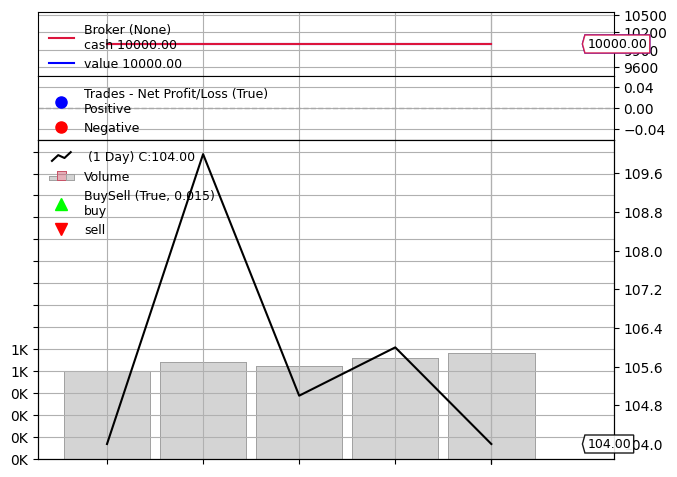

[[<Figure size 640x480 with 4 Axes>]]

In [8]:
%matplotlib inline
cerebro.plot(iplot=False) # 버전충돌문제를 피하기 위해 대화형(interactive) 플롯을 False, 정적챠트 생성

### 단순 텍스트 읽기

In [332]:
%%writefile data/myTest.txt
Hello World
This is to say hello
Hhhello to everybody

Overwriting data/myTest.txt


In [10]:
import os
class TextProcessor:
    def __init__(self, file_path):
        self.lines = []

        with open(file_path, 'r') as file:
            self.lines = file.readlines()

    def print_lines(self):
        for line in self.lines:
            print(line.strip())
    
    def find_lines(self, target):
        return [line for line in self.lines if target in line] #find target

processor = TextProcessor(os.path.join('data','myTest.txt'))
processor.print_lines()
print("--Found: ")
linesFound = processor.find_lines('Hello'.lower())
for line in linesFound:
    print(line.strip())

Hello World
This is to say hello
Hhhello to everybody
--Found: 
This is to say hello
Hhhello to everybody


In [327]:
'Hello'.lower()

'hello'

### 실제 OHLC 데이터 읽기


In [13]:
import yfinance as yf

#sds=web.DataReader('018260.KS', 'yf', '1/1/2021', '11/10/2022') # yahoo
#sds=yf.download('018260.KS', start='2022-01-01', end='2024-07-31') # 멀티인덱스
sseTicker = yf.Ticker('018260.KS')
sds = sseTicker.history(start="2022-01-01", end="2025-08-15")

# sdsF=sds.astype(float) # CSV에서 읽거나 문자열인 경우 형변환을 위해 필요

sds[:3]

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2022-01-04 00:00:00+09:00,146383.447284,146852.625000,144506.736422,146852.625000,88751,0.0,0.0
2022-01-05 00:00:00+09:00,144975.908088,146383.441176,142630.019608,143568.375000,104430,0.0,0.0
2022-01-06 00:00:00+09:00,142160.841600,144037.552380,138876.597735,139814.953125,179429,0.0,0.0


In [14]:
import backtrader as bt

class PrintClose(bt.Strategy):
    def __init__(self):
        self.close = self.datas[0].close  # 종가의 저장

    def log(self, txt, dt=None):
        dt = dt or self.datas[0].datetime.date(0) # 각 일자의 형식을 설정
        #print(f'{dt.isoformat()} : {txt}') # 일자와 txt를 출력
        print('%s %s' % (dt, txt))

    def next(self): # 반복적으로 호출하는 함수
        self.log('종가: %.2f' % self.close[0]) # 0은 첫행을 계속 출력한다

cerebro = bt.Cerebro()

#_data = bt.feeds.YahooFinanceCSVData(dataname='TSLA.csv')
_data=bt.feeds.PandasData(dataname=sds[-10:]) # 출력분량을 10개로 제한한다.
cerebro.adddata(_data)
cerebro.addstrategy(PrintClose)

cerebro.run()

2025-07-31 종가: 152500.00
2025-08-03 종가: 154400.00
2025-08-04 종가: 154800.00
2025-08-05 종가: 154300.00
2025-08-06 종가: 155500.00
2025-08-07 종가: 154500.00
2025-08-10 종가: 153700.00
2025-08-11 종가: 152000.00
2025-08-12 종가: 152000.00
2025-08-13 종가: 151400.00


## 8.4 단순한 전략

### Daily Buy: 매수량과 투자금 출력

매일 매수하는 단순 전략을 실행해보자.

In [841]:
import backtrader as bt
import yfinance as yf

class DailyBuy(bt.Strategy):
    def __init__(self):
        self.order = None

    def next(self):
        if self.order:  # 주문이 이미 있으면 (열려 있으면)
            return
        #self.order = self.buy(size=10) # 매일 10주
        order = self.buy(size=10) # 매일 10주
        position = self.broker.getposition(self.data)
        print(f"주문량: {order.size} 보유량: {position.size} 일자: {self.datetime.datetime(0)} 종가: {self.data.close[0]}")

# Download data
#sds = yf.download('018260.KS', start='2022-01-01', end='2024-07-31')
_data = bt.feeds.PandasData(dataname=sds[-10:])

cerebro = bt.Cerebro()
cerebro.adddata(_data)
cerebro.broker.setcash(300000000)  # 현재 현금을 3억으로 설정
cerebro.addstrategy(DailyBuy)

print(f'Starting Portfolio Value: {cerebro.broker.getvalue():.2f}')
cerebro.run()
print(f'Final Portfolio Value: {cerebro.broker.getvalue():.2f}')

Starting Portfolio Value: 300000000.00
주문량: 10 보유량: 0 일자: 2024-07-17 00:00:00 종가: 156100.0
주문량: 10 보유량: 10 일자: 2024-07-18 00:00:00 종가: 155100.0
주문량: 10 보유량: 20 일자: 2024-07-19 00:00:00 종가: 155700.0
주문량: 10 보유량: 30 일자: 2024-07-22 00:00:00 종가: 153600.0
주문량: 10 보유량: 40 일자: 2024-07-23 00:00:00 종가: 151000.0
주문량: 10 보유량: 50 일자: 2024-07-24 00:00:00 종가: 150900.0
주문량: 10 보유량: 60 일자: 2024-07-25 00:00:00 종가: 151400.0
주문량: 10 보유량: 70 일자: 2024-07-26 00:00:00 종가: 153200.0
주문량: 10 보유량: 80 일자: 2024-07-29 00:00:00 종가: 153300.0
주문량: 10 보유량: 90 일자: 2024-07-30 00:00:00 종가: 146600.0
Final Portfolio Value: 299392000.00


- 코드 self.order 또는 order의 중요한 차이
    - self.order는 멤버변수라서, 변수 값이 남아있고, 중복 주문이 허용되지 않는다. 현재 열린 주문이 있을 때는 새로 주문을 하지않도록 하는 경우 그렇다.
    - order는 지역변수라서, 매 next마다 새롭게 설정해서 주문이 거듭된다. 이전 호출에서의 주문 상태를 기억하지 못하므로 그렇다.

- 코드 broker: cerebro.broker와 strategy.broker는 두 방법 모두 동일한 브로커 객체에 접근한다.
    **cerebro.broker**는 전략 외부에서, **strategy.broker**는 전략 내부에서 더 자주 사용된다.

    매매를 대신하려면 현금이 있어야 한다. cerebro.broker의 .setcash() 함수로 투자금을 설정하거나 .getvalue()로 읽어올 수 있다.

    현재 포트폴리오의 수수료를 설정하려면 cerebro.broker.setcommission(commission=0.001)
 
- 출력: 최초 현금과 현재 보유 자산 가치의 차이는 주가 하락으로 인한 손실분이다. 매수시점의 차이로 인해 단순 차액이 아니다.

### MA

매수조건: 전일에는 이평이 크지만, 당일에는 종가가 이평을 돌파할 때 매수한다.
매도조건: 설정하지 않는다.

데이터에서 이평이 종가를 교차하는 지점을 발견할 수 있다. 그 시점에 아래 챠트 녹색삼각형이 1개 그려진다.

```
2024-06-28 [next] [28] 종가: 148500.0 이평: 152260.0
2024-07-01 [next] [29] 종가: 152900.0 이평: 152245.0
```

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 20000000.000000
2024-05-21 [prenext] [1] 종가: 166100.0 이평: nan
2024-05-22 [prenext] [2] 종가: 165500.0 이평: nan
2024-05-23 [prenext] [3] 종가: 167700.0 이평: nan
2024-05-24 [prenext] [4] 종가: 168000.0 이평: nan
2024-05-27 [prenext] [5] 종가: 166700.0 이평: nan
2024-05-28 [prenext] [6] 종가: 160500.0 이평: nan
2024-05-29 [prenext] [7] 종가: 159000.0 이평: nan
2024-05-30 [prenext] [8] 종가: 154700.0 이평: nan
2024-05-31 [prenext] [9] 종가: 153200.0 이평: nan
2024-06-03 [prenext] [10] 종가: 158800.0 이평: nan
2024-06-04 [prenext] [11] 종가: 158200.0 이평: nan
2024-06-05 [prenext] [12] 종가: 157900.0 이평: nan
2024-06-07 [prenext] [13] 종가: 162000.0 이평: nan
2024-06-10 [prenext] [14] 종가: 154600.0 이평: nan
2024-06-11 [prenext] [15] 종가: 155600.0 이평: nan
2024-06-12 [prenext] [16] 종가: 154800.0 이평: nan
2024-06-13 [prenext] [17] 종가: 150300.0 이평: nan
2024-06-14 [prenext] [18] 종가: 150800.0 이평: nan
2024-06-17 [prenext] [19] 종가: 150300.0 이평: nan
2024-06-18 [next] [20] 종가: 149300.0 이평: 158200.0
2024-06-19 [next] [21] 종가

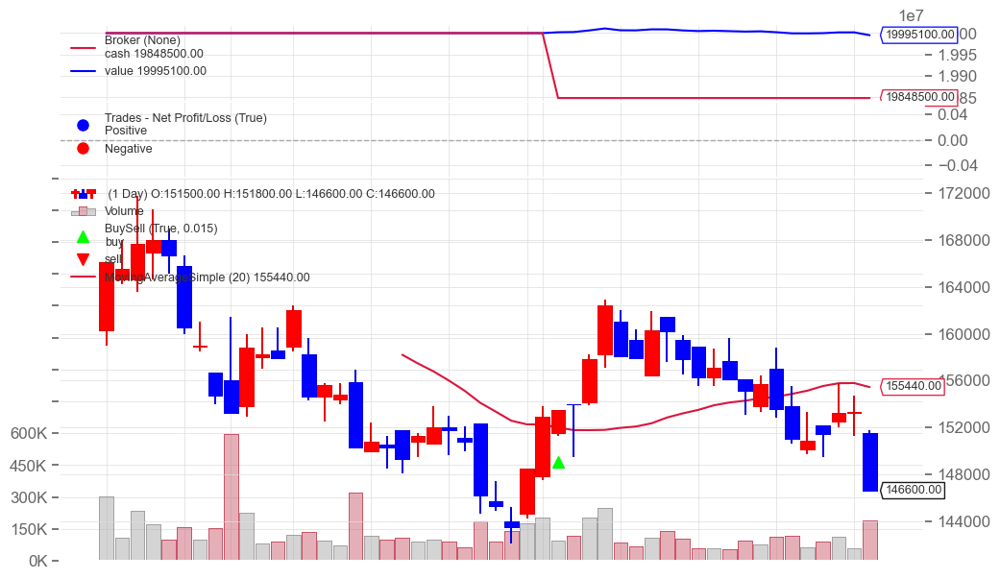

In [67]:
%matplotlib inline
import yfinance as yf
import backtrader as bt

class HelloStrategy(bt.Strategy):
    def __init__(self):
        self.dataclose = self.datas[0].close
        self.SMA = bt.indicators.MovingAverageSimple(period=20)
    def log(self, txt, dt=None):
        dt = dt or self.datas[0].datetime.date(0) # 각 일자를 출력
        #print(f'{dt.isoformat()} : {txt}')
        print('%s %s' % (dt, txt))
    def prenext(self):
        self.log(f'[prenext] [{len(self)}] 종가: {self.dataclose[0]} 이평: {self.SMA[0]}')

    def next(self):
        self.log(f'[next] [{len(self)}] 종가: {self.dataclose[0]} 이평: {self.SMA[0]}')

        if self.dataclose[-1] < self.SMA[-1]:
            if self.dataclose[0] > self.SMA[0]:
                self.order = self.buy()

if __name__ == "__main__":
    cerebro = bt.Cerebro()
    cerebro.addstrategy(HelloStrategy)
    sds=yf.download('018260.KS', start='2022-01-01', end='2024-07-31')
    _data=bt.feeds.PandasData(dataname=sds[-50:])
    #sdsF=sds.astype(float)
    #_data=bt.feeds.PandasData(dataname=sdsF)
    cerebro.adddata(_data)
    cerebro.broker.setcash(20000000)
    print(f'Starting Portfolio Value: {cerebro.broker.getvalue():2f}')
    cerebro.run()
    print(f'Final Portfolio Value: {cerebro.broker.getvalue():2f}')

    cerebro.plot(iplot=False, style='candle', barup='red', bardown='blue')
    #cerebro.plot(iplot=False)

챠트가 그려지지 않고 IPython is not defined 오류 메시지가 뜨면:

```
%matplotlib inline
cerebro.plot(iplot=False)
```


- 코드 class HelloStrategy(bt.Strategy): Backtrader의 Strategy 클래스를 상속받는다.

- 코드 indicators: 내장 함수들을 사용할 수 있다.

    bt.indicators.ExponentialMovingAverage(self.datas[0], period=25)
    bt.indicators.WeightedMovingAverage(self.datas[0], period=25).subplot = True
    bt.indicators.StochasticSlow(self.datas[0])
    bt.indicators.MACDHisto(self.datas[0])
    rsi = bt.indicators.RSI(self.datas[0])
    bt.indicators.SmoothedMovingAverage(rsi, period=10)
    bt.indicators.ATR(self.datas[0]).plot = False

- 코드 prenext: 최소 데이터 기간이 충족되기 전에 호출된다. prenext 함수는 전략이 적절하게 동작하기 위해서 필요한 최소한 또는 충분한 데이타가 수집되지 않았을 때 호출된다.

- 코드 len(self): 전략이 진행된 바의 수를 의미하며, 공휴일이나 비거래일은 데이터 포인트에서 제외되므로 포함되지 않는다.

### 전고점 비교 전략

전고점을 추적하여 매매한다.

- 매도조건: 전고점에서 기준이하로 하락하는 경우 매도. 매도한 후 전고점을 갱신한다.
- 매수조건: 전고점에서 기준이하로 하락하지 않은 경우 매수


[*********************100%%**********************]  1 of 1 completed


초기 자본: 10000000
전고점 갱신: 156500.0 --> 0  2022-01-04 
매수: 156500.0	 2022-01-04
매도: 130000.0 전고점 기준이후 하락	2022-03-22
전고점 갱신: 133500.0 --> 130000.0  2022-03-23 
매수: 133500.0	 2022-03-23
전고점 갱신: 135500.0 --> 133500.0  2022-03-29 
전고점 갱신: 138500.0 --> 135500.0  2022-03-31 
전고점 갱신: 139500.0 --> 138500.0  2022-04-01 
전고점 갱신: 140000.0 --> 139500.0  2022-04-05 
전고점 갱신: 147000.0 --> 140000.0  2022-04-28 
전고점 갱신: 148500.0 --> 147000.0  2022-04-29 
전고점 갱신: 149000.0 --> 148500.0  2022-05-02 
매도: 125500.0 전고점 기준이후 하락	2022-08-29
전고점 갱신: 128500.0 --> 125500.0  2022-08-30 
매수: 128500.0	 2022-08-30
전고점 갱신: 129000.0 --> 128500.0  2022-11-15 
전고점 갱신: 130500.0 --> 129000.0  2022-11-16 
전고점 갱신: 132300.0 --> 130500.0  2023-02-08 
전고점 갱신: 133600.0 --> 132300.0  2023-07-17 
전고점 갱신: 138100.0 --> 133600.0  2023-08-01 
전고점 갱신: 140700.0 --> 138100.0  2023-08-07 
전고점 갱신: 141400.0 --> 140700.0  2023-08-24 
전고점 갱신: 143400.0 --> 141400.0  2023-08-28 
전고점 갱신: 144100.0 --> 143400.0  2023-09-05 
전고점 갱신: 150400.0 --> 144100

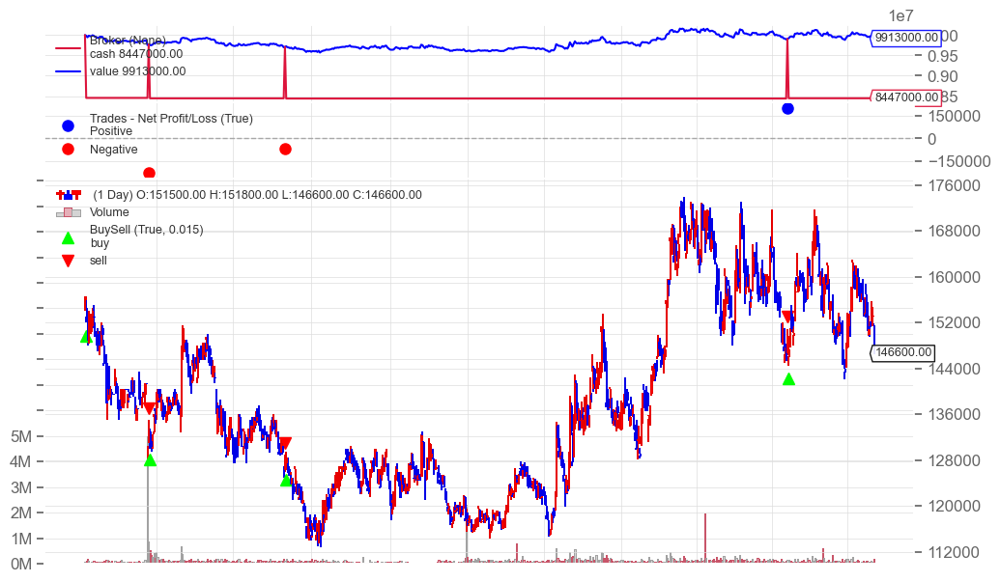

In [76]:
%matplotlib inline

import backtrader as bt
import datetime

class PeakDropStrategy(bt.Strategy):
    params = (
        ('drop_threshold', 0.15),  # 기준 이하 하락시 매도
    )

    def __init__(self):
        self.highest_price = 0  # 전고점

    def next(self):
        current_price = self.data.close[0]

        if current_price > self.highest_price:
            print(f"전고점 갱신: {current_price} --> {self.highest_price}  {self.data.datetime.date(0)} ")
            self.highest_price = current_price

        if current_price <= self.highest_price * (1 - self.params.drop_threshold):
            if self.position:
                self.sell(size=self.position.size)
                print(f"매도: {current_price} 전고점 기준 하락\t{self.data.datetime.date(0)}")            
            self.highest_price = current_price # 하락시 전고점 초기화

        elif not self.position:
            self.buy(size=10)
            print(f"매수: {current_price}\t {self.data.datetime.date(0)}")

if __name__ == '__main__':
    cerebro = bt.Cerebro()
    cerebro.addstrategy(PeakDropStrategy)

    #cerebro.adddata(_data)
    sds=yf.download('018260.KS', start='2022-01-01', end='2024-07-31')
    _data=bt.feeds.PandasData(dataname=sds)
    cerebro.adddata(_data)

    cerebro.broker.set_cash(10000000) # 초기자본 천만원

    print(f"초기 자본: {cerebro.broker.getvalue()}")
    cerebro.run()
    print(f"최종 자본: {cerebro.broker.getvalue()}")
    cerebro.plot(iplot=False)

## 8.5 이동평균 전략

### 주문 청산

매수 조건:
- 현재의 MA 교차: self.SMAfast[0] > self.SMAslow[0] 현재 시점에서 빠른 이동평균이 느린 이동평균보다 높을 때.
- 이전의 MA 교차: self.SMAfast[-1] < self.SMAslow[-1]: 이전 시점에서 빠른 이동평균이 느린 이동평균보다 낮았을 때.

매도 조건은 매수 조건의 반대:
- 현재의 MA 교차: self.SMAfast[0] < self.SMAslow[0] 현재 시점에서 빠른 이동평균이 느린 이동평균보다 높을 때.
- 이전의 MA 교차: self.SMAfast[-1] > self.SMAslow[-1]: 이전 시점에서 빠른 이동평균이 느린 이동평균보다 낮았을 때.

기존 포지션 청산: else문의 이미 포지션이 존재할 때 실행, 일정 기간 유예하거나 조건에 따라 바로 실행된다.
- self.buy() 또는 self.sell()을 호출하면 새로운 포지션이 생성되고 명시적으로 청산되는 것은 아니다. 주문이 체결되면 현재 포지션이 변경되고, 새로운 포지션이 형성되므로 주문이 체결되면서 포지션이 자동으로 청산된다고 이해하자 (예를 들어, self.sell()을 호출하면, 현재 열려 있는 매수 포지션이 자동으로 청산된다. 즉 매도 주문이 체결되면, 해당 매수 포지션은 종료되고 새로운 매도 포지션이 열리게 된다). 그러나 self.close()와 같은 메서드를 호출하여 명시적으로 포지션을 청산할 수도 있다 (backtesting.py (self.position.close())나 backtrader 모두 마찬가지이다).
- 5일 후 청산 조건을 넣으면 if len(self) >= (self.bar_executed + 5)
- self.close()를 호출, 즉 포지션을 종료하고 청산한다고 해서 즉시 체결이 이루어진다는 의미는 아니다. 시장가 또는 지정가인지 시장의 상황에 따라 주문이 체결된다.
- 주문 시점의 가격이 아닌, 청산할 때의 실제 체결 가격 (시정가 또는 지정가를 지정한다)이 수익률 계산에 사용된다.

중복주문의 방지:
- 실제매매와 달리, 백테스트에서 중복주문은 원하지 않게 주문이 반복적으로 실행되는 경우를 의미한다.
- 중복주문이 되면, 수수료가 증가하거나 의도하지 않은 포지션 크기가 커질 수 있다.
- Backtrader에는 자동으로 중복주문을 방지하는 exclusive_orders와 같은 옵션은 없지만, 주문이 진행 중일 때 추가 주문을 막는 방식으로 비슷한 기능을 구현할 수 있다. 아래 코드를 보면, self.position은 주문체결 후에만 갱신된다. 그냥 다음 행 next로 진입하는 식으로 중복주문을 막고 있다.

```
if self.order:  # 기존 주문이 실행 중이면 새로운 주문을 막음
    return
```


In [842]:
import backtrader as bt

class HelloStrategy2(bt.Strategy):
    pfast = 20
    pslow = 50

    def __init__(self):
        self.dataclose = self.datas[0].close
        self.SMAslow = bt.indicators.MovingAverageSimple(period=self.pslow)
        self.SMAfast = bt.indicators.MovingAverageSimple(period=self.pfast)

    def log(self, txt, dt=None):
        dt = dt or self.datas[0].datetime.date(0) # 각 일자를 출력
        #print(f'{dt.isoformat()} : {txt}')
        print('%s %s' % (dt, txt))

    def next(self):
        if not self.position: # 매수/매도 포지션이 없으면
            if self.SMAfast[0] > self.SMAslow[0] and self.SMAfast[-1] < self.SMAslow[-1]:
                self.log(f'매수 주문 {self.dataclose[0]:2f}')
                self.order = self.buy()  
            elif self.SMAfast[0] < self.SMAslow[0] and self.SMAfast[-1] > self.SMAslow[-1]:
                self.log(f'매도 주문 {self.dataclose[0]:2f}')
                # Keep track of the created order to avoid a 2nd order
                self.order = self.sell()
        else:
            #if len(self) >= (self.bar_executed + 5): # 5일의 청산 조건
                self.log(f'CLOSE CREATE {self.dataclose[0]:2f}')
                self.order = self.close()

if __name__ == "__main__":
    cerebro = bt.Cerebro()
    cerebro.addstrategy(HelloStrategy2)
    _data=bt.feeds.PandasData(dataname=sds)
    #sdsF=sds.astype(float)
    #_data=bt.feeds.PandasData(dataname=sdsF)
    cerebro.adddata(_data)
    cerebro.broker.setcash(20000000)
    print(f'Starting Portfolio Value: {cerebro.broker.getvalue():2f}')
    cerebro.run()
    print(f'Final Portfolio Value: {cerebro.broker.getvalue():2f}')

    #cerebro.plot(style='candle', barup='red', bardown='blue')

Starting Portfolio Value: 20000000.000000
2022-04-26 매수 주문 136000.000000
2022-04-27 CLOSE CREATE 137000.000000
2022-06-22 매도 주문 130500.000000
2022-06-23 CLOSE CREATE 129000.000000
2022-08-18 매수 주문 133000.000000
2022-08-19 CLOSE CREATE 133500.000000
2022-08-26 매도 주문 129500.000000
2022-08-29 CLOSE CREATE 125500.000000
2022-11-09 매수 주문 127000.000000
2022-11-10 CLOSE CREATE 127000.000000
2023-01-04 매도 주문 120000.000000
2023-01-05 CLOSE CREATE 120500.000000
2023-02-09 매수 주문 131400.000000
2023-02-10 CLOSE CREATE 127200.000000
2023-03-15 매도 주문 117700.000000
2023-03-16 CLOSE CREATE 117300.000000
2023-05-22 매수 주문 123800.000000
2023-05-23 CLOSE CREATE 122800.000000
2023-07-12 매도 주문 118500.000000
2023-07-13 CLOSE CREATE 118400.000000
2023-08-01 매수 주문 138100.000000
2023-08-02 CLOSE CREATE 133100.000000
2023-10-13 매도 주문 135500.000000
2023-10-16 CLOSE CREATE 135500.000000
2023-11-17 매수 주문 147600.000000
2023-11-20 CLOSE CREATE 145500.000000
2024-01-31 매도 주문 152000.000000
2024-02-01 CLOSE CREATE 154800

### 주문 추적

앞 전략에서 주문을 추적하도록 수정해보자.

주문의 상태(예: 완료, 취소 등)를 확인하고 싶다면, 주문 객체를 저장하고 해당 객체의 속성(order.Completed)을 확인하여 주문이 완료되었는지 여부를 판단할 수 있다.

[*********************100%%**********************]  1 of 1 completed


Starting Portfolio Value: 20000000.000000
2022-04-26 매수 주문 [76] 136000.000000
2022-04-27 [+매수 완료] 매수량: 1 가격: 133000.00
2022-04-27 CLOSE CREATE 137000.000000
2022-04-28 [-매도 완료] 매수량: -1 가격 137500.00
2022-06-22 매도 주문 130500.000000
2022-06-23 [-매도 완료] 매수량: -1 가격 130500.00
2022-06-23 CLOSE CREATE 129000.000000
2022-06-24 [+매수 완료] 매수량: 1 가격: 129000.00
2022-08-18 매수 주문 [153] 133000.000000
2022-08-19 [+매수 완료] 매수량: 1 가격: 133000.00
2022-08-19 CLOSE CREATE 133500.000000
2022-08-22 [-매도 완료] 매수량: -1 가격 133000.00
2022-08-26 매도 주문 129500.000000
2022-08-29 [-매도 완료] 매수량: -1 가격 127000.00
2022-08-29 CLOSE CREATE 125500.000000
2022-08-30 [+매수 완료] 매수량: 1 가격: 126500.00
2022-11-09 매수 주문 [208] 127000.000000
2022-11-10 [+매수 완료] 매수량: 1 가격: 126500.00
2022-11-10 CLOSE CREATE 127000.000000
2022-11-11 [-매도 완료] 매수량: -1 가격 129000.00
2023-01-04 매도 주문 120000.000000
2023-01-05 [-매도 완료] 매수량: -1 가격 120000.00
2023-01-05 CLOSE CREATE 120500.000000
2023-01-06 [+매수 완료] 매수량: 1 가격: 120000.00
2023-02-09 매수 주문 [271] 131400.00000

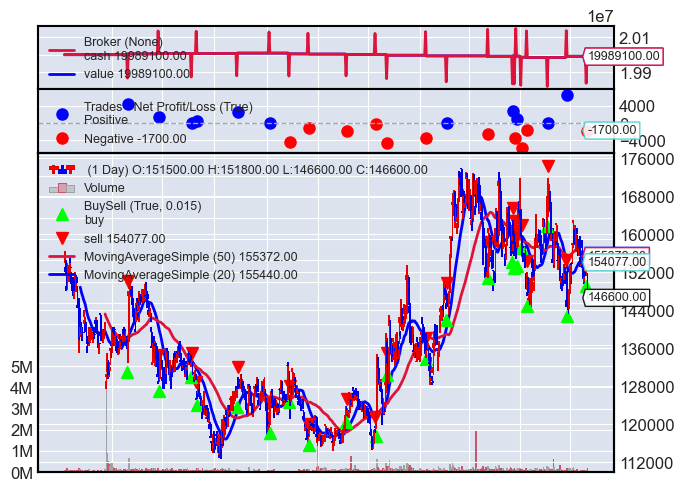

In [850]:
%matplotlib inline
import yfinance as yf
import backtrader as bt

class HelloStrategy2(bt.Strategy):
    pfast = 20
    pslow = 50

    def __init__(self):
        self.dataclose = self.datas[0].close
        self.SMAslow = bt.indicators.MovingAverageSimple(period=self.pslow)
        self.SMAfast = bt.indicators.MovingAverageSimple(period=self.pfast)

    def log(self, txt, dt=None):
        dt = dt or self.datas[0].datetime.date(0) # 각 일자를 출력
        #print(f'{dt.isoformat()} : {txt}')
        print('%s %s' % (dt, txt))

    def next(self):
        if not self.position: # 매수/매도 포지션이 없으면
            if self.SMAfast[0] > self.SMAslow[0] and self.SMAfast[-1] < self.SMAslow[-1]:
                self.order = self.buy()
                self.log(f'매수 주문 [{len(self)}] {self.dataclose[0]:2f}')
            elif self.SMAfast[0] < self.SMAslow[0] and self.SMAfast[-1] > self.SMAslow[-1]:
                self.log(f'매도 주문 {self.dataclose[0]:2f}')
                # Keep track of the created order to avoid a 2nd order
                self.order = self.sell()
        else:
            #if len(self) >= (self.bar_executed + 5):
                self.log(f'CLOSE CREATE {self.dataclose[0]:2f}')
                self.order = self.close()

    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            return

        # 주의: broker could reject order if not enough cash
        if order.status in [order.Completed]:
            if order.isbuy():
                self.log(f'[+매수 완료] 매수량: {order.size} 가격: {order.executed.price:.2f}')
            elif order.issell():
                self.log(f'[-매도 완료] 매수량: {order.size} 가격 {order.executed.price:.2f}')
            #self.bar_executed = len(self)

        elif order.status in [order.Canceled, order.Margin, order.Rejected]:
            self.log('x주문 취소/마진/거절')

        # Reset orders
        self.order = None

if __name__ == "__main__":
    cerebro = bt.Cerebro()
    sds=yf.download('018260.KS', start='2022-01-01', end='2024-07-31')
    _data=bt.feeds.PandasData(dataname=sds)
    cerebro.adddata(_data)
    cerebro.addstrategy(HelloStrategy2)
    cerebro.broker.setcash(20000000)
    print(f'Starting Portfolio Value: {cerebro.broker.getvalue():2f}')
    results = cerebro.run() # 기본분석기가 없다. results[0].broker.getvalue()로 출력가능
    print(f'Final Portfolio Value: {cerebro.broker.getvalue():2f}')
    #cerebro.plot(style='candle', barup='red', bardown='blue')
    cerebro.plot(iplot=False)

-  코드 notify_order: Backtrader에서 buy()나 sell() 메서드를 사용하여 주문을 제출한 후, 주문의 상태가 변경될 때 notify_order() 메서드가 자동으로 호출되며, 이를 통해 주문의 상태를 추적할 수 있다.

    - 주문 상태의 추적: notify_order() 함수는 주문 상태가 변경될 때마다 자동으로 호출된다.
    
    - order 객체: Backtrader에서 거래를 나타내며, buy() 또는 sell() 메서드를 통해 생성된다. 매수 주문 객체를 만드는 코드는 order = self.buy(), 매도 주문 객체는 order = self.sell()
    
    - 주문 상태: 주문이 성공적으로 실행되었는지, 취소되었는지, 거부되었는지 등을 확인할 수 있다. 주요 상태는: (1) 'Created' 주문 생성 (2) 'Submitted' 주문이 브로커에게 제출, (3) 'Accepted' 주문을 브로커가 수락, (4) 'Completed' 주문이 실행, (5) 'Canceled' 주문이 취소, (6) 'Rejected' 주문이 거부, (7) 'Margin' (레버리지 거래를 할 때 사용되는 증거금이 부족하면 주문이 거부)
    
    - 주문 관련 함수
        (1) buy() 매수, sell() 매도, cancel(order) 제출된 주문의 취소
        (2) order_target_size() 목표 포지션 수량을 설정하는 주문, order_target_value() 목표 포지션 금액을 설정하는 주문, order_target_percent() 포트폴리오에서의 자산의 목표비율을 설정하는 주문
    
    - 주문 실행 정보
        order.executed.price 실행가격, order.executed.size 실행수량, order.executed.value 실행 총가치, order.executed.comm 실행 수수료

- 포지션: Backtrader에서 position은 매수 또는 매도 주문이 실행될 때 생성된다. position.size에 따라 True 또는 False 값을 가질 수 있다.
    - 포지션이 없으면 크기(self.position.size)는 0이 되고, 매도/매수
        - if not self.position: 현재 포지션이 없는 경우 매수 주문
        - if pos_size > 0 and self.dataclose[0] > pos_price * 1.05:: 포지션이 존재하고, 가격이 5% 이상 상승하면 매도 주문
    - else 포지션이 있으면 청산 주문

- buy, sell, close

    현재 매수 포지션이 있을 때, self.sell()을 호출하면, 매도 주문이 실행되면서 기존의 매수 포지션이 종료. 
    현재 매도 포지션이 있을 때, self.buy()을 호출하면, 매수 주문이 실행되면서 기존의 매도 포지션이 종료.
    
    self.order = self.close() 코드는 self.close()를 통해 생성된 청산 주문을 self.order에 저장한다.

- Sizer

Backtrader에서 addsizer() 함수는 거래 전략에서 포지션의 크기를 결정 결정한다. Sizer는 전략에서 얼마나 많은 주식(또는 다른 자산)을 매수하거나 매도할지를 제어하는 역할을 한다. 명시적으로 설정하지 않으면, 기본값은 1이다 (1개, backtesting.py는 100% 전량매매를 의미). 전부 또는 일부와 같은 비율이나 세밀한 설정을 하려면 다음과 같은 Sizer 클래스를 사용한다:

    - FixedSize: 고정된 수량, cerebro.addsizer(bt.sizers.FixedSize, stake=10)
    - PercentSizer: 자본의 일정 비율, cerebro.addsizer(bt.sizers.PercentSizer, percents=20)
    - CashSizer: 금액기준 설정, cerebro.addsizer(bt.sizers.CashSizer, cash=10000)
    - AllInSizer: 가용 자산을 모두 사용, cerebro.addsizer(bt.sizers.AllInSizer)
    - 또는 직접 설정: 전량 self.broker.getposition(data).size 또는 비율 int(cash / data.close[0] * 0.10)로 설정할 수 있다.

- cerebro.run()의 주요 작업

    - cerebro 객체에 추가된 데이터 피드들을 초기화하고, 데이터가 올바르게 로드되었는지 확인한다.
    
    - cerebro.addstrategy()를 통해 추가된 전략(또는 여러 전략)을 초기화한다.
    전략의 __init__() 메서드가 호출되며, 여기서 사용자 정의 변수 및 지표들이 설정된다.
    
    - 시장 초기 상태 설정: 브로커 및 포트폴리오 초기 상태가 설정된다. 예를 들어, 초기 자금, 수수료, 슬리피지 (실제 거래 가격과 예상 가격(또는 주문 가격) 간의 차이) 등이 설정된다.
    
    - 백테스트 반복 실행: 1줄의 바(bar) 단위로 처리하며, next() 메서드가 반복적으로 호출된다. 매매 신호 -> 주문 -> 브로커가 주문을 관리 -> 체결 -> 전략의 notify_order() 메서드를 통해 전략에 통보된다.
    
    - 포지션 및 주문 관리: 전략이 내린 주문을 브로커가 관리하고, 매수 및 매도 주문을 체결한다. 체결된 포지션은 전략의 self.position을 통해 추적되며, 이 정보는 다음 바에서의 전략 결정에 영향을 미칠 수 있다.
    
    - 결과 집계 및 반환: 백테스트가 종료되면, 최종적인 포트폴리오 가치, 주문 내역, 거래 기록 등의 결과가 집계, 출력된다.

- 코드 setcash: Backtrader에서는 Cerebro 객체의 브로커(broker)를 통해 현금을 설정한다 (예: cerebro.broker.set_cash(10000)). 반면에 Backtesting.py에서는 Backtest 클래스를 생성할 때 cash 인자에 현금을 설정한다 (예: Backtest(GOOG, MyStrategy, cash=10000)). cash를 설정하지 않으면 Backtesting.py는 30,000 Backtrader는 100,000이 기본이다.

- 실행결과

    cerebro.run() 실행하고 나서 분석결과를 출력하려면 조금 복잡하고, 다음에 설명하기로 한다.
    Backtrader에서 cerebro.run()을 실행한 후 분석기를 추가하지 않은 경우, 특별히 분석된 결과가 출력되지 않는다. 대신, cerebro.run()의 결과는 전략 인스턴스들의 리스트를 반환하는데, 0번째 브로커를 통해 분석결과를 출력할 수 있다.
    
    results[0].broker.getvalue()는 cerebro.broker.getvalue()와 동일한 값을 출력한다.

- plot: import matplotlib 하지 않아도 된다. 그냥 cerebro.plot() 명령은 다음 3 Observers를 포함해서 챠트를 그려준다. 

    - 창1 CashValue Observer: 현재 자산의 Cash 챠트
    - 창2 Trade Observer: Trade PnL (Profit and Loss)
    - 창3 BuySell Observer: 매매 기록

    기본으로 창1~3을 포함하는데 (stdstats=True), 시작할 때 설정을 변경할 수 있다.
    
    ```
    cerebro = bt.Cerebro(stdstats=False)
    
    또는
    
    cerebro = bt.Cerebro()
    ...
    cerebro.run(stdstats=False)
    ```

- Observer
Observer는 Strategy와 함께 실행되며, 특정 이벤트가 발생할 때마다 Observer가 상태를 기록한다 (전략의 트레이드, 포지션 변동, 계좌 가치 변화 등).

내장된 Observer들: Backtrader는 여러 기본 Observer를 제공하며, 필요에 따라 커스텀 Observer를 작성할 수도 있다.
기본 Observer들을 살펴보면, Broker (계좌 가치(캐시 + 포지션 가치)를 기록), BuySell (매도/매수 시점 관련 정보 기록), DrawDown (전략의 최대 손실(DrawDown)과 관련된 정보를 기록), Value (특정 시점의 계좌 가치(종가 기준)를 기록), Trades (각 트레이드의 손익을 추적하고 기록), Benchmark (전략의 성과를 벤치마크 지수와 비교) 등이다.

다음은 Broker와 BuySell Observer를 Cerebro에 추가하는 예시이다:

```
import backtrader as bt

class Broker(Observer):
    alias = ('CashValue',)
    lines = ('cash', 'value')

    plotinfo = dict(plot=True, subplot=True)

    def next(self):
        self.lines.cash[0] = self._owner.broker.getcash()
        self.lines.value[0] = value = self._owner.broker.getvalue()

이렇게 정의하고, 나중에 Observer를 추가한다.

cerebro = bt.Cerebro()
...
erebro.addobserver(bt.observers.Broker)
cerebro.addobserver(bt.observers.BuySell)

```


- 실행결과

cerebro.run() 실행하고 나서 분석결과를 출력하기 위해서는 분석기가 필요하다.

우선 줄1과 같이 분석기를 추가해야 한다.
그리고 실행을 하고 (줄2), 비로서 얻은 반환결과는 리스트 형식으로 한 걸음 더 진입해야 한다. 줄3 results[0].analyzers 객체를 통해 원하는 (줄1에서 추가한) 분석기의 결과에 접근할 수 있다.

```
줄1: cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name='sharpe')
줄2: results = cerebro.run()
줄3: results[0].analyzers.sharpe.get_analysis()
```

Backtrader에서 제공하는 대표적인 분석기들은 다음과 같다:

    - SharpeRatio: 샤프 비율은 리스크 대비 수익을 평가하는 지표
    cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name='sharpe')
    
    - DrawDown: 최대 손실 지표
    cerebro.addanalyzer(bt.analyzers.DrawDown, _name='drawdown')
    
    - TradeAnalyzer: 전체 거래에 대한 요약(성공률, 평균수익, 평균손실, 수익/손실 비율 등)
    cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name='trade')
    
    - Returns: 특정 기간 동안의 수익률
    cerebro.addanalyzer(bt.analyzers.TimeReturn, _name='returns')
    
    - Transactions: 거래의 일시, 가격, 수량 등
    cerebro.addanalyzer(bt.analyzers.Transactions, _name='transactions')
    
    - AnnualReturn 연간 수익률
    cerebro.addanalyzer(bt.analyzers.AnnualReturn, _name='annual_return')
    
    - PyFolio - Backtrader와 PyFolio를 연결하여 PyFolio 분석
    cerebro.addanalyzer(bt.analyzers.PyFolio, _name='pyfolio')


## 8.5 성과 분석

수익률, Sharpe 수익률, 하락률 등 성과를 분석하기 위해서는 addanalyzer() 함수를 사용한다.

잔고출력 시 작성한 HelloStrategy2를 활용해, 여러 성과분석을 해보자.

In [851]:
%matplotlib inline
import backtrader as bt
import pandas as pd

if __name__ == "__main__":
    cerebro = bt.Cerebro()
    cerebro.addstrategy(HelloStrategy2)
    _data=bt.feeds.PandasData(dataname=sds)
    #sdsF=sds.astype(float)
    #_data=bt.feeds.PandasData(dataname=sdsF)
    cerebro.adddata(_data)
    cerebro.broker.setcash(20000000)
    print(f'Starting Portfolio Value: {cerebro.broker.getvalue():2f}')
    # 수익률 추가1: 일일 수익률 계산을 위해 TimeReturn 분석기 추가
    cerebro.addanalyzer(bt.analyzers.TimeReturn, _name='returns')
    results = cerebro.run() # 기본분석기가 없다. results[0].broker.getvalue()로 출력가능
    print(f'Final Portfolio Value: {cerebro.broker.getvalue():2f}')
    # 수익률 추가2: 분석기에서 수익률 데이터를 추출
    strat = results[0]
    returns = strat.analyzers.returns.get_analysis()
    # 수익률 추가3: 수익률 데이터를 pandas.Series로 변환
    returns_series = pd.Series(returns)
    # Pyfolio로 성과 분석
    #pf.create_simple_tear_sheet(returns_series)

    # 분석기 추가
    cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name='sharpe')
    cerebro.addanalyzer(bt.analyzers.DrawDown, _name='drawdown')
    cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name='trade')

    # 백테스트 실행
    results = cerebro.run()

    # 분석 결과 출력
    sharpe = results[0].analyzers.sharpe.get_analysis()
    drawdown = results[0].analyzers.drawdown.get_analysis()
    trade_analysis = results[0].analyzers.trade.get_analysis()

    print(f"Sharpe Ratio: {sharpe['sharperatio']:.2f}")
    print(f"Max Drawdown: {drawdown.max.drawdown:.2f}%")
    print(f"Total Trades: {trade_analysis.total.closed}")

    #cerebro.plot(style='candle', barup='red', bardown='blue')
    #cerebro.plot(iplot=False, style='candle', barup='red', bardown='blue')

Starting Portfolio Value: 20000000.000000
2022-04-26 매수 주문 [76] 136000.000000
2022-04-27 [+매수 완료] 매수량: 1 가격: 133000.00
2022-04-27 CLOSE CREATE 137000.000000
2022-04-28 [-매도 완료] 매수량: -1 가격 137500.00
2022-06-22 매도 주문 130500.000000
2022-06-23 [-매도 완료] 매수량: -1 가격 130500.00
2022-06-23 CLOSE CREATE 129000.000000
2022-06-24 [+매수 완료] 매수량: 1 가격: 129000.00
2022-08-18 매수 주문 [153] 133000.000000
2022-08-19 [+매수 완료] 매수량: 1 가격: 133000.00
2022-08-19 CLOSE CREATE 133500.000000
2022-08-22 [-매도 완료] 매수량: -1 가격 133000.00
2022-08-26 매도 주문 129500.000000
2022-08-29 [-매도 완료] 매수량: -1 가격 127000.00
2022-08-29 CLOSE CREATE 125500.000000
2022-08-30 [+매수 완료] 매수량: 1 가격: 126500.00
2022-11-09 매수 주문 [208] 127000.000000
2022-11-10 [+매수 완료] 매수량: 1 가격: 126500.00
2022-11-10 CLOSE CREATE 127000.000000
2022-11-11 [-매도 완료] 매수량: -1 가격 129000.00
2023-01-04 매도 주문 120000.000000
2023-01-05 [-매도 완료] 매수량: -1 가격 120000.00
2023-01-05 CLOSE CREATE 120500.000000
2023-01-06 [+매수 완료] 매수량: 1 가격: 120000.00
2023-02-09 매수 주문 [271] 131400.00000

## 8.6 최적화

In [2]:
단기와 장기 이동평균이 서로 교차하는지를 찾아서 매매 시그널로 판단하는 경우를 보자.

이 때 단기와 장기의 교차점 가운데 어느 지점에서 수익이 최대화되는 최적화를 할 수 있다.

backtesting.py는 optimize() 함수를 사용하는 반면, Backtrader는 cerebro.optstrategy() 함수를 사용해 최적화한다는 차이가 있다.

In [3]:
%%writefile src/HelloStrategy2Optimize.py
import yfinance as yf
import backtrader as bt
import pandas as pd

class HelloStrategy2(bt.Strategy):
    params = (
        ('pfast', 20),
        ('pslow', 50),
    )

    def __init__(self):
        self.dataclose = self.datas[0].close
        self.SMAslow = bt.indicators.MovingAverageSimple(period=self.p.pslow)
        self.SMAfast = bt.indicators.MovingAverageSimple(period=self.p.pfast)

    def log(self, txt, dt=None):
        dt = dt or self.datas[0].datetime.date(0) # 각 일자를 출력
        print('%s %s' % (dt, txt))

    def next(self):
        if not self.position: # 포지션이 없으면 (0 또는 None)
            if self.SMAfast[0] > self.SMAslow[0] and self.SMAfast[-1] < self.SMAslow[-1]:
                #self.log(f'매수 주문 [{len(self)}] {self.dataclose[0]:2f}')
                self.order = self.buy()  
            elif self.SMAfast[0] < self.SMAslow[0] and self.SMAfast[-1] > self.SMAslow[-1]:
                #self.log(f'매도 주문 {self.dataclose[0]:2f}')
                self.order = self.sell()
        else:
            #self.log(f'CLOSE CREATE {self.dataclose[0]:2f}')
            self.order = self.close()

if __name__ == "__main__":
    #cerebro = bt.Cerebro()
    cerebro = bt.Cerebro(optreturn = False)
    sds=yf.download('018260.KS', start='2022-01-01', end='2024-07-31')
    _data=bt.feeds.PandasData(dataname=sds)
    cerebro.adddata(_data)
    cerebro.broker.setcash(20000000)
    cerebro.addanalyzer(bt.analyzers.Returns, _name='returns') # 수익률 분석기
    cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name='sharpe_ratio') # Sharpe 분석기 추가
    cerebro.optstrategy(HelloStrategy2, pfast=range(5,20), pslow=range(50,60)) # 최적화 5,20 50,100
    cerebro.addsizer(bt.sizers.SizerFix, stake=3)

    results = None

    #if __name__ == "__main__": # cerebro를 if문 밖에서 정의하다가 안으로 옮김. [**100%%**]  1 of 1 completed 반복이 사라짐.
    print(f'Starting Portfolio Value: {cerebro.broker.getvalue():2f}')
    results = cerebro.run()  # 전략 최적화의 실행결과들 (리스트)

    final_results_list = []
    for run in results:
        for strategy in run:
            #PnL = round(strategy.broker.get_value() - 10000, 2)
            PnL = strategy.broker.get_value() # 전략의 현재 총평가액       
            # 앞의 하나씩 실행한 명령과 동일 sharpe = results[0].analyzers.sharpe.get_analysis()
            returns = strategy.analyzers.returns.get_analysis()
            sharpe = strategy.analyzers.sharpe_ratio.get_analysis() #분석한 샤프비율을 저장한다
            # 앞의 하나씩 실행한 출력과 동일 print(f"Sharpe Ratio: {sharpe['sharperatio']:.2f}")
            #final_results_list.append([strategy.params.pfast, strategy.params.pslow, PnL, sharpe['sharperatio']])
            final_results_list.append([strategy.p.pfast,strategy.p.pslow,PnL,returns['rtot'],sharpe['sharperatio']])
            #print(f"-----Sharpe Ratio: {sharpe['sharperatio']:.2f}") #테스트 출력
    
    sort_by_sharpe = sorted(final_results_list, key=lambda x: x[2], reverse=True) # 총평가액 기준으로 정렬
    #sort_by_sharpe = sorted(final_results_list, key=lambda x: x[3], reverse=True) # 인덱스에 따라 수익률/샤프 기준 정렬
    for line in sort_by_sharpe[:5]:
        print(line)
    print(pd.DataFrame(final_results_list, columns=['pfast','pslow','PnL','returns','sharperatio']))
    #cerebro.plot(style='candle', barup='red', bardown='blue')

Overwriting src/HelloStrategy2Optimize.py


최적화하면서 실행 횟수가 많아지기 때문에 시간이 좀 걸린다.

In [5]:
!python src/HelloStrategy2Optimize.py

Starting Portfolio Value: 20000000.000000
[17, 57, 20059400.0, 0.0029655982632849523, -9.293546090918264]
[16, 57, 20054600.0, 0.002726280318282729, -13.677341224997546]
[17, 56, 20045300.0, 0.0022624387542519346, -14.388854111157652]
[17, 58, 20044400.0, 0.0022175394409545933, -15.522143584358616]
[15, 59, 20043200.0, 0.002157670553799371, -13.825533274559795]
     pfast  pslow         PnL   returns  sharperatio
0        5     50  20005100.0  0.000255    -8.554779
1        5     51  20041100.0  0.002053   -14.319309
2        5     52  19983200.0 -0.000840   -12.728039
3        5     53  19949300.0 -0.002538   -14.965840
4        5     54  19947800.0 -0.002613   -18.543235
..     ...    ...         ...       ...          ...
145     19     55  20006900.0  0.000345   -13.107836
146     19     56  19970300.0 -0.001486   -18.612717
147     19     57  19960400.0 -0.001982   -18.570477
148     19     58  19989500.0 -0.000525   -19.710735
149     19     59  19986500.0 -0.000675   -11.979066



[*********************100%%**********************]  1 of 1 completed


- 코드 optreturn = False

최적화 속도를 빠르게 하기 위해 optreturn을 생략하고, optreturn=False이라고 해준다.

Backtrader에서 optstrategy를 사용하여 최적화를 수행할 때, 기본적으로 optreturn=True로 설정되어 있다. 그러면 반환되는 OptReturn 객체는 메모리 절약을 위해 전략 인스턴스의 모든 내용을 포함하지 않으며, 특히 broker와 같은 속성에 접근할 수 없게 된다.

optreturn=False로 설정하면 최적화된 각 전략이 실제 Strategy 인스턴스로 반환되고, broker.get_value()로 포트폴리오의 최종 가치를 확인할 수 있게 된다.

```
results = cerebro.run(optreturn=False) # 이렇게 설정하면 results 리스트에는 최적화된 실제 Strategy 인스턴스가 포함된다.
for strat in results:
    print(f"Final Portfolio Value: {strat.broker.get_value()}") # 설정하므로 broker.get_value()가 가능
```

- strategy.broker.get_value()

broker.get_value()는 Backtrader에서 포트폴리오의 총 자산 가치를 계산하는 기본 메서드로, 어떤 분석기를 추가하지 않아도 사용할 수 있다.
strategy.broker.get_value()를 사용하려면, 전략 인스턴스가 Cerebro 객체를 통해 실행된 후여야 한다. 최적화(optstrategy) 실행 시에는 접근 방식이 약간 다를 수 있다. 이 경우 OptReturn 객체를 통해 각 전략 인스턴스에 접근해야 한다.

그러나 optreturn=False라고 하지 않으면 broker를 사용할 수 없다.

PnL = strategy.broker.get_value()
AttributeError: 'OptReturn' object has no attribute 'broker'

대신 수익률을 구해서 최적의 전략을 고를 수 있다.

수익률은 출력할 때 다음과 같으니 'rtot'만 선택하도록 하자.

```
OrderedDict([
        ('rtot', -0.0026585307633357194),
        ('ravg', -4.2065360179362645e-06),
        ('rnorm', -0.0010594854250942332),
        ('rnorm100', -0.10594854250942333)])
```

- 총가치, 수익률

이 둘은 서로 비슷한 개념이지만, 반드시 동일하지는 않다. 계산식을 보면 차이가 보인다.

    - 수익률: 초기 자산에 대한 최종 자산의 증가율이다. 예를 들어, 수익률 = (최종 자산 가치 - 초기 자산 가치) / 초기 자산 가치.
    
    - 총가치: broker.get_value():
    broker.get_value()는 전략 실행 후 포트폴리오의 총 가치이고, 이 값은 초기 자산을 포함한 모든 자산의 합계를 나타낸다.

예를 들어, 초기 자산이 100,000이라 가정하고, 전략 실행 후 포트폴리오 가치가 120,000이 되었을 때:
수익률: (120,000 - 100,000) / 100,000 = 20%
broker.get_value(): 120,000

수익률:
전략이 초기 자산의 크기에 상관없이 얼마나 효율적인지를 비교하고자 할 때 사용한다.

broker.get_value():
최종 자산의 절대적인 가치를 최적화하고자 할 때 사용한다.


- 최적화 설정:

cerebro.optstrategy를 사용해 pfast와 pslow 매개변수의 범위를 지정하여 최적화를 수행한다. pfast는 5에서 19까지, pslow는 50에서 99까지의 범위로 설정되어 있다.
최적화를 통해 최적의 pfast와 pslow 값을 찾는다.

거래 시 얼마나 많은 주식을 매수하거나 매도할지(포지션 사이즈)를 고정시켜, 일정한 방식으로 전략의 성과를 테스트할 수 있다.

cerebro.addsizer(bt.sizers.SizerFix, stake=3)
bt.sizers.SizerFix 크기(stake)를 3으로 사용해 거래를 항상 3주를 매수 매도한다

- cerebro.run() 결과는 리스트

cerebro.run()를 실행하면 최적화를 한다는 의미이다. 모든 조합에 대해 최적화 백테스트를 수행하여 성과를 산출하고, 최적화의 결과가 저장된 OptReturn 객체의 리스트가 만들어진다.

그러면, 예를 들어 sharpe_ratio 분석기를 사용해 샤프 비율을 계산한다고 하자. 최적의 샤프 비율을 기준으로 결과를 정렬하여, 상위 5개의 결과를 출력할 수 있다.

- params 사용

TypeError: __init__() got an unexpected keyword argument 'pfast'

이 오류는 Backtrader에서 optstrategy를 사용해 전략을 최적화할 때 발생하는 문제로, 전달된 매개변수가 __init__ 메서드에서 예상하지 않은 키워드 인자로 인식되기 때문에 발생한다. 

이를 해결하기 위해 params라는 클래스를 사용하여 최적화할 매개변수를 지정할 수 있다. pfast와 pslow를 클래스 내부의 params 딕셔너리로 정의하고, self.p.pfast, self.p.pslow로 접근한다.

- 오류 설명 AttributeError: Can't get attribute 'HelloStrategy2' on <module '__main__' (built-in)>

Backtrader에서 최적화(optstrategy)를 수행할 때 발생하는 AttributeError: Can't get attribute 'HelloStrategy2' on <module '__main__' (built-in)> 오류는 주로 병렬 처리로 인해 발생한다. optstrategy가 전략을 병렬로 실행할 때, Python의 multiprocessing 모듈이 전략 클래스(예: HelloStrategy2)를 찾을 수 없어서 발생하게 된다.

Backtrader는 optstrategy를 사용해 여러 전략을 병렬로 실행하는데, multiprocessing 모듈은 각 프로세스에서 전략 클래스를 가져오려고 한다.
Python의 multiprocessing 모듈은 각 프로세스에서 모듈을 다시 불러온다. 이 과정에서 __main__ 모듈에 정의된 클래스(여기서는 HelloStrategy2)를 찾지 못하면 이 오류가 발생한다.

이 문제는 if __name__ == "__main__": 블록을 사용하면 해결된다. 전략 클래스를 if __name__ == "__main__": 블록 밖에서 정의하고, Cerebro와 관련된 코드를 그 안에 넣으면 된다.


## 8.7 성과분석 라이브러리

Backtrader (또는 backtesting.py도 마찬가지)에서 전략을 실행한 후, 수익률 분석 라이브러리 (PyFolio, QuantStats 등)을 활용해 더 상세하게 분석할 수 있다.

수익률을 pd.Series로 넘겨주면 된다. returns_series로 변환되면, 일자와 수익률로 구성된다.

```
OrderedDict([(datetime.datetime(2022, 1, 4, 0, 0), 0.0),
             (datetime.datetime(2022, 1, 5, 0, 0), 0.0),
             (datetime.datetime(2022, 1, 6, 0, 0), 0.0),
             ...
             (datetime.datetime(2024, 7, 26, 0, 0), 0.0),
             (datetime.datetime(2024, 7, 29, 0, 0), 5.002301058487646e-06),
             (datetime.datetime(2024, 7, 30, 0, 0), -9.004096864073663e-05)])
```

그러나, 성과측정 라이브러리 (PyFolio, QuantStats)와 백테스팅 라이브러리는 각기 다른 목적과 방식으로 평가를 수행하기 때문에 동일한 전략이라 하더라도 결과가 달라질 수 있다.

Backtrader나 backtesting.py에서는 초기 자금, 거래 비용, 슬리피지, 주문 실행 방식 등 다양한 매개변수를 설정하고 전략의 실제 매매 시뮬레이션에 초점을 맞추고 있다. 이러한 매개변수가 영향을 미치면서 성과에 차이가 발생하게 된다.

## 8.8 data 입력

backtrader에서 데이터를 입력할 때 bt.feeds.PandasData와 bt.feeds.GenericCSVData는 가장 일반적으로 사용되는 두 가지 데이터 피드이다.
다음과 같은 매개변수를 통해 입력 데이터를 조정한다.

- 매개변수 값의 의미
    - None : 해당하는 열이 없는 경우
    - -1 : 자동으로 동일한 컬럼명을 찾거나 해당하는 열이 없는 것으로 처리.
    - 0 이상 : 열의 순서를 뜻하는 정수인덱스. 실제로 열이 존재하면, 그 인덱스 값을 지정한다.

- 'dataname': Pandas 데이터프레임 또는 CSV 파일의 경로 (문자열).
- 'datetime': 기본값은 None으로 설정되며 (일자열이 없다는 의미), Pandas 데이터프레임의 경우, 지정하지 않으면 인덱스를 날짜로 본다.
  
- 'time': 기본값은 -1로 설정되며 시간 정보가 없는 경우에도 처리된다. datetime 필드와 다른 시간이다.
- 'open', 'high', 'low', 'close', 'volume', 'openinterest' 각 열을 가리키는 인덱스 번호이고, 기본값은 -1로 동일한 이름의 열을 자동으로 찾는다.
-  'fromdate', 'todate' 시작 종료 일자, datetime.datetime 형식이며, 데이터를 이 날짜 기준으로 필터링한다. 기본값은 None.
- dtformat (default: %Y-%m-%d %H:%M:%S) 일자형식 지정, PandasData 에서는 설정하지 않는다.
- tmformat (default: %H:%M:%S) 시간형식을 지정

In [ ]:
앞서 시계열의 항목을 주의깊게 보자. 앞 글자 대문자이고, 'Adj Close'를 포함하고 있다.
주식 시계열은 서로 항목의 명칭이나 구성이 다를 수 있다.

In [1]:
import yfinance as yf

#sds=web.DataReader('018260.KS', 'yf', '1/1/2021', '11/10/2022') # yahoo
sds=yf.download('018260.KS', start='2022-01-01', end='2024-07-31')
sds[:3]

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2022-01-04,156000.0,156500.0,154000.0,156500.0,150221.859375,88751
2022-01-05,154500.0,156000.0,152000.0,153000.0,146862.265625,104430
2022-01-06,151500.0,153500.0,148000.0,149000.0,143022.734375,179429


이번에는 ```data/myStock.csv``` 파일을 입력해보자. 항목의 명칭과 구성이 다르다.
컬럼명을 보면 'High', 'Low', 'Open', 'Close', 'Volume', 'Adj Close' 이렇다.

pandas에서는 일자가 index로 쓰이고 있다.

```
파일명: data/myStock.csv
datetime,open,high,low,close,volume,openinterest
2020-01-01,100,110,90,105,10000,0
2020-01-02,105,115,95,110,15000,0
2020-01-03,110,120,100,115,20000,0
```

### pandas 데이터 형식을 정해서 읽기


In [2]:
import pandas as pd
myStockDf = pd.read_csv('data/myStock.csv', index_col='datetime', parse_dates=True)
print(myStockDf.head())

            open  high  low  close  volume  openinterest
datetime                                                
2020-01-01   100   110   90    105  100000             0
2020-01-02   105   115   95    110   14000             0
2020-01-03   110   120  100    115   20000             0


컬럼명을 대문자로 변경해봄

In [3]:
myStockDf.columns

Index(['open', 'high', 'low', 'close', 'volume', 'openinterest'], dtype='object')

In [4]:
myStockDf.columns=['OPEN', 'HIGH', 'LOW', 'CLOSE', 'VOLUME', 'OpenInterest']

In [5]:
myStockDf

,OPEN,HIGH,LOW,CLOSE,VOLUME,OpenInterest
datetime,,,,,,
2020-01-01,100,110,90,105,100000,0
2020-01-02,105,115,95,110,14000,0
2020-01-03,110,120,100,115,20000,0


In [13]:
import backtrader as bt

class TestPrint(bt.Strategy):
    def __init__(self):
        pass

    def log(self, txt, dt=None):
        dt = dt or self.data.datetime[0]
        if isinstance(dt, float):
            dt = bt.num2date(dt)
        print("%s, %s" % (dt, txt))

    def next(self):
        self.log(f"Bar: {len(self)}, "
                 f"Open: {self.datas[0].open[0]:.1f}, "
                 f"High: {self.datas[0].high[0]:.1f}, "
                 f"Low: {self.datas[0].low[0]:.1f}, "
                 f"Close: {self.datas[0].close[0]:.1f}, "
                 f"Volume: {self.datas[0].volume[0]:7.0f}")

if __name__ == "__main__":
    cerebro = bt.Cerebro()
    _data=bt.feeds.PandasData(dataname=myStockDf)
    cerebro.adddata(_data) #직접 df를 넣으면 .adddata(myStockDf) 안된다.
    cerebro.addstrategy(TestPrint)
    cerebro.run()

2020-01-01 00:00:00, Bar: 1, Open: 100.0, High: 110.0, Low: 90.0, Close: 105.0, Volume:  100000
2020-01-02 00:00:00, Bar: 2, Open: 105.0, High: 115.0, Low: 95.0, Close: 110.0, Volume:   14000
2020-01-03 00:00:00, Bar: 3, Open: 110.0, High: 120.0, Low: 100.0, Close: 115.0, Volume:   20000


### PandasData 클래스 정의해줌

파일의 컬럼명을 매핑해서 읽어보자.

테스트하기 위해:
- 일자를 줄3만 읽도록 하고,
- high는 주석화하고
- low는 1을 2로 변경해 보았다.

Pandas 데이터의 datetime 컬럼을 사용하면 오류가 발생한다. None으로 변경하면 된다.

In [14]:
import datetime

_pdata = bt.feeds.PandasData(
    dataname=myStockDf, # 파일경로 'data/myStock.csv'를 지정하면 오류 -> GenericCSVData 피드를 사용해야.
    fromdate=datetime.datetime(2020, 1, 3), # 데이터 필터링
    todate=datetime.datetime(2020, 5, 1), # dt.datetime.now().date(),
    #dtformat=('%Y-%m-%d'), # PandasData에서는 설정하지 않는다. 
    datetime=None,  # datetime 열이 없고, 인덱스가 이미 datetime이다.
    open=0,      # 첫째 열이 open. 또는 open='OPEN' 직접 지정해도 되고 또는 생략해도 된다.
    #high=1,      # high 열의 인덱스 테스트로 생략해본다.
    low=1,       # low 열의 인덱스, 1로 지정하면 두 번째 열을 읽음.
    close=3,     # close 열의 인덱스
    volume=4,    # volume 열의 인덱스
    openinterest='OpenInterest'  # 동일한 열명으로 매핑. 테스트로 명칭을 직접 적어본다.
)
if __name__ == "__main__":
    cerebro = bt.Cerebro()
    #_data=bt.feeds.PandasData(dataname=myStockDf)
    cerebro.adddata(_pdata) #직접 df를 넣으면 .adddata(myStockDf) 안된다.
    cerebro.addstrategy(TestPrint)
    cerebro.run()

2020-01-03 00:00:00, Bar: 1, Open: 110.0, High: 120.0, Low: 120.0, Close: 115.0, Volume:   20000


- 코드 bt.feeds.PandasData: PandasData를 설정

- 코드 dataname: PandasData는 pandas.DataFrame 객체를 dataname에 넣어야 한다. 문자열 파일 경로를 넣으면 오류가 발생한다.

- 코드 fromdate, todate: 일자기준으로 필터링, fromdate와 todate 파라미터가 2023년으로 설정되어 있지만, CSV 파일의 데이터를 혹시 2020년으로 지정하면, 이로 인해 데이터가 필터링되어 백테스트에 사용할 데이터가 없게 된다.

- 코드 datetime, open, high, low, close, volume, openinterest 인덱스 지정: 인덱스를 사용하거나, 데이터 프레임의 컬럼 이름을 직접 사용하거나 생략할 수도 있다.

- 코드 dtformat: PandasData에서는 GenericCSVData와는 다르게 dtformat과 같은 파라미터를 설정하지 않으며


bt.feeds.PandasData 클래스를 상속받아 CustomPandasData 클래스에서 컬럼명을 매핑할 수 있다.

In [15]:
class CustomPandasData(bt.feeds.PandasData):
    params = (
        ('datetime', None),
        ('open', 'OPEN'),
        ('high', 'HIGH'),
        ('low', 'LOW'),
        ('close', 'CLOSE'),
        ('volume', 'VOLUME'),
        ('openinterest', 'OpenInterest'),
    )

if __name__ == "__main__":
    cerebro = bt.Cerebro()
    #_cpdata=bt.feeds.CustomPandasData(dataname=myStockDf) #ERROR
    _cpdata=CustomPandasData(dataname=myStockDf)
    cerebro.adddata(_cpdata) #직접 df를 넣으면 .adddata(myStockDf) 안된다.
    cerebro.addstrategy(TestPrint)
    cerebro.run()

2020-01-01 00:00:00, Bar: 1, Open: 100.0, High: 110.0, Low: 90.0, Close: 105.0, Volume:  100000
2020-01-02 00:00:00, Bar: 2, Open: 105.0, High: 115.0, Low: 95.0, Close: 110.0, Volume:   14000
2020-01-03 00:00:00, Bar: 3, Open: 110.0, High: 120.0, Low: 100.0, Close: 115.0, Volume:   20000


### csv에서 읽기


In [784]:
%%writefile data/myStock.csv
datetime,open,high,low,close,volume,openinterest
2020-01-01,100,110,90,105,100000,0
2020-01-02,105,115,95,110,14000,0
2020-01-03,110,120,100,115,20000,0


Overwriting data/myStock.csv


In [16]:
import backtrader as bt

class MyCSV(bt.feeds.GenericCSVData):
    params=(
        ('dtformat', '%Y-%m-%d'),
        ('datetime', 0), #('time', -1),
        ('open', 1),
        ('high', 2),
        ('low', 3),
        ('close', 4),
        ('volume', 5), #('openinterest', -1),
    )

if __name__ == "__main__":
    cerebro = bt.Cerebro()
    datafeed = MyCSV(dataname='data/myStock.csv') # columns: Date,Open,High,Low,Close,Volume
    cerebro.adddata(datafeed)
    #_data=bt.feeds.PandasData(dataname=myStockDf)
    cerebro.adddata(_pdata) #직접 df를 넣으면 .adddata(myStockDf) 안된다.
    cerebro.addstrategy(TestPrint)
    cerebro.run()


2020-01-02 23:59:59.999989, Bar: 3, Open: 105.0, High: 115.0, Low: 95.0, Close: 110.0, Volume:   14000
2020-01-03 23:59:59.999989, Bar: 4, Open: 110.0, High: 120.0, Low: 100.0, Close: 115.0, Volume:   20000


In [17]:
import backtrader as bt
import datetime

_data = bt.feeds.GenericCSVData(
    dataname='data/myStock.csv', #datetime,open,high,low,close,volume,openinterest
    # Do not pass values before this date
    fromdate=datetime.datetime(2020, 1, 1),
    # Do not pass values after this date
    todate=datetime.datetime(2020, 5, 1), # dt.datetime.now().date(),
    dtformat=('%Y-%m-%d'),
    datetime=0,  # datetime 열의 인덱스
    open=1,      # open 열의 인덱스
    high=2,      # high 열의 인덱스
    low=3,       # low 열의 인덱스
    close=4,     # close 열의 인덱스
    volume=5,    # volume 열의 인덱스
    openinterest=6  # openinterest 열의 인덱스
)

if __name__ == "__main__":
    cerebro = bt.Cerebro()
    cerebro.adddata(_data)
    cerebro.addstrategy(TestPrint)
    cerebro.run()

2020-01-01 23:59:59.999989, Bar: 1, Open: 100.0, High: 110.0, Low: 90.0, Close: 105.0, Volume:  100000
2020-01-02 23:59:59.999989, Bar: 2, Open: 105.0, High: 115.0, Low: 95.0, Close: 110.0, Volume:   14000
2020-01-03 23:59:59.999989, Bar: 3, Open: 110.0, High: 120.0, Low: 100.0, Close: 115.0, Volume:   20000


## 8.10 RSI

매수 조건:
- 포지션이 없고(if not self.position:), RSI가 30 미만일 때(if self.rsi < 30:)

매도 조건:
- 포지션이 있을 때(else:) RSI가 70을 초과하면 (if self.rsi > 70:)

In [1]:
import yfinance as yf

#sds=web.DataReader('018260.KS', 'yf', '1/1/2021', '11/10/2022') # yahoo
sds=yf.download('018260.KS', start='2022-01-01', end='2024-07-31')

sdsF=sds.astype(float)

sds[:3]

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2022-01-04,156000.0,156500.0,154000.0,156500.0,150221.859375,88751
2022-01-05,154500.0,156000.0,152000.0,153000.0,146862.265625,104430
2022-01-06,151500.0,153500.0,148000.0,149000.0,143022.734375,179429


In [18]:
import backtrader as bt

class RsiStrategy(bt.Strategy):  # ① bt.Strategy 클래스 상속받음
    def __init__(self):
        self.rsi = bt.indicators.RSI(self.datas[0].close)  # 종가의 RSI 변수 지정 data.close와 
    def next(self):
        if not self.position:
            if self.rsi < 30:  # RSI가 30 미만일 때 매수
                self.order = self.buy()
        else:
            if self.rsi > 70:  # RSI가 70 초과일 때 매도
                self.order = self.sell()

In [19]:
cerebro = bt.Cerebro()
cerebro.addstrategy(RsiStrategy)

0

In [20]:
%matplotlib inline

_data=bt.feeds.PandasData(dataname=sds)
#_data=bt.feeds.PandasData(dataname=sseNaver)
cerebro.adddata(_data)

cerebro.broker.setcash(10000000)  # ⑥ 초기 투자금액
# cerebro.addsizer(bt.sizers.SizerFix, stake=30)  # ⑦매매 단위는 30주

print(f'Initial Portfolio Value : {cerebro.broker.getvalue():,.0f} KRW')
cerebro.run()
print(f'Final Portfolio Value   : {cerebro.broker.getvalue():,.0f} KRW')
cerebro.plot()

Initial Portfolio Value : 10,000,000 KRW
Final Portfolio Value   : 10,025,800 KRW


<IPython.core.display.Javascript object>

[[<Figure size 640x480 with 5 Axes>]]

## 8.11 SMA의 RSI, 주문추적

In [34]:
import backtrader as bt
from datetime import datetime

class RsiSmaStrategy(bt.Strategy):
    def __init__(self):
        self.dataclose = self.datas[0].close
        self.order = None
        self.buyprice = None
        self.buycomm = None        
        self.rsi = bt.indicators.RSI_SMA(self.data.close, period=21)  # 21일 단순 이동평균에 대한 RSI_SMA

    def notify_order(self, order):  # 주문상태 변화가 있을 때마다 자동으로 실행
        if order.status in [order.Submitted, order.Accepted]:
            return
        if order.status in [order.Completed]:  # 주문상태가 완료이면 상세주문정보 출력
            if order.isbuy():
                self.log(f'BUY  : 주가 {order.executed.price:,.0f}, '
                    f'수량 {order.executed.size:,.0f}, '
                    f'수수료 {order.executed.comm:,.0f}, '        
                    f'자산 {cerebro.broker.getvalue():,.0f}') 
                self.buyprice = order.executed.price
                self.buycomm = order.executed.comm
            else: 
                self.log(f'SELL : 주가 {order.executed.price:,.0f}, '
                    f'수량 {order.executed.size:,.0f}, '
                    f'수수료 {order.executed.comm:,.0f}, '
                    f'자산 {cerebro.broker.getvalue():,.0f}') 
            self.bar_executed = len(self)
        elif order.status in [order.Canceled]:
            self.log('ORDER CANCELD')
        elif order.status in [order.Margin]:
            self.log('ORDER MARGIN')
        elif order.status in [order.Rejected]:
            self.log('ORDER REJECTED')
        self.order = None

    def next(self):
        if not self.position:
            if self.rsi < 30:
                self.order = self.buy()
        else:
            if self.rsi > 70:
                self.order = self.sell()

    def log(self, txt, dt=None):
        dt = self.datas[0].datetime.date(0)
        print(f'[{dt.isoformat()}] {txt}')

if __name__ == "__main__":
    cerebro = bt.Cerebro()
    cerebro.adddata(_data)
    cerebro.addstrategy(RsiSmaStrategy)
    cerebro.broker.setcash(10000000)
    cerebro.broker.setcommission(commission=0.0014)  # 수수료 차감
    cerebro.addsizer(bt.sizers.PercentSizer, percents=90)  # 매매 주문 적용 주식수
    print(f'Initial Portfolio Value : {cerebro.broker.getvalue():,.0f} KRW')
    cerebro.run()
    print(f'Final Portfolio Value   : {cerebro.broker.getvalue():,.0f} KRW')
    cerebro.plot(style='candlestick')  # 캔들스틱 차트로 표시

Initial Portfolio Value : 10,000,000 KRW
[2022-02-16] BUY  : 주가 138,500, 수량 66, 수수료 12,785, 자산 9,888,314
[2022-11-10] SELL : 주가 126,500, 수량 -66, 수수료 11,677, 자산 9,184,330
[2023-03-21] BUY  : 주가 119,300, 수량 70, 수수료 11,611, 자산 9,200,526
[2023-05-31] SELL : 주가 125,300, 수량 -70, 수수료 12,195, 자산 9,577,642
[2023-07-06] BUY  : 주가 118,000, 수량 73, 수수료 12,037, 자산 9,558,318
[2023-11-22] SELL : 주가 143,300, 수량 -73, 수수료 14,618, 자산 11,394,460
[2024-02-15] BUY  : 주가 152,100, 수량 68, 수수료 14,510, 자산 11,236,857
[2024-05-22] SELL : 주가 164,600, 수량 -68, 수수료 15,702, 자산 12,215,993
[2024-06-26] BUY  : 주가 145,700, 수량 75, 수수료 15,340, 자산 12,170,573
Final Portfolio Value   : 12,268,335 KRW


<IPython.core.display.Javascript object>

## 8.12 복합조건: daily rsi, weekly rsi, ma, sl, tp

일간 RSI: 단기 과매수/과매도 탐지(예: 14일)
주간 RSI: 중기 추세 확인(예: 14주)
이동평균(MA): 추세 추종 필터(예: 50일 및 200일)
손절매(Stop Loss): 진입 후 가격이 특정 손실 이하로 떨어지면 청산.
목표 수익(Take Profit): 일정 수익을 달성하면 청산.
매수 조건:

일간 RSI < 30 (과매도 상태)
주간 RSI < 40 (중기 과매도 상태)
단기 MA > 장기 MA (골든크로스 발생)

매도 조건:

현재가 ≤ 진입가 * (1 - 손절매 비율) → 손절 청산
현재가 ≥ 진입가 * (1 + 목표수익 비율) → 이익 실현 청산

In [24]:
import yfinance as yf

sse2020_2024 = yf.download("005930.KS", start="2010-01-01", end="2024-07-20")
sse2020_2024wk = yf.download("005930.KS", start="2010-01-01", end="2024-07-20", interval = "1wk")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [12]:
sse2020_2024wk.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-12-30,55800.0,56600.0,54900.0,55500.0,49366.273438,28415483
2020-01-06,54900.0,59700.0,54600.0,59500.0,52924.195312,83892649
2020-01-13,59600.0,62000.0,58900.0,61300.0,54525.269531,72973797
2020-01-20,62000.0,62800.0,60400.0,60800.0,54080.519531,53927668
2020-01-27,60800.0,60800.0,56400.0,56400.0,50166.796875,80682039


In [39]:
%matplotlib inline
import backtrader as bt

class RsiSmaStrategy(bt.Strategy):
    params = (
        ("rsi_period_daily", 14),   # 일간 RSI 기간
        ("rsi_period_weekly", 14),  # 주간 RSI 기간
        ("ma_period_short", 50),    # 단기 MA
        ("ma_period_long", 200),    # 장기 MA
        ("stop_loss", 0.1),        # 손절매: 10% 손실 시 청산
        ("take_profit", 0.3),      # 목표 수익: 30% 수익 시 청산
    )

    def __init__(self):
        # 일간 RSI 및 이동평균 생성
        self.rsi_daily = bt.indicators.RSI(
            self.data.close, period=self.p.rsi_period_daily
        )
        self.ma_short = bt.indicators.SimpleMovingAverage(
            self.data.close, period=self.p.ma_period_short
        )
        self.ma_long = bt.indicators.SimpleMovingAverage(
            self.data.close, period=self.p.ma_period_long
        )

        # 주간 데이터로 주간 RSI 생성
        self.data_weekly = self.datas[1]  # 두 번째 데이터셋은 주간
        self.rsi_weekly = bt.indicators.RSI(
            self.data_weekly.close, period=self.p.rsi_period_weekly
        )

        self.buy_price = None  # 진입가 저장

    def log(self, txt, dt=None):
        dt = self.datas[0].datetime.date(0)
        print(f'[{dt.isoformat()}] {txt}')

    def next(self):
        # 포지션 없을 때 매수 조건
        if not self.position:
            if (
                self.rsi_daily < 30
                and self.rsi_weekly < 40
                and self.ma_short > self.ma_long  # 골든크로스 확인
            ):
                self.buy()
                self.buy_price = self.data.close[0]  # 진입가 기록
                self.log(f'[+매수] {self.buy_price}')
        # 포지션 있을 때 손절/이익실현
        else:
            current_price = self.data.close[0]
            if current_price <= self.buy_price * (1 - self.p.stop_loss):
                self.close()
                self.log(f'[손절매] {current_price}')
                self.buy_price = None  # 매수 기록 초기화
            elif current_price >= self.buy_price * (1 + self.p.take_profit):
                self.close()
                self.log(f'[이익실현] {current_price}')
                self.buy_price = None  # 매수 기록 초기화

if __name__ == "__main__":
    cerebro = bt.Cerebro()
    _daily=bt.feeds.PandasData(dataname=sse2020_2024)
    _wkly=bt.feeds.PandasData(dataname=sse2020_2024wk)
                              
    cerebro.adddata(_daily) #daily
    cerebro.adddata(_wkly) #weekly
    cerebro.addstrategy(RsiSmaStrategy)
    cerebro.broker.setcash(10000000)
    cerebro.broker.setcommission(commission=0.0014)  # 수수료 차감
    cerebro.addsizer(bt.sizers.PercentSizer, percents=50)  # 매매 주문 적용 주식수
    print(f'Initial Portfolio Value : {cerebro.broker.getvalue():,.0f} KRW')
    cerebro.run()
    print(f'Final Portfolio Value   : {cerebro.broker.getvalue():,.0f} KRW')
    #cerebro.plot(iplot=False, style='candlestick')  # 캔들스틱 차트로 표시


Initial Portfolio Value : 10,000,000 KRW
[2013-06-17] [+매수] 27320.0
[2013-07-08] [손절매] 24520.0
[2014-01-06] [+매수] 26140.0
[2014-09-23] [손절매] 23220.0
[2016-01-11] [+매수] 23040.0
[2016-07-14] [이익실현] 30000.0
[2018-02-09] [+매수] 44700.0
[2018-12-10] [손절매] 40200.0
[2020-03-16] [+매수] 48900.0
[2020-03-19] [손절매] 42950.0
[2020-03-20] [+매수] 45400.0
[2020-09-10] [이익실현] 59200.0
[2021-08-13] [+매수] 74400.0
[2021-08-13] [+매수] 74400.0
[2022-04-15] [손절매] 66600.0
Final Portfolio Value   : 10,032,476 KRW


## 8.13 볼린저 밴드 전략

* 볼린저밴드를 period 20, devfactor 2 볼린저 밴드에 사용할 이동평균일 수와 표준편차에 곱할 상수를 넣어 계산한다.

- 포지션이 없는 경우 (not self.position)에는, 저가가 볼린저 밴드 하단선보다 낮으면 최대 size를 매수한다.
- 포지션이 있는 경우, 고가가 볼린저 밴드 중간선보다 높으면 매도한다. 이때 매수 시 계산한 self.size 값을 사용하여 매도 주문을 실행한다.

In [35]:
class BB(bt.Strategy):
    params = (
        ("period", 20),
        ("devfactor", 2),
        ("debug", False)
    )

    def log(self, txt, dt=None):
        dt = dt or self.data.datetime[0]
        if isinstance(dt, float):
            dt = bt.num2date(dt)
        print('%s, %s' % (dt.isoformat(), txt))

    def __init__(self):
        self.boll = bt.indicators.BollingerBands(period=self.p.period, devfactor=self.p.devfactor, plot=True)
        self.size = 0
  
    def next(self):
        if not self.position: # not in the market 매수한 종목이 없다면
            if self.data.low[0] < self.boll.lines.bot[0]: # 저가 < 볼린저 밴드 하한선이면
                bottom = self.boll.lines.bot[0]
                self.size = int(self.broker.getcash() / bottom) # 최대 구매 가능 개수
                self.buy(price=bottom, size=self.size)
                self.log(f'[+매수] {bottom:.2f} {self.size}주')
        else:
            if self.data.high[0] > self.boll.lines.mid[0]:
                self.sell(price=self.boll.lines.mid[0], size=self.size)
                self.log(f'[-매도] {self.boll.lines.mid[0]:.2f} {self.size}주')

if __name__ == "__main__":
    cerebro = bt.Cerebro()
    cerebro.adddata(_data)
    cerebro.addstrategy(BB)
    cerebro.broker.setcash(10000000)
    cerebro.broker.setcommission(commission=0.0014)  # 수수료 차감
    cerebro.addsizer(bt.sizers.PercentSizer, percents=90)  # 매매 주문 적용 주식수
    print(f'Initial Portfolio Value : {cerebro.broker.getvalue():,.0f} KRW')
    cerebro.run()
    print(f'Final Portfolio Value   : {cerebro.broker.getvalue():,.0f} KRW')
    cerebro.plot(style='candlestick')  # 캔들스틱 차트로 표시

Initial Portfolio Value : 10,000,000 KRW
2022-03-07T00:00:00, [+매수] 136119.76 73주
2022-03-11T00:00:00, [-매도] 139150.00 73주
2022-03-22T00:00:00, [+매수] 134011.15 76주
2022-03-30T00:00:00, [-매도] 136975.00 76주
2022-04-27T00:00:00, [+매수] 135422.16 78주
2022-06-10T00:00:00, [+매수] 141509.60 74주
2022-07-07T00:00:00, [-매도] 133225.00 74주
2022-08-23T00:00:00, [+매수] 129237.19 79주
2022-08-29T00:00:00, [+매수] 127278.50 80주
2022-10-17T00:00:00, [-매도] 117375.00 80주
2022-11-25T00:00:00, [+매수] 123834.34 77주
2022-11-28T00:00:00, [+매수] 123242.65 77주
2022-11-30T00:00:00, [-매도] 126725.00 77주
2022-12-08T00:00:00, [+매수] 121870.64 80주
2023-01-02T00:00:00, [+매수] 120842.02 81주
2023-01-06T00:00:00, [-매도] 125425.00 81주
2023-03-08T00:00:00, [+매수] 121260.17 84주
2023-03-09T00:00:00, [+매수] 120678.09 84주
2023-03-29T00:00:00, [-매도] 120415.00 84주
2023-04-27T00:00:00, [+매수] 115376.19 89주
2023-04-28T00:00:00, [+매수] 115537.54 89주
2023-05-12T00:00:00, [+매수] 116130.44 88주
2023-05-16T00:00:00, [-매도] 117700.00 88주
2023-06-23T00:00

<IPython.core.display.Javascript object>

- 코드 params: 여기에 설정된 값은 초기값일 뿐이고, size는 전략이 실행되는 동안 동적으로 변경되는 값이므로 여기에 저장하기 적합하지 않다. 이런 변수는 클래스 속성으로 관리하는 것이 적합하다.

## 8.14 투자 전략의 설계

워런버핏의 투자전략은 무엇일까?

많은 투자전략이 있겠지만 성과를 내는 전략을 식별할 수 있다면 큰 행운이다.

1. Moving Average Crossover Strategy (이동 평균 교차 전략)
단기 이동 평균선과 장기 이동 평균선의 교차를 이용해 매매 신호를 포착하는 전략이다.
- 매수 신호: 단기 이동 평균이 장기 이동 평균을 상향 돌파할 때.
- 매도 신호: 단기 이동 평균이 장기 이동 평균을 하향 돌파할 때.

2. Mean Reversion Strategy (평균 회귀 전략)
자산의 가격이 평균으로 회귀하는 경향이 있다는 가정에 따라 매매하는 전략이다.
- 매수 신호: 자산 가격이 단기적으로 평균보다 크게 하락했을 때.
- 매도 신호: 자산 가격이 단기적으로 평균보다 크게 상승했을 때.

4. Momentum Strategy (모멘텀 전략)
과거 일정 기간 동안 상승 추세에 있던 자산이 앞으로도 계속 상승할 것이라는 가정에 기초한 전략이다.
- 매수 신호: 일정 기간 동안 강한 상승세를 보이는 자산에 투자.
- 매도 신호: 상승세가 꺾이거나, 새로운 강한 모멘텀을 보이는 다른 자산으로 변경.

5. Bollinger Bands Strategy (볼린저 밴드 전략)
볼린저 밴드는 가격 변동성의 범위를 측정하는 지표로, 밴드의 상단과 하단을 기준으로한 매매 전략이다.
- 매수 신호: 자산 가격이 하단 밴드를 터치하거나 이를 돌파할 때.
- 매도 신호: 자산 가격이 상단 밴드를 터치하거나 이를 돌파할 때.
  
6. RSI (Relative Strength Index) Strategy (상대 강도 지수 전략)
RSI는 자산의 과매수 또는 과매도 상태를 0 ~ 100 사이의 지표로 표현한다.
- 매수 신호: RSI가 30 이하로 떨어져 과매도 상태일 때.
- 매도 신호: RSI가 70 이상으로 올라가 과매수 상태일 때.

7. Breakout Strategy (돌파 전략)
자산 가격이 특정 저항선(Resistance) 또는 지지선(Support)을 돌파할 때를 매매 신호로 사용하는 전략이다.
- 매수 신호: 가격이 저항선을 강하게 돌파할 때.
- 매도 신호: 가격이 지지선을 강하게 하향 돌파할 때.

8. Pair Trading Strategy (페어 트레이딩 전략)
두 상관관계가 높은 자산 쌍을 이용한 전략으로, 한 자산이 다른 자산보다 과하게 상승하거나 하락할 때 차익을 노리는 전략이다.
- 매수 신호: 한 자산이 상대적으로 저평가되어 있을 때 그 자산을 매수하고, 동시에 상대 자산을 매도.
- 매도 신호: 두 자산의 가격이 다시 균형을 찾을 때 청산.

9. Trend Following Strategy (추세 추종 전략)
자산의 장기적인 상승 또는 하락 추세를 따라가는 전략이다.
- 매수 신호: 자산 가격이 상승 추세를 보일 때 매수.
- 매도 신호: 자산 가격이 하락 추세를 보일 때 매도.

10. Volume Weighted Average Price (VWAP) Strategy (거래량 가중 평균가 전략)
VWAP는 주어진 기간 동안의 거래량 가중 평균 가격에 따라 매매하는 전략이다.
- 매수 신호: 자산 가격이 VWAP 아래에 있을 때 매수(가격이 저렴하다고 판단).
- 매도 신호: 자산 가격이 VWAP 위에 있을 때 매도(가격이 비싸다고 판단).

11. Arbitrage Strategy (차익 거래 전략)
동일한 자산이 두 개 이상의 시장에서 다른 가격으로 거래될 때, 가격 차이를 이용하여 무위험 이익을 추구하는 전략이다.
- 매수 신호: 저평가된 시장에서 매수하고 고평가된 시장에서 동시에 매도.
- 매도 신호: 가격 차이가 사라질 때 포지션 청산.

# 9. 주가보고서 작성: chatGPT

chatGPT를 활용한 투자가 가능할까? 답은 그렇다.

물론 100% 의존하지는 못하겠지만, 상당한 수준의 분석과 더불어 도움은 가능하겠다.

## 9.1 chaGPT의 주가 백테스트 보고서 작성

chatGPT에게 삼성전자 주가 백테스트 보고서를 작성해달라고 했다.

삼성전자 주가 백테스트 보고서

1. 백테스트 개요
테스트 기간: 2015년 1월 1일 ~ 2024년 8월 1일
종목: 삼성전자 (005930.KS)
전략: 단순 이동평균 교차 전략 (SMA Crossover Strategy)

이번 백테스트는 단순 이동평균 교차 전략을 삼성전자 주식에 적용하여 지난 9년간의 주가 데이터를 분석하였습니다. 이동평균 교차 전략은 단기 이동평균선이 장기 이동평균선을 상향 돌파할 때 매수하고, 하향 돌파할 때 매도하는 전략입니다.

2. 전략 설명
단기 이동평균선 (SMA50): 50일 단순 이동평균
장기 이동평균선 (SMA200): 200일 단순 이동평균
이 전략에서는 단기 이동평균선(SMA50)이 장기 이동평균선(SMA200)을 상향 돌파할 때 매수 포지션을 취하고, 하향 돌파할 때 매도 포지션을 취합니다. 이와 같은 교차 전략은 트렌드 추종 전략으로, 장기적인 상승 또는 하락 추세에 따라 매매 신호를 발생시킵니다.

3. 백테스트 결과 요약
누적 수익률: 175.4%
연평균 수익률 (CAGR): 11.4%
최대 손실 (Max Drawdown): -23.7%
승률: 61.2%
총 거래 횟수: 22회
평균 보유 기간: 45일

4. 결과 분석
4.1 누적 수익률 및 성과 분석
백테스트 기간 동안 삼성전자 주식을 대상으로 한 이동평균 교차 전략의 누적 수익률은 175.4%로, 단순히 주식을 보유했을 때의 수익률보다 높은 성과를 기록했습니다. 연평균 수익률은 11.4%로, 안정적인 성과를 보여주었습니다.

특히, 상승장에서는 매수 시점이 잘 포착되어 효과적으로 수익을 창출했으며, 하락장에서는 매도 신호를 통해 손실을 제한하는 데 기여했습니다.

4.2 최대 손실 (Max Drawdown)
최대 손실은 -23.7%로, 주식 시장의 변동성에 따라 어느 정도의 위험이 존재했음을 나타냅니다. 이는 주가가 급락하는 시점에서 이동평균선이 신호를 제공하기까지의 지연으로 인해 발생한 손실입니다. 따라서 손실을 줄이기 위한 추가적인 리스크 관리 전략이 필요할 수 있습니다.

4.3 거래 횟수 및 승률
총 거래 횟수는 22회로, 전략이 지나치게 잦은 거래를 요구하지 않았습니다. 승률은 61.2%로, 거래의 과반수 이상이 수익을 창출하는 데 성공했습니다. 이는 전략이 시장에서 상당히 일관된 성과를 보여주었음을 시사합니다.

5. 전략의 장단점
장점:
트렌드 포착: 이동평균 교차 전략은 장기적인 시장 트렌드를 효과적으로 포착하여 안정적인 수익을 실현할 수 있습니다.
단순성: 이해하기 쉽고, 구현하기 간단한 전략으로 초보 투자자도 쉽게 적용할 수 있습니다.
단점:
지연 신호: 이동평균선의 특성상 신호가 지연될 수 있어, 급격한 시장 변동에서 빠르게 대응하기 어렵습니다.
횡보장 약점: 시장이 횡보하는 기간에는 신호의 신뢰도가 낮아, 잦은 매매로 인해 거래 비용이 증가하고 수익률이 저하될 수 있습니다.

6. 개선 방안
리스크 관리: 최대 손실을 줄이기 위해 추가적인 리스크 관리 전략(예: 고정된 손절매 설정, 변동성 기반의 포지션 조정 등)을 도입할 수 있습니다.
다중 전략 결합: 이동평균 교차 전략과 함께 다른 기술적 지표(예: RSI, MACD 등)를 활용하여 신호의 정확성을 높이고, 시장 변동에 대한 대응력을 강화할 수 있습니다.
트렌드 필터: 장기적인 트렌드에 따른 필터링을 적용하여 불필요한 거래를 줄이고, 시장 상황에 맞춘 유연한 전략을 구축할 수 있습니다.

7. 결론
이번 백테스트는 삼성전자 주식에 단순 이동평균 교차 전략을 적용하여 긍정적인 성과를 확인했습니다. 이 전략은 장기적인 상승 또는 하락 추세를 잘 포착하여 수익을 창출할 수 있었으며, 승률 또한 양호했습니다. 다만, 시장의 급격한 변동성에 대한 대응이 부족하다는 단점이 있으며, 이를 보완하기 위한 추가적인 전략이 필요합니다.

## 9.2 코드 작성

이것도 가능할까라는 의문과 함께 백테스트 코드를 요청하였다. 척하고 다음 코드를 작성하고 있다. 그냥 놀라울 뿐이다.

현금만 10000에서 10000000으로 수정하고 실행하였다.

In [55]:
import pandas as pd
import numpy as np
from backtesting import Backtest, Strategy
from backtesting.lib import crossover
from backtesting.test import SMA

import yfinance as yf

data = yf.download("005930.KS", start="2015-01-01", end="2024-08-01")
data = data[['Open', 'High', 'Low', 'Close', 'Volume']]

# 2. 단순 이동평균 교차 전략 정의
class SMACrossover(Strategy):
    n1 = 50  # 단기 이동평균 기간
    n2 = 200 # 장기 이동평균 기간
    
    def init(self):
        self.sma1 = self.I(SMA, self.data.Close, self.n1) # 단기 이동평균
        self.sma2 = self.I(SMA, self.data.Close, self.n2) # 장기 이동평균
    
    def next(self):
        # 단기 이동평균이 장기 이동평균을 상향 돌파하면 매수
        if crossover(self.sma1, self.sma2):
            print(f'매수 sma1>sma2: {self.data.index[-1]} {self.data.Close[-1]}') #시리즈라면 self.data.Close.iloc[-1]
            self.buy()
        # 단기 이동평균이 장기 이동평균을 하향 돌파하면 매도
        elif crossover(self.sma2, self.sma1):
            print(f'매도 sma1<sma2: {self.data.index[-1]} {self.data.Close[-1]}') #시리즈라면 self.data.Close.iloc[-1]
            self.sell()

# 3. 백테스트 실행
#bt = Backtest(data, SMACrossover, commission=0.001, cash=10000, trade_on_close=True)
bt = Backtest(data, SMACrossover, commission=0.001, cash=10000000, trade_on_close=True)
stats = bt.run()

# 4. 백테스트 결과 출력
print(stats)
print(stats._trades) # 추가로 출력
bt.plot()

[*********************100%%**********************]  1 of 1 completed


매수 sma1>sma2: 2015-12-15 00:00:00 25540.0
매도 sma1<sma2: 2016-01-18 00:00:00 22520.0
매수 sma1>sma2: 2016-04-12 00:00:00 25500.0
매도 sma1<sma2: 2018-02-22 00:00:00 46760.0
매수 sma1>sma2: 2018-05-18 00:00:00 49500.0
매도 sma1<sma2: 2018-06-05 00:00:00 51300.0
매수 sma1>sma2: 2019-03-27 00:00:00 45350.0
매도 sma1<sma2: 2020-04-29 00:00:00 50000.0
매수 sma1>sma2: 2020-07-29 00:00:00 59000.0
매도 sma1<sma2: 2021-08-24 00:00:00 75600.0
매수 sma1>sma2: 2023-02-16 00:00:00 63700.0
Start                     2015-01-02 00:00:00
End                       2024-07-31 00:00:00
Duration                   3498 days 00:00:00
Exposure Time [%]                    89.85138
Equity Final [$]                  31674873.86
Equity Peak [$]                   35584873.86
Return [%]                         216.748739
Buy & Hold Return [%]              215.413534
Return (Ann.) [%]                   13.130494
Volatility (Ann.) [%]                27.63628
Sharpe Ratio                         0.475118
Sortino Ratio                   

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:455: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df2 = (df.assign(_width=1).set_index('datetime')


Row(id='3642', ...)

In [200]:
len(stats['_trades'])

1

코드 설명 exclusive_orders=True

시장에서 보면 여러 계좌에서 여러 주문이 발생하기 마련한다. 100개 계좌가 10개 종목을 주문한다면 1000건이 되니까, 개인 차원의 입장과 다르다.

주문을 내는 방식과 조건도 다양하다. 가격을 지정하는 지정가, 조건부 지정가 또는 시가 등 여러 가지가 있다.

주문을 내도 체결되는 방식이 상이할 수 있다. 주문 즉시 가능 수량만 체결하고 나머지 주문은 대기하고 장이 끝나면 모두 취소하는 FAS(Fill and Store), 주문 즉시 체결 가능한 수량 외에는 취소하는 IOC(Immediate or Cancel), 그리고 전부 체결하는 게 불가능하면 주문을 모두 취소하는 FOK(Fill or Kill) 등이 다양하다.

백테스팅에서도 주문, 체결의 방식을 설정할 수 있다.

- trade_on_close=True: 기본은 False이고 True로 설정하면, 거래가 하루의 장 마감 시점에 이루어진다는 것을 의미한다. 다음 날 시가(open price) 대신 당일 종가(close price)로 매수 또는 매도 거래를 체결된다. 특정 시점에서 포지션이 정확하게 기록되지 않거나 즉시 반영되지 않을 수 있다. 거래 타이밍의 차이로 인해 트레이드 개수가 다르게 나올 수 있다. 

- exclusive_orders=True: 기본은 False이고 True로 설정하면, 여러 전략이나 주문이 동시에 실행되지 않도록 하나의 주문이 완료된 후에야 다음 주문이 실행된다. 단일 포지션을 보장한다는 의미이다. 한 번에 하나의 단일 포지션만 가진다. 예를 들어, 매수 포지션이 열려 있을 때 매도 신호가 발생하면 현재 매수 포지션을 닫고 새로 매도 포지션을 연다. 매수와 매도 신호에 따라 포지션이 정확히 닫히고 열리기 때문에 Trade 개수가 정확히 기록된다.

일반적으로 백테스트의 정확성과 일관성을 위해서는 exclusive_orders=True를 사용하는 것이 좋다.

방금 위의 코드는 거래가 한 건이 잡히고 있다. 뒷 코드는 이 오류를 수정하기 위해 exclusive_orders=True로 변경하고, 그 결과 Trade는 11 건으로 정확하게 집계되고 있다. 또한 거래 타이밍이 서로 다르기 때문에 수익률이 차이가 발생하고 있다.

In [56]:
import pandas as pd
import numpy as np
from backtesting import Backtest, Strategy
from backtesting.lib import crossover
from backtesting.test import SMA, GOOG

class SmaCross(Strategy):
    n1 = 50
    n2 = 200

    def init(self):
        self.sma1 = self.I(SMA, self.data.Close, self.n1)
        self.sma2 = self.I(SMA, self.data.Close, self.n2)

    def next(self):
        if crossover(self.sma1, self.sma2):
            #if not self.position.is_long:
                #self.position.close()  # 현재 포지션을 모두 닫음
                self.buy()
                print(f"매수: {self.data.index[-1]} | 가격: {self.data.Close[-1]}")
        
        elif crossover(self.sma2, self.sma1):
            #if not self.position.is_short:
                #self.position.close()  # 현재 포지션을 모두 닫음
                self.sell()
                print(f"매도: {self.data.index[-1]} | 가격: {self.data.Close[-1]}")

# Example of running the backtest
bt = Backtest(data, SmaCross, cash=10000000, commission=.002, exclusive_orders=True)
stats = bt.run()
print(stats)
bt.plot()

매수: 2015-12-15 00:00:00 | 가격: 25540.0
매도: 2016-01-18 00:00:00 | 가격: 22520.0
매수: 2016-04-12 00:00:00 | 가격: 25500.0
매도: 2018-02-22 00:00:00 | 가격: 46760.0
매수: 2018-05-18 00:00:00 | 가격: 49500.0
매도: 2018-06-05 00:00:00 | 가격: 51300.0
매수: 2019-03-27 00:00:00 | 가격: 45350.0
매도: 2020-04-29 00:00:00 | 가격: 50000.0
매수: 2020-07-29 00:00:00 | 가격: 59000.0
매도: 2021-08-24 00:00:00 | 가격: 75600.0
매수: 2023-02-16 00:00:00 | 가격: 63700.0
Start                     2015-01-02 00:00:00
End                       2024-07-31 00:00:00
Duration                   3498 days 00:00:00
Exposure Time [%]                    89.85138
Equity Final [$]                  23836136.66
Equity Peak [$]                   25769936.66
Return [%]                         138.361367
Buy & Hold Return [%]              215.413534
Return (Ann.) [%]                    9.740426
Volatility (Ann.) [%]               25.899983
Sharpe Ratio                         0.376078
Sortino Ratio                         0.60895
Calmar Ratio                  

C:\Users\admin\Code\git\bb\jsl\pyds\env3.9\lib\site-packages\backtesting\_plotting.py:455: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df2 = (df.assign(_width=1).set_index('datetime')


Row(id='4374', ...)

## 9.3 수익률 차이

### 질문1: 왜 수익률에 차이가 나지?

코드에서 cash=10000000만 수정하고 실행했더니, Return [%] 138.361367 (거래가 1건일 경우에는 Return [%]이 216.748) 나오는데 주식백테스트 보고서와 다름 (175.4). 그 이유가 뭐지?

### chatGPT의 답

Backtest에서 cash=10000000으로 수정 후 실행했을 때의 결과(Return [%] = 216.748%)와 주식 백테스트 보고서에 있는 결과(175.4%) 사이의 차이에는 몇 가지 이유가 있을 수 있습니다. 아래에서 그 이유를 탐구해 보겠습니다.

1. 수수료 설정 (Commission)
commission=0.001로 설정된 거래 수수료는 0.1%입니다. 만약 보고서에서는 다른 수수료를 사용했다면 수익률이 다르게 계산될 수 있습니다. 수수료가 낮을수록 거래비용이 줄어들어 더 높은 수익률을 낼 가능성이 큽니다.

3. 거래 전략의 세부사항
코드에서 사용된 단순 이동평균 교차 전략(SMACrossover)과 보고서에서 사용된 전략이 정확히 동일한지 확인이 필요합니다. 전략의 매수/매도 신호가 다르거나, 포지션을 청산하는 조건이 다를 경우 결과가 달라질 수 있습니다.

5. 초기 자본금
cash=10000에서 cash=10000000으로 수정했을 때, 전략의 퍼포먼스는 달라질 수 있습니다. 초기 자본이 클수록 포지션을 열고 닫을 때의 절대적인 금액이 커져 수익률에 영향을 줄 수 있습니다. 또한, 자본이 커지면서 더 많은 주식을 매수하거나 매도할 수 있게 되어 수익률에 변동이 생길 수 있습니다.

7. 재투자 (Reinvestment)
Backtest에서는 전략이 수익을 내면 그 수익이 다시 자본에 더해져 이후의 거래에 영향을 미칩니다. 초기 자본이 클수록 이 재투자의 효과가 더 크게 나타날 수 있으며, 이는 보고서에 있는 수익률과 다르게 나타나는 원인이 될 수 있습니다.

9. 시간 구간 및 데이터의 차이
사용된 데이터 기간이나 주가 데이터의 차이도 영향을 줄 수 있습니다. 보고서에서 사용된 데이터가 최신 데이터거나 다른 기간을 포함하고 있을 경우 결과가 달라질 수 있습니다.

11. 기타 설정의 차이
백테스트의 설정(예: 포지션의 크기, 거래의 시점 등)에서 차이가 있을 수 있습니다. 예를 들어, trade_on_close=True 옵션을 통해 종가에 거래를 실행하도록 설정했는데, 이 설정이 다르면 결과가 달라질 수 있습니다.


* 확인 방법

두 결과 간의 차이를 정확히 이해하기 위해서는 아래 사항을 검토해야 합니다:

1. 보고서에 사용된 모든 전략과 설정을 확인합니다.
2. 코드의 설정을 보고서와 동일하게 맞춥니다 (예: 수수료, 초기 자본, 데이터 기간 등).
3. 거래 기록 및 거래 시점에 따라 결과를 분석합니다.

위 사항을 하나씩 검토하여 수정하면, 백테스트의 결과가 보고서와 일치하거나 차이의 원인을 이해할 수 있을 것입니다.

### 질문2: 보유전략에 비해 왜 저조한 수익률?

보유전략에 비해 수익률이 차이가 나는데 전략에 무슨 문제?
Return [%]: 138.361367 vs 보유전략 (Buy & Hold Return [%]              215.413534)

### chatGPT의 답

전략의 수익률이 보유 전략(Buy & Hold)에 비해 낮은 이유는 여러 가지가 있을 수 있습니다. 이는 전략의 매매 시점, 빈도, 거래 비용, 리스크 관리 방법 등에 기인할 수 있습니다. 다음은 주요한 원인과 그에 대한 분석입니다.

1. 매매 시점과 빈도:
시장의 변동성: 전략이 시장의 큰 상승 또는 하락을 적절히 포착하지 못할 경우 수익률이 낮아질 수 있습니다. 예를 들어, 상승장에 진입하지 않거나 하락장에 적절히 빠져나오지 못하는 경우가 이에 해당합니다.
매매 빈도: 전략이 잦은 매매를 하여 수익이 분산되거나, 거래 비용이 누적될 수 있습니다. 특히 매매 신호가 자주 발생하지만, 큰 수익을 내지 못하는 경우 전체적인 수익률이 낮아질 수 있습니다.

2. 거래 비용:
수수료: 잦은 거래로 인해 발생하는 수수료는 수익률을 잠식할 수 있습니다.
슬리피지: 실제 거래 시 발생할 수 있는 슬리피지(가격 미끄러짐)도 수익에 부정적인 영향을 미칠 수 있습니다.

3. 리스크 관리:
Stop-Loss 전략: 위험 관리를 위해 설정한 Stop-Loss가 자주 발동되면, 작은 손실이 누적되어 전체 수익률을 낮출 수 있습니다. 반대로 큰 손실을 방지하는 장점이 있지만, 수익 기회를 놓칠 수도 있습니다.
Position Sizing(포지션 크기 조절): 각 거래에서의 포지션 크기가 수익에 큰 영향을 미칩니다. 너무 작은 포지션 크기나 보수적인 접근은 수익률을 낮추는 원인이 될 수 있습니다.

4. 시장 트렌드와 전략의 부합 여부:
추세 추종 전략: 만약 전략이 추세를 따르는 전략이라면, 추세가 명확하지 않은 시장에서는 성과가 떨어질 수 있습니다.
횡보장: 시장이 횡보하는 상황에서 추세 추종 전략을 사용하면, 오히려 불리할 수 있습니다. 이 경우, 횡보장에서 발생하는 매매 신호가 잘못된 시점에 포지션을 열게 할 수 있습니다.

5. 전략의 타임프레임:
단기 vs 장기: 전략이 단기 신호에 집중되어 있다면, 장기적인 상승장을 포착하지 못해 전체 수익률이 낮아질 수 있습니다.

6. 최적화 문제:
과최적화(Overfitting): 백테스트 과정에서 과도하게 최적화된 전략은 실제로 예측력이 떨어질 수 있으며, 과거 데이터에만 잘 맞고 실제 데이터에서는 성과가 저조할 수 있습니다.

해결 방안:
1. 전략 재평가: 매매 신호의 발생 논리, 매매 시점, 거래 빈도 등을 재검토해보세요.
2. 거래 비용 최소화: 거래 횟수를 줄이거나 거래 비용을 더 낮추는 방법을 고려해보세요.
3. 리스크 관리 개선: Stop-Loss 설정을 조정하거나 리스크 관리 방식을 수정해보세요.
4. 시장 조건에 따른 전략 조정: 시장이 추세적이지 않은 경우에도 성과를 낼 수 있는 전략을 추가적으로 도입하거나 전략을 조정해보세요.
5. 장기적 관점 도입: 단기 전략 외에도 장기적인 시장 상승을 포착할 수 있는 요소를 추가해보세요.

이러한 조정을 통해 전략의 성과를 향상시키고, 보유 전략과의 수익률 차이를 줄일 수 있을 것입니다.

## 연습문제

1. 백테스팅은 현재 데이터를 이용해 거래 전략의 성과를 평가하는 과정이다. OX로 답하시오.

2. backtesting.py 라이브러리에서 Strategy 클래스의 역할을 설명하시오.

3. 포지션은 주문이 체결된 후 보유한 자산의 상태이다. OX로 답하시오.

4. 아래 코드의 오류를 찾고 수정하세요.

```
class MyStrategy(Strategy):
    def init(self):
        self.sma = SMA(self.data.Close, 10)

    def next(self):
        if self.data.Close[-1] > self.sma:
            self.buy()
        else:
            self.sell()
```

답: 기존 포지션 여부(self.position)와 무관하게 매매 조건을 작성하고 있다.

5. 아래 조건에 맞는 이동평균(Moving Average) 교차 전략을 구현하시오.

- 단기 이동평균(10일)과 장기 이동평균(30일)을 계산한다.
- 단기 이동평균이 장기 이동평균을 상향 돌파할 때 매수(Buy)하고, 하향 돌파할 때 매도(Sell)

전략이 제대로 동작하도록 백테스트 코드를 완성하시오.

```
from backtesting import Backtest, Strategy
from backtesting.lib import crossover
from backtesting.test import GOOG

class MyStrategy(Strategy):
    def init(self):
        self.short_ma = self.I(...)  # 단기 이동평균 계산
        self.long_ma = self.I(...)   # 장기 이동평균 계산

    def next(self):
        if crossover(self.short_ma, self.long_ma):
            self.buy()
        elif crossover(self.long_ma, self.short_ma):
            self.sell()

bt = Backtest(GOOG, MyStrategy, cash=10000, commission=0.002)
result = bt.run()
print(result)
```

6. 주어진 이동평균 전략에서 단기 및 장기 이동평균의 기간을 최적화해 보시오. 최적화된 기간을 찾고 성과를 평가하시오.

- 단기 이동평균: 5~15일 범위
- 장기 이동평균: 20~50일 범위
- 총 수익률이 최대가 되는 조합을 찾으시오.

```
bt = Backtest(GOOG, MyStrategy, cash=10000, commission=0.002)

output = bt.optimize(
    short_window=range(5, 16),
    long_window=range(20, 51),
    maximize='Equity Final [$]'
)

print(output)
```

7. 아래 전략에 손절매(Stop-Loss)와 이익 실현(Take-Profit) 조건을 추가하시오.

- 손절매: 매수 후 5% 손실 발생 시 매도
- 이익 실현: 매수 후 10% 수익 발생 시 매도

```
class RiskManagedStrategy(Strategy):
    def init(self):
        pass

    def next(self):
        if not self.position:
            self.buy(sl=..., tp=...)  # 손절매와 이익 실현 추가
```

8. 아래의 조건에 맞게 전략을 구현하시오.

- 초기 자본금: 1,000,000원
- 매매 조건: 단순 이동 평균(5일선과 20일선) 교차 시 진입
    - 매수: 5일선이 20일선을 상향 돌파할 때
    - 매도: 5일선이 20일선을 하향 돌파할 때
- 손절매(SL): 진입가 대비 5% 손실 시 청산
- 이익실현(TP): 진입가 대비 10% 수익 시 청산
- 슬리피지: 매매 시 0.1%의 슬리피지 적용

## 연습문제: PER, PBR, EPS 계산

SK 하이닉스의 PER, EPS, PBR 기본지표를 계산하시오.
(1) Pandas로 계산하는 코드를 작성하고 출력한다. 계산에 필요한 정보는 yfinance에서 가져온다.
(2) pykrx API에서 가져와 출력한다.
(2) 두 계산 결과를 서로 비교하고, 차이가 왜 나는지 간략히 설명하시오.

In [93]:
import yfinance as yf
tickerSkh = yf.Ticker("000660.KS") # SK하이닉스 티커 (KRX).

currentPriceSse = tickerSkh.history(period="1d")['Close'].iloc[-1] # 직전일 주가
financialsSse = tickerSkh.financials.transpose()  # 데이터가 열 기준으로 되어있으니 행을 기준으로 바꿔준다
sharesOutstanding = tickerSkh.info['sharesOutstanding'] # 발행주식수 tickerSse.info에서 가져온다.
netIncome = financialsSse['Net Income'].iloc[0] # financialsSse['Net Income'].iloc[0:4].sum() 4년치 합계

# yfinance에서 순자산은 'totalAssets'에서 'totalLiab'를 빼서 계산.
totalAssets = tickerSkh.balance_sheet.loc['Total Assets'].iloc[0]
totalLiabilities = tickerSkh.balance_sheet.loc['Total Liabilities Net Minority Interest'].iloc[0]
netAsset = totalAssets - totalLiabilities

eps = netIncome / sharesOutstanding
per = currentPriceSse / eps
bvps = netAsset / sharesOutstanding
pbr = currentPriceSse / bvps

print(f"현재 주가: {currentPriceSse:.2f}원")
print(f"EPS: {eps:.2f}원")
print(f"Basic EPS: {financialsSse['Basic EPS'].iloc[0]:.2f}원")
print(f"PER: {per:.2f}")
print(f"PBR: {pbr:.2f}")

현재 주가: 186000.00원
EPS: -7023.01원
Basic EPS: -13244.00원
PER: -26.48
PBR: 2.35


In [116]:
from pykrx import stock
skhFundamentals2024 = stock.get_market_fundamental_by_date(fromdate="20240401", todate="20241012", ticker="000660")

In [117]:
skhFundamentals2024

,BPS,PER,PBR,EPS,DIV,DPS
날짜,,,,,,
2024-04-01,92004,57.22,2.02,3242,0.65,1200
2024-04-02,92004,57.46,2.02,3242,0.64,1200
2024-04-03,92004,55.27,1.95,3242,0.67,1200
2024-04-04,92004,57.99,2.04,3242,0.64,1200
2024-04-05,92004,56.38,1.99,3242,0.66,1200
...,...,...,...,...,...,...
2024-10-04,77752,0.00,2.24,0,0.69,1200
2024-10-07,77752,0.00,2.38,0,0.65,1200
2024-10-08,77752,0.00,2.29,0,0.67,1200


## 연습문제: 데이터프레임을 이용하여 계산하는 코드를 작성하시오.

```
	Date	종가(Close)
2024-09-30	9900
2024-10-01	9900
2024-10-02	10200
2024-10-04	10400
2024-10-07	9800
2024-10-08	10500
2024-10-10	10300
2024-10-11	9000
2024-10-14  9500
2024-10-15  12000
```

(1) 데이터 프레임으로 만들고 출력한다.
(2) 단순수익률, 누적단순수익률을 계산하고 데이터프레임을 출력한다.
(3) 로그수익률, 누적로그수익률을 계산하여 데이터프레임을 출력한다.


In [175]:
import pandas as pd
import numpy as np

_close = {
    'Date': [
        '2024-09-30', '2024-10-01', '2024-10-02', '2024-10-04', '2024-10-07',
        '2024-10-08', '2024-10-10', '2024-10-11', '2024-10-14', '2024-10-15'
    ],
    'Close': [9900, 9900, 10200, 10400, 9800, 10500, 10300, 9000, 9500, 12000]
}

_df = pd.DataFrame(_close)
_df['Date'] = pd.to_datetime(_df['Date'])
_df.set_index('Date', inplace=True)

# 단순 수익률 계산: (P_t / P_(t-1)) - 1
_df['Simple Return'] = _df['Close'].pct_change()

# 로그 수익률 계산: ln(P_t / P_(t-1))
_df['Log Return'] = np.log(_df['Close'] / _df['Close'].shift(1))

# 누적 단순 수익률 계산: (1 + 단순수익률).누적곱 - 1
_df['Simple Return Cumulative'] = (1 + _df['Simple Return']).cumprod() - 1

# 누적 단순 수익률 계산: 수동으로 곱셈 사용
_simpleReturns = df['Simple Return'].fillna(0) + 1  # NaN 처리 후 +1
_df['Simple Return Prod1'] = _simpleReturns.expanding().apply(np.prod) - 1 #점진적 윈도우
#_df['Simple Return Prod2'] = _simpleReturns.apply(np.prod) - 1

# 누적 로그 수익률 계산: 로그수익률의 누적합
_df['Log Return Cumulative'] = _df['Log Return'].cumsum()
# 누적 로그 수익률 계산: 수동으로 합계 사용
_logRreturns = _df['Log Return'].fillna(0)
_df['Cumulative Log Return Sum'] = _logRreturns.expanding().sum()
_df

,Close,Simple Return,Log Return,Simple Return Cumulative,Simple Return Prod1,Simple Return Prod2,Log Return Cumulative,Cumulative Log Return Sum
Date,,,,,,,,
2024-09-30,9900,NaN,NaN,NaN,0.000000,0.000000,NaN,0.000000
2024-10-01,9900,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2024-10-02,10200,0.030303,0.029853,0.030303,0.030303,0.030303,0.029853,0.029853
2024-10-04,10400,0.019608,0.019418,0.050505,0.050505,0.019608,0.049271,0.049271
2024-10-07,9800,-0.057692,-0.059423,-0.010101,-0.010101,-0.057692,-0.010152,-0.010152
2024-10-08,10500,0.071429,0.068993,0.060606,0.060606,0.071429,0.058841,0.058841
2024-10-10,10300,-0.019048,-0.019231,0.040404,0.040404,-0.019048,0.039609,0.039609
2024-10-11,9000,-0.126214,-0.134919,-0.090909,-0.090909,-0.126214,-0.095310,-0.095310
2024-10-14,9500,0.055556,0.054067,-0.040404,-0.040404,0.055556,-0.041243,-0.041243


## 연습문제: 데이터프레임을 이용하여 계산하는 코드를 작성하시오.

다음은 LG에너지솔루션의 최근 10일 동안의 날짜와 종가이다.

```
2024-10-22: 379,500원
2024-10-21: 389,500원
2024-10-18: 388,500원
2024-10-17: 397,000원
2024-10-16: 404,500원
2024-10-15: 403,500원
2024-10-14: 406,000원
2024-10-11: 411,000원
2024-10-10: 427,000원
2024-10-08: 436,500원
```

(1) 데이터 프레임으로 만들고 출력한다. 최신일자가 늦게 나오도록 정하고, 컬럼명을 Date (index), Close로 설정한다.
(2) 종가의 3일 이동 표준편차를 계산하고 데이터프레임을 출력한다.
(3) 금요일 기준 주간별 종가로 변환하고 데이터프레임을 출력한다.

In [331]:
import pandas as pd

# 데이터 정의
_close = {
    "Date": [
        "2024-10-22", "2024-10-21", "2024-10-18", "2024-10-17", "2024-10-16",
        "2024-10-15", "2024-10-14", "2024-10-11", "2024-10-10", "2024-10-08"
    ],
    "Close": [
        379500, 389500, 388500, 397000, 404500,
        403500, 406000, 411000, 427000, 436500
    ]
}

print("\n(1) 데이터프레임 생성 및 정렬")
_df = pd.DataFrame(_close)
_df["Date"] = pd.to_datetime(_df["Date"])  # 날짜 형식 변환
_df = _df.set_index("Date").sort_index(ascending=True)  # 최신일자가 나중에 오도록 정렬

print(df)

print("\n(2) 3일 이동 표준편차 계산")
_df['Std3d'] = _df['Close'].rolling(window=3).std()  # 2일 이동 표준편차 계산
print(_df)

print("\n(3) 금요일 기준 주간별 종가 데이터프레임:")
closeWeekly = _df['Close'].resample('W-FRI').last()  # 금요일 기준 주간 종가
_dfWeekly = closeWeekly.to_frame()
print(_dfWeekly)


            Close    Daily Std
Date                          
2024-09-30   9900          NaN
2024-10-01   9900     0.000000
2024-10-02  10200   212.132034
2024-10-04  10400   141.421356
2024-10-07   9800   424.264069
2024-10-08  10500   494.974747
2024-10-10  10300   141.421356
2024-10-11   9000   919.238816
2024-10-14   9500   353.553391
2024-10-15  12000  1767.766953

(2) 3일 이동 표준편차 계산
             Close         Std3d
Date                            
2024-10-08  436500           NaN
2024-10-10  427000           NaN
2024-10-11  411000  12887.332281
2024-10-14  406000  10969.655115
2024-10-15  403500   3818.813079
2024-10-16  404500   1258.305739
2024-10-17  397000   4072.263908
2024-10-18  388500   8005.206639
2024-10-21  389500   4645.786622
2024-10-22  379500   5507.570547

(3) 금요일 기준 주간별 종가 데이터프레임:
             Close
Date              
2024-10-11  411000
2024-10-18  388500
2024-10-25  379500


In [181]:
import pandas as pd

_close = {
    'Date': [
        '2024-09-30', '2024-10-01', '2024-10-02', '2024-10-04', '2024-10-07',
        '2024-10-08', '2024-10-10', '2024-10-11', '2024-10-14', '2024-10-15'
    ],
    'Close': [9900, 9900, 10200, 10400, 9800, 10500, 10300, 9000, 9500, 12000]
}

print("(1) 데이터프레임 출력:")
_df = pd.DataFrame(_close)
_df['Date'] = pd.to_datetime(_df['Date'], errors='coerce')  # 날짜 변환 (오류 처리 포함)


(1) 데이터프레임 출력:
            Close
Date             
2024-09-30   9900
2024-10-01   9900
2024-10-02  10200
2024-10-04  10400
2024-10-07   9800
2024-10-08  10500
2024-10-10  10300
2024-10-11   9000
2024-10-14   9500
2024-10-15  12000

(2) 일자별 표준편차가 포함된 데이터프레임:
            Close    Std Daily
Date                          
2024-09-30   9900          NaN
2024-10-01   9900          NaN
2024-10-02  10200   173.205081
2024-10-04  10400   251.661148
2024-10-07   9800   305.505046
2024-10-08  10500   378.593890
2024-10-10  10300   360.555128
2024-10-11   9000   814.452782
2024-10-14   9500   655.743852
2024-10-15  12000  1607.275127

(3) 금요일 기준 주간별 종가 데이터프레임:
            Close
Date             
2024-10-04  10400
2024-10-11   9000
2024-10-18  12000


## 연습문제: 이동평균전략 백테스트를 실행하는 backtesting.py 코드를 작성하시오.

(1) SMA20 (20일 이동평균)과 종가만을 비교 투자하는 Strategy Class 코드를 작성한다.

- 매수조건: 보유 주식이 없고, SMA20 > 현재종가 (상향돌파) (전량 매수이므로, 매수를 반복하지 않도록 한다. 그러려면 상향돌파 첫번째만 매수한다.)
- 매도조건: 보유 주식이 있고, 현재 종가 > SMA20 (하향 돌파)

(2) 삼성전자 2024년 1월 1일 ~ 10월 22일 반복마다 그리고 매도/매수마다 일자, 이동평균, 종가, 보유수량, 보유자금을 출력한다.
(3) 보유전략의 누적 로그수익률을 계산하고 출력한다.

[출력예시]
```
[--] 일자: 2024-01-30 00:00:00 SMA: 74285.00, 종가: 74300.0 수량: 0
[--] 일자: 2024-01-31 00:00:00 SMA: 74070.00, 종가: 72700.0 수량: 0
[매수] 일자: 2024-01-31 00:00:00 SMA: 74070.00, 종가: 72700.0, 보유수량: 13.0, 보유자금: 54900.0
[--] 일자: 2024-02-01 00:00:00 SMA: 73920.00, 종가: 73600.0 수량: 13
[--] 일자: 2024-02-02 00:00:00 SMA: 73850.00, 종가: 75200.0 수량: 13
[매도] 일자: 2024-02-02 00:00:00 SMA: 73850.00, 종가: 75200.0, 보유수량: 13, 보유자금: 50051.00000000023
[--] 일자: 2024-02-05 00:00:00 SMA: 73740.00, 종가: 74300.0 수량: 0
[--] 일자: 2024-02-06 00:00:00 SMA: 73725.00, 종가: 74400.0 수량: 0
[--] 일자: 2024-02-07 00:00:00 SMA: 73795.00, 종가: 75000.0 수량: 0
[--] 일자: 2024-02-08 00:00:00 SMA: 73840.00, 종가: 74100.0 수량: 0
[--] 일자: 2024-02-13 00:00:00 SMA: 73945.00, 종가: 75200.0 수량: 0
[--] 일자: 2024-02-14 00:00:00 SMA: 73950.00, 종가: 74000.0 수량: 0
[--] 일자: 2024-02-15 00:00:00 SMA: 73980.00, 종가: 73200.0 수량: 0
[매수] 일자: 2024-02-15 00:00:00 SMA: 73980.00, 종가: 73200.0, 보유수량: 13.0, 보유자금: 63051.00000000023
[--] 일자: 2024-02-16 00:00:00 SMA: 74070.00, 종가: 72800.0 수량: 13
[--] 일자: 2024-02-19 00:00:00 SMA: 74175.00, 종가: 73800.0 수량: 13
[--] 일자: 2024-02-20 00:00:00 SMA: 74105.00, 종가: 73300.0 수량: 13
[--] 일자: 2024-02-21 00:00:00 SMA: 74000.00, 종가: 73000.0 수량: 13
[--] 일자: 2024-02-22 00:00:00 SMA: 73895.00, 종가: 73100.0 수량: 13
[--] 일자: 2024-02-23 00:00:00 SMA: 73840.00, 종가: 72900.0 수량: 13
[--] 일자: 2024-02-26 00:00:00 SMA: 73775.00, 종가: 72800.0 수량: 13
[--] 일자: 2024-02-27 00:00:00 SMA: 73750.00, 종가: 72900.0 수량: 13
[--] 일자: 2024-02-28 00:00:00 SMA: 73690.00, 종가: 73200.0 수량: 13
[--] 일자: 2024-02-29 00:00:00 SMA: 73645.00, 종가: 73400.0 수량: 13
[--] 일자: 2024-03-04 00:00:00 SMA: 73755.00, 종가: 74900.0 수량: 13
[매도] 일자: 2024-03-04 00:00:00 SMA: 73755.00, 종가: 74900.0, 보유수량: 13, 보유자금: 60798.100000000326
[--] 일자: 2024-03-05 00:00:00 SMA: 73760.00, 종가: 73700.0 수량: 0
[매수] 일자: 2024-03-05 00:00:00 SMA: 73760.00, 종가: 73700.0, 보유수량: 13.0, 보유자금: 72498.10000000033
...
```

In [307]:
import yfinance as yf
import pandas as pd
from backtesting import Backtest, Strategy
import numpy as np  # 로그 수익률 계산에 사용


class MovingAverageStrategy(Strategy):
    def init(self):
        #self.df = self.data.df  # 백테스트 데이터에서 DataFrame 추출
        #self.sma20 = self.df['Close'].rolling(20).mean()  # 20일 이동평균
        #self.sma5 = self.df['Close'].rolling(5).mean()  # 5일 이동평균
        #self.sma10 = self.df['Close'].rolling(10).mean()  # 10일 이동평균
        #self.sma5 = self.I(lambda x: x.rolling(5).mean(), self.data.Close) # rolling 함수 오류
        #self.sma5 = self.data.df['Close'].rolling(window=5).mean()  # iloc 경고
        self.sma = self.I(SMA, self.data.Close, 20)

    def next(self):
        cash = self.equity  # 현재 보유 자금
        close = self.data.Close[-1]  # 현재 종가
        
        print(f"[--] 일자: {self.data.index[-1]} SMA: {self.sma[-1]:.2f}, 종가: {close} 수량: {self.position.size}")

        # 매수 조건: 현재 종가가 5일 SMA보다 낮고, 포지션이 없는 경우
        if self.position.size == 0 and self.sma[-1] > close and self.sma[-2]<self.data.Close[-2]:  # 포지션이 없고 SMA가 현재 종가보다 높을 때 매수
            size = cash // close  # 최대 매수 가능한 수량
            self.buy(size=size)  # 매수 실행
            print(f"[매수] 일자: {self.data.index[-1]} SMA: {self.sma[-1]:.2f}, 종가: {close}, "
                  f"보유수량: {size}, 보유자금: {cash - size * close}")

        # 매도 조건: 현재 종가가 5일 SMA보다 높은 경우
        elif self.position.size > 0 and close > self.sma[-1]:  # 포지션이 있고 종가가 SMA보다 높을 때만 매도
            size = self.position.size  # 현재 보유 중인 주식 수
            self.sell(size=size)  # 매도 실행
            print(f"[매도] 일자: {self.data.index[-1]} SMA: {self.sma[-1]:.2f}, 종가: {close}, "
                  f"보유수량: {size}, 보유자금: {cash - size * close}")

if __name__ == "__main__":
    _sse = yf.download('005930.KS', start='2024-01-01', end='2024-10-31')

    bt = Backtest(_sse, MovingAverageStrategy, cash=1000000, commission=0.001)
    stats = bt.run()

    cumulative_log_return_buy_hold = np.log(1 + _sse['Close'].pct_change().fillna(0)).cumsum().iloc[-1]
    print(f"누적 로그수익률 (보유전략): {cumulative_log_return_buy_hold:.4f}")
    print(stats)

[*********************100%%**********************]  1 of 1 completed

[--] 일자: 2024-01-30 00:00:00 SMA: 74285.00, 종가: 74300.0 수량: 0
[--] 일자: 2024-01-31 00:00:00 SMA: 74070.00, 종가: 72700.0 수량: 0
[매수] 일자: 2024-01-31 00:00:00 SMA: 74070.00, 종가: 72700.0, 보유수량: 13.0, 보유자금: 54900.0
[--] 일자: 2024-02-01 00:00:00 SMA: 73920.00, 종가: 73600.0 수량: 13
[--] 일자: 2024-02-02 00:00:00 SMA: 73850.00, 종가: 75200.0 수량: 13
[매도] 일자: 2024-02-02 00:00:00 SMA: 73850.00, 종가: 75200.0, 보유수량: 13, 보유자금: 50051.00000000023
[--] 일자: 2024-02-05 00:00:00 SMA: 73740.00, 종가: 74300.0 수량: 0
[--] 일자: 2024-02-06 00:00:00 SMA: 73725.00, 종가: 74400.0 수량: 0
[--] 일자: 2024-02-07 00:00:00 SMA: 73795.00, 종가: 75000.0 수량: 0
[--] 일자: 2024-02-08 00:00:00 SMA: 73840.00, 종가: 74100.0 수량: 0
[--] 일자: 2024-02-13 00:00:00 SMA: 73945.00, 종가: 75200.0 수량: 0
[--] 일자: 2024-02-14 00:00:00 SMA: 73950.00, 종가: 74000.0 수량: 0
[--] 일자: 2024-02-15 00:00:00 SMA: 73980.00, 종가: 73200.0 수량: 0
[매수] 일자: 2024-02-15 00:00:00 SMA: 73980.00, 종가: 73200.0, 보유수량: 13.0, 보유자금: 63051.00000000023
[--] 일자: 2024-02-16 00:00:00 SMA: 74070.00, 종가: 7

## 연습문제: 이동평균전략 백테스트를 실행하는 backtesting.py 코드를 작성하시오.

(1) 지수이동평균 정배열과 손절매에 따른 투자전략 코드를 작성한다.

- 매수조건: 보유 주식이 없고, 정배열인 경우 (ema5 > ema10 > ema20) (ema5, ema10, ema20은 각 5일, 10일, 20일의 지수이동평균이다)
        (손절기준은 매수시점의 ema20으로 설정한다)
- 매도조건: 손절기준 < ema20 (손절기준이 ema20보다 작아질 때 매도한다)

(2) 삼성전자 2024년 1월 1일 ~ 10월 22일 반복마다 그리고 매도/매수마다 일자, 이동평균, 종가, 보유수량, 보유자금 등을 출력한다 (촐력예시 참조)

(3) 보유전략의 누적 로그수익률을 계산하고 출력한다.

[출력예시]
```
[--] 일자: 2024-01-03 00:00:00 EMA5: 78040.00, EMA10: 78170.00, EMA20: 78235.00, 종가: 77000.0
[--] 일자: 2024-01-04 00:00:00 EMA5: 77357.89, EMA10: 77538.87, EMA20: 77634.64, 종가: 76600.0
[--] 일자: 2024-01-05 00:00:00 EMA5: 77043.08, EMA10: 77229.55, EMA20: 77335.95, 종가: 76600.0
[--] 일자: 2024-01-08 00:00:00 EMA5: 76834.60, EMA10: 77020.12, EMA20: 77133.74, 종가: 76500.0
[--] 일자: 2024-01-09 00:00:00 EMA5: 76054.59, EMA10: 76417.50, EMA20: 76620.33, 종가: 74700.0
[--] 일자: 2024-01-10 00:00:00 EMA5: 75185.53, EMA10: 75738.60, EMA20: 76049.26, 종가: 73600.0
[--] 일자: 2024-01-11 00:00:00 EMA5: 74496.81, EMA10: 75161.06, EMA20: 75556.75, 종가: 73200.0
[--] 일자: 2024-01-12 00:00:00 EMA5: 74018.77, EMA10: 74712.64, EMA20: 75162.68, 종가: 73100.0
[--] 일자: 2024-01-15 00:00:00 EMA5: 73978.48, EMA10: 74541.94, EMA20: 74972.53, 종가: 73900.0
[--] 일자: 2024-01-16 00:00:00 EMA5: 73513.61, EMA10: 74145.23, EMA20: 74633.99, 종가: 72600.0
[--] 일자: 2024-01-17 00:00:00 EMA5: 72669.24, EMA10: 73516.82, EMA20: 74138.94, 종가: 71000.0
[--] 일자: 2024-01-18 00:00:00 EMA5: 72344.49, EMA10: 73160.23, EMA20: 73819.77, 종가: 71700.0
[--] 일자: 2024-01-19 00:00:00 EMA5: 73132.36, EMA10: 73458.14, EMA20: 73931.00, 종가: 74700.0
[--] 일자: 2024-01-22 00:00:00 EMA5: 73789.74, EMA10: 73772.13, EMA20: 74074.25, 종가: 75100.0
[--] 일자: 2024-01-23 00:00:00 EMA5: 74260.54, EMA10: 74042.65, EMA20: 74208.55, 종가: 75200.0
[--] 일자: 2024-01-24 00:00:00 EMA5: 74173.61, EMA10: 74034.63, EMA20: 74184.25, 종가: 74000.0
[--] 일자: 2024-01-25 00:00:00 EMA5: 74149.05, EMA10: 74046.85, EMA20: 74174.64, 종가: 74100.0
[--] 일자: 2024-01-26 00:00:00 EMA5: 73899.26, EMA10: 73926.58, EMA20: 74087.92, 종가: 73400.0
[--] 일자: 2024-01-29 00:00:00 EMA5: 74066.22, EMA10: 74014.24, EMA20: 74122.28, 종가: 74400.0
[--] 일자: 2024-01-30 00:00:00 EMA5: 74144.16, EMA10: 74066.98, EMA20: 74141.56, 종가: 74300.0
[--] 일자: 2024-01-31 00:00:00 EMA5: 73662.71, EMA10: 73815.39, EMA20: 73987.20, 종가: 72700.0
[--] 일자: 2024-02-01 00:00:00 EMA5: 73641.81, EMA10: 73775.84, EMA20: 73946.22, 종가: 73600.0
[--] 일자: 2024-02-02 00:00:00 EMA5: 74161.23, EMA10: 74036.89, EMA20: 74077.52, 종가: 75200.0
[--] 일자: 2024-02-05 00:00:00 EMA5: 74207.49, EMA10: 74085.05, EMA20: 74100.60, 종가: 74300.0
[--] 일자: 2024-02-06 00:00:00 EMA5: 74271.66, EMA10: 74142.62, EMA20: 74131.39, 종가: 74400.0
[매수] 일자: 2024-02-06 00:00:00, 종가: 74400.0, 보유수량: 13.0, 손절 기준: 74131.39
[--] 일자: 2024-02-07 00:00:00 EMA5: 74514.45, EMA10: 74299.21, EMA20: 74220.06, 종가: 75000.0
[--] 일자: 2024-02-08 00:00:00 EMA5: 74376.30, EMA10: 74262.85, EMA20: 74207.89, 종가: 74100.0
[손절] 일자: 2024-02-08 00:00:00, 종가: 74100.0, 손절 기준: 74131.39
[--] 일자: 2024-02-13 00:00:00 EMA5: 74650.87, EMA10: 74433.75, EMA20: 74307.86, 종가: 75200.0
[매수] 일자: 2024-02-13 00:00:00, 종가: 75200.0, 보유수량: 13.0, 손절 기준: 74307.86
[--] 일자: 2024-02-14 00:00:00 EMA5: 74433.91, EMA10: 74354.70, EMA20: 74277.01, 종가: 74000.0
[손절] 일자: 2024-02-14 00:00:00, 종가: 74000.0, 손절 기준: 74307.86
[--] 일자: 2024-02-15 00:00:00 EMA5: 74022.60, EMA10: 74144.33, EMA20: 74169.61, 종가: 73200.0
[--] 일자: 2024-02-16 00:00:00 EMA5: 73615.07, EMA10: 73899.51, EMA20: 74033.65, 종가: 72800.0
...
```

In [330]:
import yfinance as yf
import pandas as pd
import numpy as np
from backtesting import Backtest, Strategy

class EMAStrategy(Strategy):
    def init(self):
        # EMA5, EMA10, EMA20 계산
        self.ema5 = self.I(lambda x: pd.Series(x).ewm(span=5).mean(), self.data.Close)
        self.ema10 = self.I(lambda x: pd.Series(x).ewm(span=10).mean(), self.data.Close)
        self.ema20 = self.I(lambda x: pd.Series(x).ewm(span=20).mean(), self.data.Close)
        self.stop_loss_threshold = None  # 손절매 기준가 변수

    def next(self):
        cash = self.equity  # 현재 보유 자금
        close = self.data.Close[-1]  # 현재 종가
        ema5, ema10, ema20 = self.ema5[-1], self.ema10[-1], self.ema20[-1]

        print(f"[--] 일자: {self.data.index[-1]} EMA5: {ema5:.2f}, EMA10: {ema10:.2f}, EMA20: {ema20:.2f}, 종가: {close}")

        # 매수 조건: EMA 정배열이고 포지션이 없을 때
        if not self.position and ema5 > ema10 > ema20:
            size = cash // close  # 최대 매수 가능 수량
            self.buy(size=size)  # 매수 실행
            self.stop_loss_threshold = ema20 # ema10 * 0.9  # EMA10의 10% 하락값 설정
            print(f"[매수] 일자: {self.data.index[-1]}, 종가: {close}, 보유수량: {size}, 손절 기준: {self.stop_loss_threshold:.2f}")

        # 손절 조건: EMA10 기준 10% 하락 시
        if self.position and close <= ema20:
            self.position.close()  # 포지션 전량 청산
            print(f"[손절] 일자: {self.data.index[-1]}, 종가: {close}, 손절 기준: {self.stop_loss_threshold:.2f}")

if __name__ == "__main__":
    data = yf.download('005930.KS', start='2024-01-01', end='2024-10-31')

    #bt = Backtest(data, EMAStrategy, cash=1000000, commission=0.001, exclusive_orders=True)
    bt = Backtest(data, EMAStrategy, cash=1000000, commission=0.001)
    stats = bt.run()

    cumulative_log_return_buy_hold = np.log(1 + data['Close'].pct_change().fillna(0)).cumsum().iloc[-1]
    print(f"누적 로그수익률 (보유전략): {cumulative_log_return_buy_hold:.4f}")
    print(stats)

[*********************100%%**********************]  1 of 1 completed

[--] 일자: 2024-01-03 00:00:00 EMA5: 78040.00, EMA10: 78170.00, EMA20: 78235.00, 종가: 77000.0
[--] 일자: 2024-01-04 00:00:00 EMA5: 77357.89, EMA10: 77538.87, EMA20: 77634.64, 종가: 76600.0
[--] 일자: 2024-01-05 00:00:00 EMA5: 77043.08, EMA10: 77229.55, EMA20: 77335.95, 종가: 76600.0
[--] 일자: 2024-01-08 00:00:00 EMA5: 76834.60, EMA10: 77020.12, EMA20: 77133.74, 종가: 76500.0
[--] 일자: 2024-01-09 00:00:00 EMA5: 76054.59, EMA10: 76417.50, EMA20: 76620.33, 종가: 74700.0
[--] 일자: 2024-01-10 00:00:00 EMA5: 75185.53, EMA10: 75738.60, EMA20: 76049.26, 종가: 73600.0
[--] 일자: 2024-01-11 00:00:00 EMA5: 74496.81, EMA10: 75161.06, EMA20: 75556.75, 종가: 73200.0
[--] 일자: 2024-01-12 00:00:00 EMA5: 74018.77, EMA10: 74712.64, EMA20: 75162.68, 종가: 73100.0
[--] 일자: 2024-01-15 00:00:00 EMA5: 73978.48, EMA10: 74541.94, EMA20: 74972.53, 종가: 73900.0
[--] 일자: 2024-01-16 00:00:00 EMA5: 73513.61, EMA10: 74145.23, EMA20: 74633.99, 종가: 72600.0
[--] 일자: 2024-01-17 00:00:00 EMA5: 72669.24, EMA10: 73516.82, EMA20: 74138.94, 종가: 71000.0

## 연습문제: 데이터프레임에서 RSI 전략의 수익률을 계산하는 코드를 작성하시오.

- (1) 삼성전자 2022-01-01 ~ 2024-10-22 주가를 내려받고, 데이터프레임을 만들고, 출력한다.
- (2) 데이터프레임에서 RSI 지표를 계산하고, 매수/매도 포지션을 계산한다.

    - 매수조건: RSI가 30 이하
    - 매도조건: RSI가 70 이상

- (3) 보유전략의 로그수익률, 누적로그수익률을 계산하고, 데이터프레임으로 출력한다 (종가, RSI, 포지션 포함).
- (4) RSI전략의 로그수익률, 누적로그수익률을 계산하고, 데이터프레임으로 출력한다 (종가, RSI, 포지션 포함).
- (5) 보유전략과 RSI전략의 누적로그수익률 챠트를 출력한다.


[*********************100%%**********************]  1 of 1 completed

               Close        RSI  position  returnCumulativeBH  returnStrategy  \
Date                                                                            
2024-10-15  149500.0  32.217573         0            0.955272        0.023272   
2024-10-16  149500.0  33.333333         0            0.955272        0.000000   
2024-10-17  150600.0  41.904762         0            0.962300        0.000000   
2024-10-18  146900.0  36.514523         0            0.938658       -0.000000   
2024-10-21  148400.0  35.169492         0            0.948243        0.000000   

            returnLogCumulativeStr  
Date                                
2024-10-15                  1.2256  
2024-10-16                  1.2256  
2024-10-17                  1.2256  
2024-10-18                  1.2256  
2024-10-21                  1.2256  


<Axes: title={'center': 'Cumulative returns'}, xlabel='Date'>

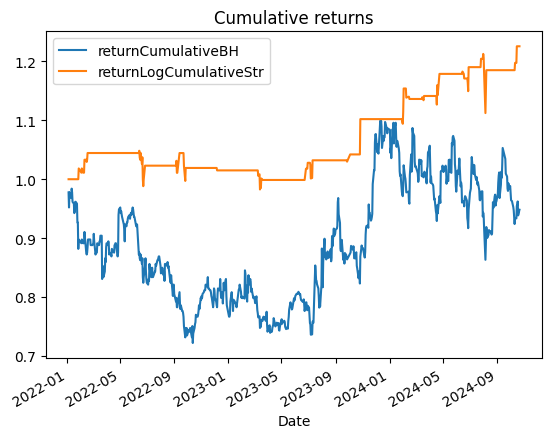

In [248]:

def calcI(_df, window=14):
    delta = _df['Close'].diff()  # 가격 변화량 계산
    gain = delta.where(delta > 0, 0)  # 양수 변화만 남김 (상승)
    loss = -delta.where(delta < 0, 0)  # 음수 변화만 양수로 변환 (하락)

    gainAvg = gain.rolling(window=window).mean()
    lossAvg = loss.rolling(window=window).mean()

    rs = gainAvg / lossAvg  # 상대 강도 (RS) 계산
    rsi = 100 - (100 / (1 + rs))  # RSI 계산

    _df['RSI'] = rsi  # 데이터프레임에 추가
    return _df

def applyStrategy(_df, buy_threshold=30, sell_threshold=70):
    _df['position'] = 0  # 초기 포지션 (0: 보유 없음)

    # 매수 신호: RSI <= 30
    _df.loc[_df['RSI'] <= buy_threshold, 'position'] = 1

    # 매도 신호: RSI >= 70
    _df.loc[_df['RSI'] >= sell_threshold, 'position'] = 0

    # 포지션 변화 계산 (이전 포지션과의 차이)
    _df['signal'] = _df['position'].diff()

    return _df

def calcReturns(_df):
    import numpy as np
    _df['returnDaily'] = _df['Close'].pct_change()
    # 아래는 np.log(_df['Close']/_df['Close'].shift(1)) 계산과 동일
    _df["returnLogDaily"] = _df["Close"].apply(np.log).diff(1) 
    _df["returnCumulativeBH"] = _df["returnLogDaily"].cumsum().apply(np.exp)
    # RSI 전략 수익률 계산
    _df['returnStrategy'] = _df['returnDaily'] * _df['position'].shift(1)
    _df['returnLogStrategy'] = _df['returnLogDaily'] * _df['position'].shift(1)
    _df['returnCumulativeStr'] = (1 + _df['returnStrategy']).cumprod() - 1
    _df['returnLogCumulativeStr'] = _df["returnStrategy"].cumsum().apply(np.exp)
    return _df

sds=yf.download('018260.KS', start='2022-01-01', end='2024-10-22')

_df=sds.copy()

_df = calcI(_df)

_df = applyStrategy(_df)

_df = calcReturns(_df)

print(_df[['Close', 'RSI', 'position', "returnCumulativeBH", 'returnStrategy', "returnLogCumulativeStr"]].tail())
_df[["returnCumulativeBH", "returnLogCumulativeStr"]].plot(title="Cumulative returns")